# Marlow Case - TripleTen DS Course - Final Project
# Churn Prediction: Identifying At-Risk Customers for Interconnect's Retention Strategies
---

# Table of Contents
<a id='contents'></a>

- [1. Introduction](#intro)
    - Purpose
    - Services Summary
    - Challenges
    - Objectives
- [2. Initializations](#init)
- [3. Data Exploration](#explore)
    - [3.1 Contract](#con)
    - [3.2 Internet](#internet)
    - [3.3 Personal](#pers)
    - [3.4 Phone](#phone)
    - [3.5 Conclusion](#exp_conclude)
- [4. Data Preprocessing](#pp)
    - [4.1 Merging the Datasets](#merge)
    - [4.2 Implementing Data Fixes](#fixes)
    - [4.3 Feature Engineering](#eng)
        - Tenure
        - Service Types
        - Number of Internet Services
        - Payment Method Reduction
        - Quarters
- [5. Exploratory Data Analysis](#EDA)
    - [5.1 Numerical Features](#num_feats)
    - [5.2 Categorical Features](#cat_feats)
        - [5.2.1 Chi-Squared Tests](#chi_test)
    - [5.3 Distribution of the Target Class](#targ_dist)
    - [5.4 Monthly Payments](#month_pay)
    - [5.5 Percentages of Clients by Service Type](#serv_type)
    - [5.6 Client Inflow and Outflow](#in+out)
    - [5.7 Correlation Matrix](#corr)
    - [5.8 Conclusion](#eda_summ)
- [6. Model Development](#mod_dev)
    - [6.1 Prepare Features & Target](#mod_prep)
    - [6.2 Addressing Class Imbalance](#imbalance)
    - [6.3 Model Performance Analysis Across Imbalance Correction Methods](#imbal_fix)
    - [6.4 Methodology](#meth)
- [7. Model Training](#training)
    - [7.1 Methodology](#meth)
    - [7.2 Base Model](#base_tune)
    - [7.3 Decision Tree](#tree_tune)
    - [7.4 LogR](#logr_tune)
    - [7.5 Decision Tree with Adaptive Boosting](#ada_tune)
    - [7.6 CatBoost](#cat_tune)
    - [7.7 XGBoost](xgb_tune)
    - [7.8 LightGBM](#lgbm_tune)
    - [7.9 Histogram Gradient Boosting](#hist_tune)
    - [7.10 Neural Network](#net_tune)
    - [7.11 Stacking Ensemble](#stack_tune)
- [8. Final Model Selection & Evaluation](#final)
    - [8.1 Final Model Selection](#final_model)
    - [8.2 Feature Importances](#importances)
    - [8.3 Evaluation of the FInal Model on the Test Set](#final_eval)
- [9. General Conclusion](#finally)
- [10. Recommendations](#recs)
- [Appendix A: Saving Models](#apx_A)
- [Appendix B: Preprocessing Notes](#apx_B)
- [Appendix C: Work Plan](#the_plan)
- [Appendix D: Challenges Faced](#challenges)

# 1. Introduction
<a id='intro'></a>

---

## 1.1 Purpose

The telecom operator Interconnect would like to be able to forecast their churn of clients. If it's discovered that a user is planning to leave, they will be offered promotional codes and special plan options. Interconnect's marketing team has collected some of their clientele's personal data, including information about their plans and contracts. 

## 1.2 Services Summary

Interconnect provides two types of services:

1. **Landline communication:** The telephone can be connected to several lines simultaneously.
2. **Internet:** The network can be set up via a `telephone line` (DSL, digital subscriber line) or through a `fiber optic cable`.
    - Antivirus Software (*DeviceProtection*)
    - Malicious Website Blocker (*OnlineSecurity*)
    - Technical Support (*TechSupport*)
    - Cloud Storage and Data Backup Services (*OnlineBackup*)
    - TV Streaming (*StreamingTV*)
    - Movie Directory (*StreamingMovies*)

The clients can choose between a `monthly payment plan` or a `1-year or 2-year contract`.

## 1.3 Challenges

From the description, Interconnect faces two key challenges in addressing customer churn predictions:

1. What are the common traits or patterns among clients who have left?
2. How accurately can customer churn be predicted using machine learning models?

## 1.4 Objectives

1. Identify the characteristics or behaviors that distinguish between active clients and those who are at-risk, enabling proactive intervention strategies.
2. Develop a machine learning model with an **AUC-ROC score of at least 0.85**.

## 1.5 ML Optimization
In previous projects I have always stuck to one method of optimization. In this project I will be combining methods. Each Machine Learning model will be optimized on a wide parameter grid using Bayesian optimization and then further searched with a smaller parameter grid based on the bayesian optimization using GridSearch.

[Back to Contents](#contents)

# 2. Initializations
<a id='init'></a>

---

In [1]:
import pandas as pd
import numpy as np
import math
import time
import inflection
import os

from sklearn.utils import shuffle

# load models
from joblib import dump, load

# visualizations
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency

# ML prep
from sklearn.model_selection import (train_test_split, cross_val_score, 
                                    StratifiedKFold, cross_validate)
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.over_sampling import KMeansSMOTE
from imblearn.over_sampling import RandomOverSampler


# ML metrics
from skopt import BayesSearchCV
from skopt.space import Integer, Categorical
from sklearn.model_selection import GridSearchCV
import sklearn.metrics as metrics

import optuna

# ML models - may need more for the stack
from imblearn.pipeline import Pipeline
from sklearn.base import clone
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (AdaBoostClassifier, HistGradientBoostingClassifier, 
                                StackingClassifier, RandomForestClassifier)
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout, LeakyReLU
from tensorflow.keras.optimizers import Adam, Nadam
from tensorflow.keras import regularizers
from tensorflow_addons.losses import SigmoidFocalCrossEntropy
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

import warnings
warnings.filterwarnings('ignore')

C:\Users\marlo\.conda\envs\tf\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# load train times
train_times = load("train_times.joblib")
print("Loaded train_times")

train_times

Loaded train_times


{'Tree Base': 27.51,
 'Tree': 23.91,
 'LogR Base': 19.11,
 'LogR': 32.14,
 'Ada Base': 209.98,
 'Ada': 444.15,
 'Cat Base': 2850.95,
 'Cat': 745.21,
 'XGB Base': 227.31,
 'XGB': 68.91,
 'LGBM Base': 76.1,
 'LGBM': 149.79,
 'HGB Base': 306.54,
 'HGB': 510.43,
 'NN': 52612.61,
 'Stack': 5000.33}

In [3]:
# Load saved models
# filename = what the file is called in the directory
# var_name = the name of the variable the model is saved to in the code 
best_models = {}

for filename in os.listdir("best_models"):
    if filename.endswith(".joblib"):
        model_name = filename.replace(".joblib", "") #remove .joblib
        best_models[model_name] = load(os.path.join("best_models", filename))
        print(f"Successfully loaded {model_name}")

Successfully loaded Ada Base
Successfully loaded Ada
Successfully loaded Cat Base
Successfully loaded Cat
Successfully loaded HGB Base
Successfully loaded HGB
Successfully loaded LGBM Base
Successfully loaded LGBM
Successfully loaded LogR Base
Successfully loaded LogR
Successfully loaded Stack
Successfully loaded Tree Base
Successfully loaded Tree
Successfully loaded XGB Base
Successfully loaded XGB


In [4]:
# Configure matplotlib
%config InlineBackend.figure_format = 'retina'

In [5]:
# remove column limit
pd.set_option("display.max_columns", None)

In [6]:
# set optuna verbosity level
optuna.logging.set_verbosity(optuna.logging.WARNING)

[Back to Contents](#contents)

# 3. Data Exploration
<a id='explore'></a>

---
The following functions will aid in the automation of tasks in this section. 

In [7]:
def info_samp_shape(df, n = 5):
    '''
    Function to output n sample rows and the shape of the 
    given DataFrame. 
    Input parameter must be a DataFrame. 
    '''
    # Observe info
    print('\033[1m' + "Info Statement:" + '\033[0m')
    display(df.info())
    print('-'*46, '\n')
    
    # Observe the df
    print('\033[1m' + "Sample Rows:" + '\033[0m')
    display(df.sample(n, random_state=42))
    print('-'*140, '\n')

    # Observe shape
    print('\033[1m' + "Shape:" + '\033[0m')
    display(df.shape)
    print('-'*9, '\n')

In [8]:
def simple_explore(df):
    '''
    Function that applies basic pandas methods to perform data analysis
    on the given DataFrame. The function will return the number of duplicates, 
    the number of missing values, and a describe statement.
    Input must be a DataFrame. 
    '''

    # Observe duplicates
    print('\033[1m' + "Duplicate Rows:" + '\033[0m')
    display(df.duplicated().sum())
    print('-'*15, '\n')

    # Observe null values
    print('\033[1m' + "Null Values:" + '\033[0m')
    display(df.isna().sum())
    print('-'*22, '\n')

    # Observe describe
    print('\033[1m' + "DataFrame Description:" + '\033[0m')
    display(df.describe(include = 'all'))
    print('-'*130)

The provided data consits of files obtained from different sources:

- `contract.csv` - contract information
- `personal.csv` - the client's personal data
- `internet.csv` - information about internet services
- `phone.csv`    - information about telephone services

In each file, the column `customerID` contains a unique code assigned to each client. 

For each column of each dataset, it is important to consider the following:
- Type of data
- % of missing values
- Noisiness level
    - Standard Deviation Analysis
    - Signal-to-Noise Ratio
    - Correlation to Target
- Relevance
- Type of distribution

Let's begin the investigation by loading the datasets. 

In [9]:
# load the datasets
filepath = r"C:\Users\marlo\OneDrive\Desktop\Python_Work\TripleTen_Lessons\Sprint_17_Project"

try:
    df_con = pd.read_csv(f"{filepath}\\contract.csv")
    df_int = pd.read_csv(f"{filepath}\\internet.csv")
    df_per = pd.read_csv(f"{filepath}\\personal.csv")
    df_pho = pd.read_csv(f"{filepath}\\phone.csv")
except:
    df_con = pd.read_csv("/datasets/contract.csv")
    df_int = pd.read_csv("/datasets/internet.csv")
    df_per = pd.read_csv("/datasets/personal.csv")
    df_pho = pd.read_csv("/datasets/phone.csv")

print('Datasets loaded successfully.')

Datasets loaded successfully.


=================================================================================================================

## 3.1 Contract
<a id='con'></a>

In [10]:
info_samp_shape(df_con)

Info Statement:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
dtypes: float64(1), object(7)
memory usage: 440.3+ KB


None

---------------------------------------------- 

Sample Rows:


,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
185,1024-GUALD,2019-10-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,24.80,24.8
2715,0484-JPBRU,2016-09-01,No,Month-to-month,Yes,Bank transfer (automatic),25.25,996.45
3825,3620-EHIMZ,2015-10-01,No,Two year,No,Mailed check,19.35,1031.7
1807,6910-HADCM,2019-09-01,2019-10-01 00:00:00,Month-to-month,No,Electronic check,76.35,76.35
132,8587-XYZSF,2014-07-01,No,Two year,No,Bank transfer (automatic),50.55,3260.1


-------------------------------------------------------------------------------------------------------------------------------------------- 

Shape:


(7043, 8)

--------- 



In the `contract` dataset there are 7043 rows and 8 columns detailing the client's contract information. 

**Data Description**
- `customerID`: A unique identifier for the client
- `BeginDate`: The date when the client started using our services.
- `EndDate`: The date the client terminated their existing contract.
    - A value of **No** indicates that the client is still using our services (_is an active client_).
- `Type`: The contract's payment subscription (_monthly, annually, bi-annually_).
- `PaperlessBilling`: Binary flag field describing whether the client is subscribed to digital billing.
- `PaymentMethod`: The method of payment for the subscribed services (_Eletronic Check, Mailed Check, etc._).
- `MonthlyCharges`: The amount charged to the client on a monthly basis.
- `TotalCharges`: The amount charged to the client over the lifespan of their subscription.

**Issues for Preprocessing:**
- The column labels are currently in pascal case and need to be **converted to snake case**.
- The `EndDate` column contains non-date values and therefore need to be replaced with a more appropriate value.
    - We will first replace the `No` values with `None` and then convert to datetime.
    - `BeginDate` also needs to be converted to datetime.

**Other Issues to Explore:**
- `TotalCharges` is an object datatype and not a float64. This implies there are non-numeric values present in the column and further exploration will be required.
- *We don't have clarification on `MonthlyCharges` or `TotalCharges`, additional investigation may be required to understand these columns.* 

**Feature Engineering Possibilities**
- Tenure for years, months, and days
- Creating a dedicated `active` or `churned` column --> binary flag indicating if the client is active or has churned

In [11]:
simple_explore(df_con)

Duplicate Rows:


0

--------------- 

Null Values:


customerID          0
BeginDate           0
EndDate             0
Type                0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
dtype: int64

---------------------- 

DataFrame Description:


,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
count,7043,7043,7043,7043,7043,7043,7043.000000,7043
unique,7043,77,5,3,2,4,NaN,6531
top,7590-VHVEG,2014-02-01,No,Month-to-month,Yes,Electronic check,NaN,
freq,1,366,5174,3875,4171,2365,NaN,11
mean,NaN,NaN,NaN,NaN,NaN,NaN,64.761692,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,30.090047,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,18.250000,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,35.500000,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,70.350000,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,89.850000,NaN


----------------------------------------------------------------------------------------------------------------------------------


According to the outputs, there are no duplicate customers and although no null values in `TotalCharges`, the describe output says otherwise. There is clearly a blank value that occurs in 11 of the rows in this dataset, and this may be the cause of the object datatype. 

Also, the Coefficient of Variation on `MonthlyCharges` is around 46%, indicating high variability and could potentially result in high noise. However, given the context of the data, this noise is to be expected and not of concern as there are multiple groups of clients in this data due to differences in subscription packages. This does provide good reason to normalize the data. Therefore, other than `TotalCharges` there are no other anomalous values. 

In [12]:
# Observe TotalCharges
tcharges_blank = df_con.query("TotalCharges == ' '")
print('# of values with one space:', len(tcharges_blank))
print()
tcharges_blank

# of values with one space: 11



,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
488,4472-LVYGI,2020-02-01,No,Two year,Yes,Bank transfer (automatic),52.55,
753,3115-CZMZD,2020-02-01,No,Two year,No,Mailed check,20.25,
936,5709-LVOEQ,2020-02-01,No,Two year,No,Mailed check,80.85,
1082,4367-NUYAO,2020-02-01,No,Two year,No,Mailed check,25.75,
1340,1371-DWPAZ,2020-02-01,No,Two year,No,Credit card (automatic),56.05,
3331,7644-OMVMY,2020-02-01,No,Two year,No,Mailed check,19.85,
3826,3213-VVOLG,2020-02-01,No,Two year,No,Mailed check,25.35,
4380,2520-SGTTA,2020-02-01,No,Two year,No,Mailed check,20.00,
5218,2923-ARZLG,2020-02-01,No,One year,Yes,Mailed check,19.70,
6670,4075-WKNIU,2020-02-01,No,Two year,No,Mailed check,73.35,


According to the marketing team, the contract information is valid as of February 1, 2020. As we can see, these clients have begun their subscription to our services at the tail end of our dataset - they don't even have a days worth of tenure according to this dataset - and I believe these clients will **not be useful in training or assessing a predictive model**. Therefore, we will be removing these clients and we will be able to convert `TotalCharges` to float64.

However, I'm glad that these clients existed because it raises a question of whether the current `MonthlyCharges` have been reflected into the `TotalCharges`, and because these are blank, that should tell us that they have not been reflected. So we can add the monthly charges to the total charges. 

Let's save their IDs for later so that they can be removed cleanly across all datasets when they are combined. 

In [13]:
ids_to_remove = [id for id in tcharges_blank['customerID']]
ids_to_remove

['4472-LVYGI',
 '3115-CZMZD',
 '5709-LVOEQ',
 '4367-NUYAO',
 '1371-DWPAZ',
 '7644-OMVMY',
 '3213-VVOLG',
 '2520-SGTTA',
 '2923-ARZLG',
 '4075-WKNIU',
 '2775-SEFEE']

I will now update [Appendix B](#apx_B) with our preprocessing notes. 

=================================================================================================================

## 3.2 Internet
<a id='internet'></a>

In [14]:
info_samp_shape(df_int, 10)

Info Statement:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 0 to 5516
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   customerID        5517 non-null   object
 1   InternetService   5517 non-null   object
 2   OnlineSecurity    5517 non-null   object
 3   OnlineBackup      5517 non-null   object
 4   DeviceProtection  5517 non-null   object
 5   TechSupport       5517 non-null   object
 6   StreamingTV       5517 non-null   object
 7   StreamingMovies   5517 non-null   object
dtypes: object(8)
memory usage: 344.9+ KB


None

---------------------------------------------- 

Sample Rows:


,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
1615,1170-SASML,Fiber optic,No,Yes,Yes,No,No,No
1874,9314-QDMDW,DSL,No,Yes,No,No,Yes,No
3167,2434-EEVDB,Fiber optic,Yes,No,Yes,No,Yes,No
5287,7672-VFMXZ,DSL,Yes,No,No,Yes,No,No
4770,7445-WMRBW,DSL,No,Yes,Yes,Yes,Yes,No
3660,7036-ZZKBD,DSL,No,No,Yes,Yes,No,Yes
2943,7479-NITWS,Fiber optic,No,No,Yes,No,Yes,No
1471,3062-ICYZQ,Fiber optic,Yes,Yes,No,No,No,Yes
2459,5924-IFQTT,DSL,No,Yes,Yes,Yes,Yes,No
3226,4826-TZEVA,Fiber optic,No,Yes,No,No,No,No


-------------------------------------------------------------------------------------------------------------------------------------------- 

Shape:


(5517, 8)

--------- 



In the `internet` dataset there are 5517 rows and 8 columns detailing the client's internet-related information packages. 

**Data Description**
- `customerID`: A unique identifier for the client.
- `InternetService`: Details the type of internet hookup the client has (_DSL or Fiber optic_).
- `OnlineSecurity`: Binary flag indicating whether client is subscribed to the malware blocker. 
- `OnlineBackup`: Binary flag indicating whether the client is subscribed to the cloud storage and backup services.
- `DeviceProtection`: Binary flag indicating whether the client is subscribed to the antivirus software. 
- `TechSupport`: Binary flag indicating whether the client is subscribed to the technical support line.
- `StreamingTV`: Binary flag indicating whether the client is subscribed to TV streaming.
- `StreamingMovies`: Binary flag indicating whether the client is subscribed to the movie directory. 

**Issues for Preprocessing:**
- Manually convert the binary fields to 0/1, this will overall reduce the number of features after applying OHE for our models. Having OHE handle these binary fields does not add much value, and only increases the number of features.
- Convert the column labels from pascal case to snake case.

No other issues to explore. 

In [15]:
simple_explore(df_int)

Duplicate Rows:


0

--------------- 

Null Values:


customerID          0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
dtype: int64

---------------------- 

DataFrame Description:


,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
count,5517,5517,5517,5517,5517,5517,5517,5517
unique,5517,2,2,2,2,2,2,2
top,7590-VHVEG,Fiber optic,No,No,No,No,No,No
freq,1,3096,3498,3088,3095,3473,2810,2785


----------------------------------------------------------------------------------------------------------------------------------


It appears the most popular internet hookup is Fiber Optic and most clients are not subscribed to the additional services. 

I will now update [Appendix B](#apx_B) with our preprocessing notes. 

=================================================================================================================

## 3.3 Personal
<a id='pers'></a>

In [16]:
info_samp_shape(df_per)

Info Statement:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     7043 non-null   object
 1   gender         7043 non-null   object
 2   SeniorCitizen  7043 non-null   int64 
 3   Partner        7043 non-null   object
 4   Dependents     7043 non-null   object
dtypes: int64(1), object(4)
memory usage: 275.2+ KB


None

---------------------------------------------- 

Sample Rows:


,customerID,gender,SeniorCitizen,Partner,Dependents
185,1024-GUALD,Female,0,Yes,No
2715,0484-JPBRU,Male,0,No,No
3825,3620-EHIMZ,Female,0,Yes,Yes
1807,6910-HADCM,Female,0,No,No
132,8587-XYZSF,Male,0,No,No


-------------------------------------------------------------------------------------------------------------------------------------------- 

Shape:


(7043, 5)

--------- 



In the `personal` dataset there are 7043 rows and 5 columns detailing information related to the specific client. 

**Data Description**
- `customerID`: A unique identifier for the client.
- `gender`: Binary field indicating whether the client is male or female.
- `SeniorCitizen`: Binary field indicating whether the client is a senior citizen (_65 in the U.S._).
- `Partner`: Binary flag indicating whether the client has a partner or is single.
- `Dependents`: Binary flag indicating whether the client has other family members in the household they provide for.  

**Issues for Preprocessing:**
- Manually convert the binary fields to 0/1, this will overall reduce the number of features after applying OHE for our models.
    - In this case specifically convert `Partner` and `Dependents` as gender will be handled by OHE and `SeniorCitizen` is already numeric.
    - Convert the binary fields to **Int64**
- Convert the column labels from pascal case to snake case.

No other issues to explore. 

In [17]:
simple_explore(df_per)

Duplicate Rows:


0

--------------- 

Null Values:


customerID       0
gender           0
SeniorCitizen    0
Partner          0
Dependents       0
dtype: int64

---------------------- 

DataFrame Description:


,customerID,gender,SeniorCitizen,Partner,Dependents
count,7043,7043,7043.000000,7043,7043
unique,7043,2,NaN,2,2
top,7590-VHVEG,Male,NaN,No,No
freq,1,3555,NaN,3641,4933
mean,NaN,NaN,0.162147,NaN,NaN
std,NaN,NaN,0.368612,NaN,NaN
min,NaN,NaN,0.000000,NaN,NaN
25%,NaN,NaN,0.000000,NaN,NaN
50%,NaN,NaN,0.000000,NaN,NaN
75%,NaN,NaN,0.000000,NaN,NaN


----------------------------------------------------------------------------------------------------------------------------------


There are no further concerns let's update [Appendix B](#apx_B) with our notes.

=================================================================================================================

## 3.4 Phone
<a id='phone'></a>

In [18]:
info_samp_shape(df_pho)

Info Statement:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 0 to 6360
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     6361 non-null   object
 1   MultipleLines  6361 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB


None

---------------------------------------------- 

Sample Rows:


,customerID,MultipleLines
4743,5887-IKKYO,Yes
4825,7718-UPSKJ,No
472,3571-DPYUH,Yes
2722,3769-MHZNV,No
932,6732-FZUGP,Yes


-------------------------------------------------------------------------------------------------------------------------------------------- 

Shape:


(6361, 2)

--------- 



In the `phone` dataset there are 6361 rows and 2 columns detailing information related whether the listed client is subscribed to multiple phone lines. Clients present in the dataset are subscribed to *landline communication*, if any clients are not present, then they would be not-subscribed. This will come in handy later when combining the datasets. 

**Data Description**
- `customerID`: A unique identifier for the client.
- `MultipleLines`: A binary flag indicating whether the client is subscribed to multiple phone lines.  

**Issues for Preprocessing:**
- Manually convert `MultipleLines` to 0/1, for reasons already provided.
    - **Convert the field to int64**.
- Convert column labels from pascal to snake case. 


No other issues to explore.

In [19]:
simple_explore(df_pho)

Duplicate Rows:


0

--------------- 

Null Values:


customerID       0
MultipleLines    0
dtype: int64

---------------------- 

DataFrame Description:


,customerID,MultipleLines
count,6361,6361
unique,6361,2
top,5575-GNVDE,No
freq,1,3390


----------------------------------------------------------------------------------------------------------------------------------


Looks as if most clients subscribed to landline communication have only a single line. 

I will now update [Appendix B](#apx_B) with our preprocessing notes.

## Continuity Check

Before moving on, let's ensure that there are no customers in the subsets of internet and phone that are not present in the contract dataset. 

In [20]:
con_ids = set(df_con['customerID'])
missing_ids_int = [id for id in df_int['customerID'] if id not in con_ids]
missing_ids_pho = [id for id in df_con['customerID'] if id not in con_ids]

display(missing_ids_int)
display(missing_ids_pho)

[]

[]

It looks like our datasets are free of continuity/entry errors!

## 3.5 Conclusion
<a id='exp_conclude'></a>

The provided dataset has been split into 4 categories to describe client subscription information: contract info and personal info. All 7043 clients are present in these two datasets. They are then broken down by *internet services* and *landline communication services* - where not all 7043 clients are present in each set respectively, but we determined there are no clients present in the subsets that are not also present in the main set. 

The issues found during exploration have been orgainzed inside of [Appendix B](#apx_B), please review that for the changes to be made during preprocessing. 

[Back to Contents](#contents)

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;">
    <strong>I really liked the modular approach of using functions like info_samp_shape and simple_explore. Great approach to encapsulate repetitive tasks effectively. This definitely encouraged code reusability.</strong>
</div>

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;">
    <strong>The use of descriptive comments and docstrings makes the purpose and usage of the functions clear.</strong>
</div>


<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;">
    <strong>The simple_explore function covers crucial exploratory steps such as identifying duplicates, missing values, and providing descriptive statistics.</strong>
</div>


<div style="border: 2px solid darkblue; padding: 10px; background-color: #d4e4f7; color: black; border-radius: 5px;">
    <strong>Suggestion: The repeated calls to info_samp_shape and simple_explore for different DataFrames (df_con, df_int, etc.) could be optimized by iterating through a list of DataFrames. This will make the code more concise.<strong><br>
</div>

# 4. Data Preprocessing
<a id='pp'></a>

---

## 4.1 Merge the Datasets
<a id='merge'></a>

Since `customerID` is shared amongst all datasets, and two are subsets of the main contract and personal sets, we can combine them back into one dataset for ease of analysis. 

Since the contract and personal sets have the same customer ids, an inner join will suffice. 

In [21]:
data = df_con.merge(df_per, on = 'customerID', how = 'inner').merge( # merge personal via inner
    df_int, on = 'customerID', how = 'left').merge(    # merge two subsets via left join
        df_pho, on = 'customerID', how = 'left'
    )

# confirm merge
data.head(1)

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,gender,SeniorCitizen,Partner,Dependents,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,MultipleLines
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,29.85,Female,0,Yes,No,DSL,No,Yes,No,No,No,No,NaN


In [22]:
info_samp_shape(data)

Info Statement:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
 8   gender            7043 non-null   object 
 9   SeniorCitizen     7043 non-null   int64  
 10  Partner           7043 non-null   object 
 11  Dependents        7043 non-null   object 
 12  InternetService   5517 non-null   object 
 13  OnlineSecurity    5517 non-null   object 
 14  OnlineBackup      5517 non-null   object 
 15  DeviceProtection  5517 non-null   object 
 16  TechSupport       5517 non

None

---------------------------------------------- 

Sample Rows:


,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,gender,SeniorCitizen,Partner,Dependents,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,MultipleLines
185,1024-GUALD,2019-10-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,24.80,24.8,Female,0,Yes,No,DSL,No,No,No,No,No,No,NaN
2715,0484-JPBRU,2016-09-01,No,Month-to-month,Yes,Bank transfer (automatic),25.25,996.45,Male,0,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes
3825,3620-EHIMZ,2015-10-01,No,Two year,No,Mailed check,19.35,1031.7,Female,0,Yes,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No
1807,6910-HADCM,2019-09-01,2019-10-01 00:00:00,Month-to-month,No,Electronic check,76.35,76.35,Female,0,No,No,Fiber optic,No,No,Yes,No,No,No,No
132,8587-XYZSF,2014-07-01,No,Two year,No,Bank transfer (automatic),50.55,3260.1,Male,0,No,No,DSL,No,No,No,Yes,No,No,No


-------------------------------------------------------------------------------------------------------------------------------------------- 

Shape:


(7043, 20)

--------- 



In order to be a client, the end-user must have subscribed to either landline communication or internet services, but not every client is subscribed to both; this is why we are observing some null values. Therefore, we will simply fill these missing values with "Not Subscribed."

By the shape of the dataset we know that the merging of the DataFrames was successful. Let's fill those missing values.

In [23]:
# cols with missing values
na_cols = [col for col in data.columns if data[col].isna().sum() > 0]
display(na_cols)

# fill the missing values
data[na_cols] = data[na_cols].fillna("not_subscribed")
print('\n' + 'All missing values have been filled.')

['InternetService',
 'OnlineSecurity',
 'OnlineBackup',
 'DeviceProtection',
 'TechSupport',
 'StreamingTV',
 'StreamingMovies',
 'MultipleLines']


All missing values have been filled.


In [24]:
# confirm
for col in na_cols:
    print(data[col].value_counts())
    print('Number of values in column:', len(data[col]))
    print('-'*32)

InternetService
Fiber optic       3096
DSL               2421
not_subscribed    1526
Name: count, dtype: int64
Number of values in column: 7043
--------------------------------
OnlineSecurity
No                3498
Yes               2019
not_subscribed    1526
Name: count, dtype: int64
Number of values in column: 7043
--------------------------------
OnlineBackup
No                3088
Yes               2429
not_subscribed    1526
Name: count, dtype: int64
Number of values in column: 7043
--------------------------------
DeviceProtection
No                3095
Yes               2422
not_subscribed    1526
Name: count, dtype: int64
Number of values in column: 7043
--------------------------------
TechSupport
No                3473
Yes               2044
not_subscribed    1526
Name: count, dtype: int64
Number of values in column: 7043
--------------------------------
StreamingTV
No                2810
Yes               2707
not_subscribed    1526
Name: count, dtype: int64
Number of value

Now that the dataset is filled with missing values from the merge, the merge is complete. Now we will address the discovered issues during data exploration.

[Back to Contents](#contents)

## 4.2 Implementing Data Fixes
<a id='fixes'></a>

### Convert Column Labels to Snake Case

In [25]:
# Convert from pascal to snake
data.columns = [inflection.underscore(col) for col in data.columns]
data.columns

Index(['customer_id', 'begin_date', 'end_date', 'type', 'paperless_billing',
       'payment_method', 'monthly_charges', 'total_charges', 'gender',
       'senior_citizen', 'partner', 'dependents', 'internet_service',
       'online_security', 'online_backup', 'device_protection', 'tech_support',
       'streaming_tv', 'streaming_movies', 'multiple_lines'],
      dtype='object')

### Create Target

In [26]:
# 1 if churned, 0 if active
data['churned'] = np.where(data['end_date'] == 'No', 0, 1)

# observe
data[['end_date', 'churned']].sample(5, random_state = 12)

,end_date,churned
6235,2020-01-01 00:00:00,1
3980,2019-12-01 00:00:00,1
6548,No,0
3954,No,0
5328,No,0


### Correct Datatypes

In [27]:
# replace No with None
data['end_date'] = np.where(data['end_date'] == 'No', np.nan, data['end_date'])

# replace blanks with 0 in total_charges
data['total_charges'] = np.where(data['total_charges'] == ' ', 0, data['total_charges'])

In [28]:
data['begin_date'] = pd.to_datetime(data['begin_date'], format = '%Y-%m-%d')
data['end_date'] = pd.to_datetime(data['end_date'], format = '%Y-%m-%d %H:%M:%S').dt.date
data['end_date'] = pd.to_datetime(data['end_date'], format = '%Y-%m-%d') # remove the time component

data['total_charges'] = data['total_charges'].astype('float64')

In [29]:
# observe changes
display(data[['begin_date', 'end_date', 'total_charges']].dtypes)
print()
data.tail()

begin_date       datetime64[ns]
end_date         datetime64[ns]
total_charges           float64
dtype: object

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,churned
7038,6840-RESVB,2018-02-01,NaT,One year,Yes,Mailed check,84.80,1990.50,Male,0,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,Yes,0
7039,2234-XADUH,2014-02-01,NaT,One year,Yes,Credit card (automatic),103.20,7362.90,Female,0,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,Yes,0
7040,4801-JZAZL,2019-03-01,NaT,Month-to-month,Yes,Electronic check,29.60,346.45,Female,0,Yes,Yes,DSL,Yes,No,No,No,No,No,not_subscribed,0
7041,8361-LTMKD,2019-07-01,2019-11-01,Month-to-month,Yes,Mailed check,74.40,306.60,Male,1,Yes,No,Fiber optic,No,No,No,No,No,No,Yes,1
7042,3186-AJIEK,2014-08-01,NaT,Two year,Yes,Bank transfer (automatic),105.65,6844.50,Male,0,No,No,Fiber optic,Yes,No,Yes,Yes,Yes,Yes,No,0


### Correct Total Charges

We determined that the current monthly charges are not reflected in the total charges. Simply adding them will produce a new correct total charges. In addition, this corrects our initial assumption that the clients with no information were brand new and should be removed from the dataset. Since this is not true, we will leave these individuals in the dataset.  

In [30]:
data['total_charges'] = (data['total_charges'] + data['monthly_charges']).where(
    data['churned'] == 0, data['total_charges'])

### Convert Binary Flag Fields to Numerics

Since we've updated most columns with 'not_subscribed' when combining the datasets, this made most of the binary fields no longer binary. Let's see if any binary fields remain. 

In [31]:
cols_to_conv = []

for col in data.columns:
    if len(data[col].unique()) == 2:
        cols_to_conv.append(col)

cols_to_conv

['paperless_billing',
 'gender',
 'senior_citizen',
 'partner',
 'dependents',
 'churned']

Let's carefully assess these columns as to make sure to not introduce unintentional ordinal relationships. There should be little risk of doing so except for in linear models. OHE will handle the categorical conversion to numerics for fields that are not strictly binary; we could technincally still perform the manual assignments, but there's no real advantage in doing so. 

In [32]:
for col in cols_to_conv:
    print("\033[1m" + f"Unique values in {col}:" + "\033[0m")
    print(data[col].unique())
    print('-'*35, '\n')

Unique values in paperless_billing:
['Yes' 'No']
----------------------------------- 

Unique values in gender:
['Female' 'Male']
----------------------------------- 

Unique values in senior_citizen:
[0 1]
----------------------------------- 

Unique values in partner:
['Yes' 'No']
----------------------------------- 

Unique values in dependents:
['No' 'Yes']
----------------------------------- 

Unique values in churned:
[0 1]
----------------------------------- 



`senior_citizen` was provided to us as a binary numeric while the others were not. For the best model compatibility, we will convert `paperless_billing`, `partner`, and `dependents` to binary numeric fields. OHE will handle `gender` to avoid oridnal relationship introduction. 

In [33]:
cols_to_conv.pop(5)


'churned'

In [34]:
cols_to_conv.pop(1)

'gender'

In [35]:
cols_to_conv.pop(1)

'senior_citizen'

In [36]:
for col in cols_to_conv:
    data[col] = np.where(data[col] == 'Yes', 1, 0)
    data[col] = data[col].astype('int64')

In [37]:
# final review
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_id        7043 non-null   object        
 1   begin_date         7043 non-null   datetime64[ns]
 2   end_date           1869 non-null   datetime64[ns]
 3   type               7043 non-null   object        
 4   paperless_billing  7043 non-null   int64         
 5   payment_method     7043 non-null   object        
 6   monthly_charges    7043 non-null   float64       
 7   total_charges      7043 non-null   float64       
 8   gender             7043 non-null   object        
 9   senior_citizen     7043 non-null   int64         
 10  partner            7043 non-null   int64         
 11  dependents         7043 non-null   int64         
 12  internet_service   7043 non-null   object        
 13  online_security    7043 non-null   object        
 14  online_b

In [38]:
data.head()

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,churned
0,7590-VHVEG,2020-01-01,NaT,Month-to-month,1,Electronic check,29.85,59.70,Female,0,1,0,DSL,No,Yes,No,No,No,No,not_subscribed,0
1,5575-GNVDE,2017-04-01,NaT,One year,0,Mailed check,56.95,1946.45,Male,0,0,0,DSL,Yes,No,Yes,No,No,No,No,0
2,3668-QPYBK,2019-10-01,2019-12-01,Month-to-month,1,Mailed check,53.85,108.15,Male,0,0,0,DSL,Yes,Yes,No,No,No,No,No,1
3,7795-CFOCW,2016-05-01,NaT,One year,0,Bank transfer (automatic),42.30,1883.05,Male,0,0,0,DSL,Yes,No,Yes,Yes,No,No,not_subscribed,0
4,9237-HQITU,2019-09-01,2019-11-01,Month-to-month,1,Electronic check,70.70,151.65,Female,0,0,0,Fiber optic,No,No,No,No,No,No,No,1


Everything looks good! 

[Back to Contents](#contents)

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;">
    <strong>Preprocessing looks effective. Perfectly handled key preprocessing tasks such filling missing values, encoding categorical variables, and standardizing column names.</strong>
</div>

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;">
    <strong>Did a logical data transformation by properly using conditional transformations for creating new features like churned and cleaning up end_date and total_charges.</strong>
</div>

## 4.3 Feature Engineering
<a id='eng'></a>

Via [Appendix B](#apx_B) we have outlined some possible additional features that can be created from existing features. Not all of these must be performed as the appendix only serves as a brainstormed list. 

================================================================================================================

The functions below will help automate the tasks in this section. 

In [39]:
def calc_months(start_date, end_date):
    '''
    Calculate the number of months between two dates.
    '''

    year_diff = end_date.year - start_date.year
    month_diff = end_date.month - start_date.month
    total_months = year_diff * 12 + month_diff

    return total_months

In [40]:
def calc_service_type(row):
    '''
    Function to determine the type of service per client.
    '''

    if row['internet_service'] == 'not_subscribed' and row['multiple_lines'] != 'not_subscribed':
        return 'landline_only'

    elif row['internet_service'] != 'not_subscribed' and row['multiple_lines'] == 'not_subscribed':
        return 'internet_only'

    else:
        return 'both'

In [41]:
def calc_pay_type(row):
    '''
    Determines whether the payment method is manual or automatic per client.
    '''

    if 'automatic' in row['payment_method']:
        return 1
    else:
        return 0

In [42]:
# create function
def calc_quarter(row):
    '''
    Function to calculate the quarter the client subscribed. 
    '''

    if row['begin_date'].month in [1, 2, 3]:
        return 'Q1'
    elif row['begin_date'].month in [4, 5, 6]:
        return 'Q2'
    elif row['begin_date'].month in [7, 8, 9]:
        return 'Q3'
    else:
        return 'Q4'

### 4.3.1 Tenure

Since the data is on a monthly cycle, having a tenure of days would be irrelevant, so let's create a tenure in months and years. 

In [43]:
# create current data end date
data_current_date = pd.to_datetime('2020-02-01', format = "%Y-%m-%d")

# apply the function for monthly tenure
data['tenure_months'] = data.apply(
    lambda row: calc_months(row['begin_date'], row['end_date'])
                if row['churned'] == 1
                else calc_months(row['begin_date'], data_current_date),
    axis = 1
)

# observe
data[['begin_date', 'end_date', 'tenure_months', 'churned']].sample(10, random_state = 42)

,begin_date,end_date,tenure_months,churned
185,2019-10-01,2019-11-01,1,1
2715,2016-09-01,NaT,41,0
3825,2015-10-01,NaT,52,0
1807,2019-09-01,2019-10-01,1,1
132,2014-07-01,NaT,67,0
1263,2014-05-01,2020-01-01,68,1
3732,2018-03-01,NaT,23,0
1672,2014-02-01,NaT,72,0
811,2014-02-01,2019-12-01,70,1
2526,2019-11-01,2019-12-01,1,1


In [44]:
# Create tenure_years: rounded to nearest whole year
data['tenure_years'] = (data['tenure_months'] / 12).astype(float)

In [45]:
# observe
data[['begin_date', 'end_date', 'tenure_months', 'tenure_years', 'churned']].sample(10, random_state = 42)

,begin_date,end_date,tenure_months,tenure_years,churned
185,2019-10-01,2019-11-01,1,0.083333,1
2715,2016-09-01,NaT,41,3.416667,0
3825,2015-10-01,NaT,52,4.333333,0
1807,2019-09-01,2019-10-01,1,0.083333,1
132,2014-07-01,NaT,67,5.583333,0
1263,2014-05-01,2020-01-01,68,5.666667,1
3732,2018-03-01,NaT,23,1.916667,0
1672,2014-02-01,NaT,72,6.000000,0
811,2014-02-01,2019-12-01,70,5.833333,1
2526,2019-11-01,2019-12-01,1,0.083333,1


### 4.3.2 Service Types

The goal is to identify if the client is subscribed to _internet services_, _landline services_, or _both_. 

The column for _internet service_ is `internet_service`. The column for _landline services_ is `multiple_lines`.

In [46]:
# apply function
data['service_type'] = data.apply(calc_service_type, axis = 1)

# observe
data[['internet_service', 'multiple_lines', 'service_type']].head()

,internet_service,multiple_lines,service_type
0,DSL,not_subscribed,internet_only
1,DSL,No,both
2,DSL,No,both
3,DSL,not_subscribed,internet_only
4,Fiber optic,No,both


In [47]:
# does anyone have landline only
len(data.query("service_type == 'landline_only'"))

1526

### 4.3.3 Number of Internet Services

In [48]:
# initialize list of cols and mapping for sum
int_services = ['online_security', 'online_backup', 'device_protection', 'tech_support', 'streaming_tv', 'streaming_movies']
service_map = {'Yes': 1, 'No': 0, 'not_subscribed': 0}

data['tot_internet_services'] = data[int_services].apply(
    lambda row: row.map(service_map).sum(), axis = 1
)

In [49]:
# observe
int_services.append('tot_internet_services')

data[int_services].head()

,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,tot_internet_services
0,No,Yes,No,No,No,No,1
1,Yes,No,Yes,No,No,No,2
2,Yes,Yes,No,No,No,No,2
3,Yes,No,Yes,Yes,No,No,3
4,No,No,No,No,No,No,0


## 4.3.4 Payment Method Reduction

In [50]:
# apply function
data['auto_payment'] = data.apply(calc_pay_type, axis = 1)

In [51]:
# observe 
data[['payment_method', 'auto_payment']].sample(5, random_state = 12)

,payment_method,auto_payment
6235,Mailed check,0
3980,Electronic check,0
6548,Mailed check,0
3954,Electronic check,0
5328,Credit card (automatic),1


### 4.3.5 Quarters

We will assign quarters as the following:
- **Quarter 1:** Jan-Mar
- **Quarter 2:** Apr-Jun
- **Quarter 3:** Jul-Sep
- **Quarter 4:** Oct-Dec

We will avoid simply numbering the quarters 1,2,3 and 4 to avoid introducing ordinal relationships. 

In [52]:
# apply function
data['quarter'] = data.apply(
    calc_quarter, axis = 1)

# observe
data[['begin_date', 'quarter']].sample(5, random_state = 5)

,begin_date,quarter
4213,2019-06-01,Q2
5035,2018-06-01,Q2
3713,2016-03-01,Q1
1720,2019-12-01,Q4
234,2017-09-01,Q3


**_For the Record:_**

I attempted to make an average monthly charges feature, but it is practically identical to the monthly charges column we already have and so I have removed it. This can confirm that the monthly charges column provided to us is likely an average. 

In [53]:
# final look
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 27 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   customer_id            7043 non-null   object        
 1   begin_date             7043 non-null   datetime64[ns]
 2   end_date               1869 non-null   datetime64[ns]
 3   type                   7043 non-null   object        
 4   paperless_billing      7043 non-null   int64         
 5   payment_method         7043 non-null   object        
 6   monthly_charges        7043 non-null   float64       
 7   total_charges          7043 non-null   float64       
 8   gender                 7043 non-null   object        
 9   senior_citizen         7043 non-null   int64         
 10  partner                7043 non-null   int64         
 11  dependents             7043 non-null   int64         
 12  internet_service       7043 non-null   object        
 13  onl

Data looks good!

[Back to Contents](#contents)

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;">
    <strong>You did a very thoughtful creation of features such as tenure_months, service_type, auto_payment, and quarter enhances the dataset's value for downstream analysis.</strong>
</div>

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;">
    <strong>Use of lambda functions with apply allows row-wise computations, making the code adaptable to datasets of various sizes and structures.</strong>
</div>

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;">
    <strong>The modular approach with descriptive function names and well-defined inputs makes the code easy to follow and maintain..</strong>
</div>

<div style="border: 2px solid darkblue; padding: 10px; background-color: #d4e4f7; color: black; border-radius: 5px;">
    <strong>Suggestion: consider making data_current_date dynamic by setting it to the current date (pd.Timestamp.today()). This makes the code future-proof for datasets collected after 2020-02-01.<strong>
</div>

# 5. Exploratory Data Analysis (EDA)
<a id='EDA'></a>

---

First let's establish defined variables for the numerical and categorical features. 

In [54]:
not_tracked = ['begin_date', 'end_date', 'customer_id', 'churned']
num_feats = ['monthly_charges', 'total_charges', 'tenure_months', 'tenure_years', 'tot_internet_services']
cat_feats = []

for col in data.columns:
    if col not in not_tracked and col not in num_feats:
        cat_feats.append(col)

cat_feats

['type',
 'paperless_billing',
 'payment_method',
 'gender',
 'senior_citizen',
 'partner',
 'dependents',
 'internet_service',
 'online_security',
 'online_backup',
 'device_protection',
 'tech_support',
 'streaming_tv',
 'streaming_movies',
 'multiple_lines',
 'service_type',
 'auto_payment',
 'quarter']

The following functions will be used to automate tasks in this section. 

In [55]:
def half_rice(n):
    bins = (n ** (1/3)) * 2

    return math.floor(bins / 2)

In [56]:
def graph_numerical_features(df):
    '''
    This function serves to graph the numerical features from the provided data related
    to this project:
    monthly_charges, total_charges, tenure_months, tenure_years, and tot_internet_services.

    Inputs:
    df - dataframe: the data used to plot the numerical features.
    '''

    # Create dictionary for column, labels
    numerical_features = {}
    for col in num_feats:
        numerical_features[col] = inflection.titleize(col)
    numerical_features['tot_internet_services'] = 'Total Internet Services'

    # Initialize chart
    sns.set_style('darkgrid')
    
    layout = [
        ['monthly_charges', 'total_charges'],
        ['tenure_months', 'tenure_years'],
        ['tot_internet_services', 'tot_internet_services']
    ]
    
    fig, axs = plt.subplot_mosaic(mosaic = layout, figsize = (10, 8))
    fig.suptitle("Distribution of Numerical Features", fontsize = 17, fontweight = 'bold')

    # plot charts
    for feature, label in numerical_features.items():
        ax = axs[feature]
        sns.histplot(x = df[feature], 
                     bins = half_rice(len(df[feature])),
                     ax = ax)
        ax.set_title(label, fontsize = 15, fontweight = 'bold')
        ax.set_xlabel(label, fontweight = 'bold')
        ax.set_ylabel("Number of Clients", fontweight = 'bold')

    plt.tight_layout()
    plt.show()

In [57]:
def box_nums_on_target(df, target: str):
    '''
    This function serves to graph the categorical features from the provided data
    related to this project on the target.

    Inputs:
    df - dataframe: the data used to plot the numerical features
    target - string: the target column name
    '''

    # Create dictionary
    numerical_features = {}
    for col in num_feats:
        numerical_features[col] = inflection.titleize(col)
    numerical_features['tot_internet_services'] = 'Total Internet Services'

    # Initialize chart
    sns.set_style('darkgrid')

    layout = [
        ['monthly_charges', 'total_charges'],
        ['tenure_months', 'tenure_years'],
        ['tot_internet_services', 'tot_internet_services']
    ]

    fig, axs = plt.subplot_mosaic(mosaic = layout, figsize = (8, 8))
    fig.suptitle("Distributions of Numerical Features on the Target Class", 
                 fontsize = 15, fontweight = 'bold')
    

    # plot charts
    for feature, label in numerical_features.items():
        ax = axs[feature]
        sns.boxplot(data = df, x = target, y = feature, 
                    hue = target, palette = ['steelblue', 'crimson'], ax = ax)
        ax.set_title(label, fontsize = 12, fontweight = 'bold')
        ax.set_xlabel("")
        ax.set_xticks([0, 1])
        ax.set_xticklabels(['Active', 'Churned'])
        ax.set_ylabel(label, fontweight = 'bold')

        # handle legend
        if feature in ['total_charges', 'tenure_years', 'tot_internet_services']:
            ax.legend(title='', loc='upper left', 
                      labels = ['Active', 'Churned'], bbox_to_anchor = (1,1))
        else:
            ax.legend_.remove()  # Remove legends for other plots

        

    plt.tight_layout()
    plt.show()

In [58]:
def contingency_table(feature, target = 'churned'):
    '''
    Function to create a cross tab of a categorical feature against the target.
    '''

    cross_table = pd.crosstab(data[feature], data[target])

    print('\033[1m' + f"{feature.title()} Contingency Table:" + '\033[0m')
    display(cross_table)
    print('-'*25, '\n')

In [59]:
def chi_test(feature, target = 'churned', for_cramer = False):
    '''
    Function to perform chi-squared test on a categorical feature with the target.
    '''

    cross_table = pd.crosstab(data[feature], data[target])

    chi2, pval, dof, expected = chi2_contingency(cross_table)

    if for_cramer == True:
        return cross_table, chi2
    else:
        print('\033[1m' + f"{feature.title()}-{target.title()} Chi-squared Test:" + '\033[0m')
        print("Chi-squared:", chi2)
        print("P-value:", pval)
        print("Degrees of Freedom:", dof)
        print('-'*25, '\n')
    
        if pval < 0.05:
            print("We reject the null hypothesis.\n"
                  "There is enough evidence of association between the two variables.\n")
        else:
            print("We fail to reject the null hypothesis.\n"
                  "There is not enough evidence of association between the two variables.\n"
                  "The two variables are likely independent of each other.\n")

        return chi2

In [60]:
def cramers_v(feat1, feat2):
    '''
    Function to return the value of the Cramer's V measurement between
    two categorical features. 
    '''

    con_table, chi2 = chi_test(feat1, feat2, for_cramer = True)

    n = len(data[feat1])
    k = min(con_table.shape)
    v = np.sqrt(chi2 / (n * (k - 1)))
    
    return v

=============================================================================================================

## 5.1 Numerical Features
<a id = 'num_feats'></a>

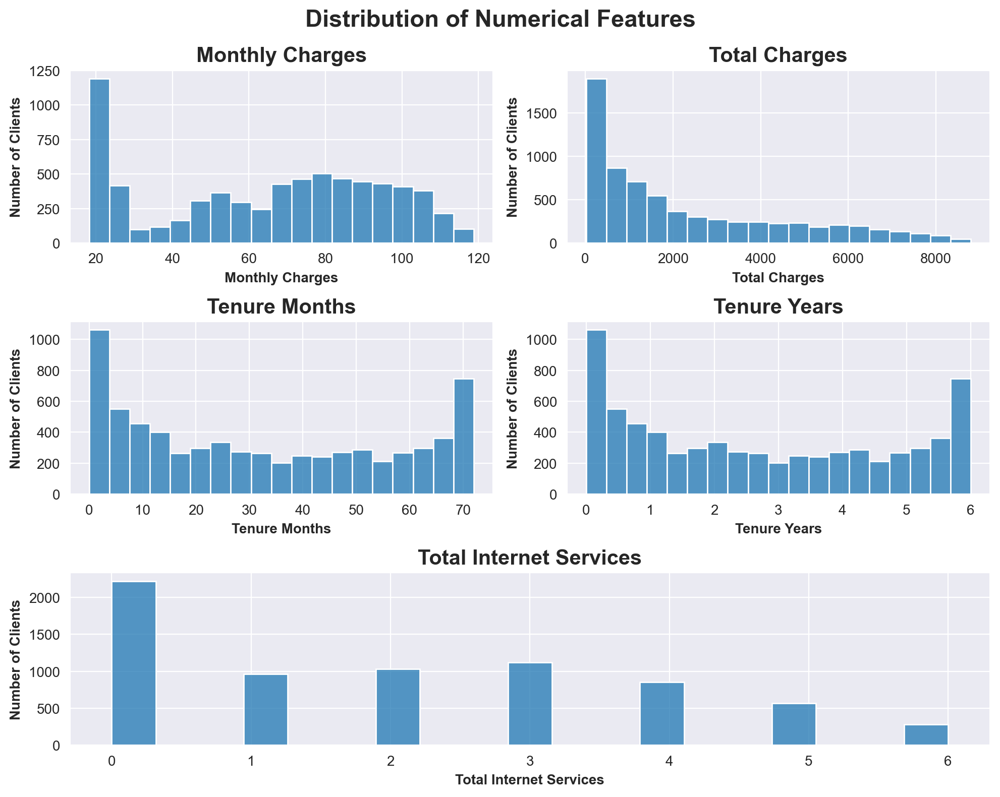

In [61]:
graph_numerical_features(data)

**_Notes:_**
- There appears to be a concentration of clients in the lower charge range, with a smoother distribution as the charges increase. This suggests that a significant portion of the client base is opting for less expensive plans - which is confirmed in our `Total Internet Services` distribution.
- The number of clients with no internet more than doubles that of clients with just a single internet package, let alone multiple. Perhaps we can work on a marketing campaign that bundles services together to also increase longevity in clients.
- The `Total Charges` distribution is heavily skewed right - implying that a majority of our clients are new - and also suggesting a possible class imbalance.
- However, reviewing the `Tenure` distributions, there is a minor class imbalance, but it may not be large enough to address through balancing methods (_although potentially utilizing weight methods could prove useful_), but the `Tenure Months` distribution peaks at both ends, giving a "U" shape distribution. This implies clients either churn early, or stay for extended periods.

Let's observe the numerical feature distributions per the target class. 

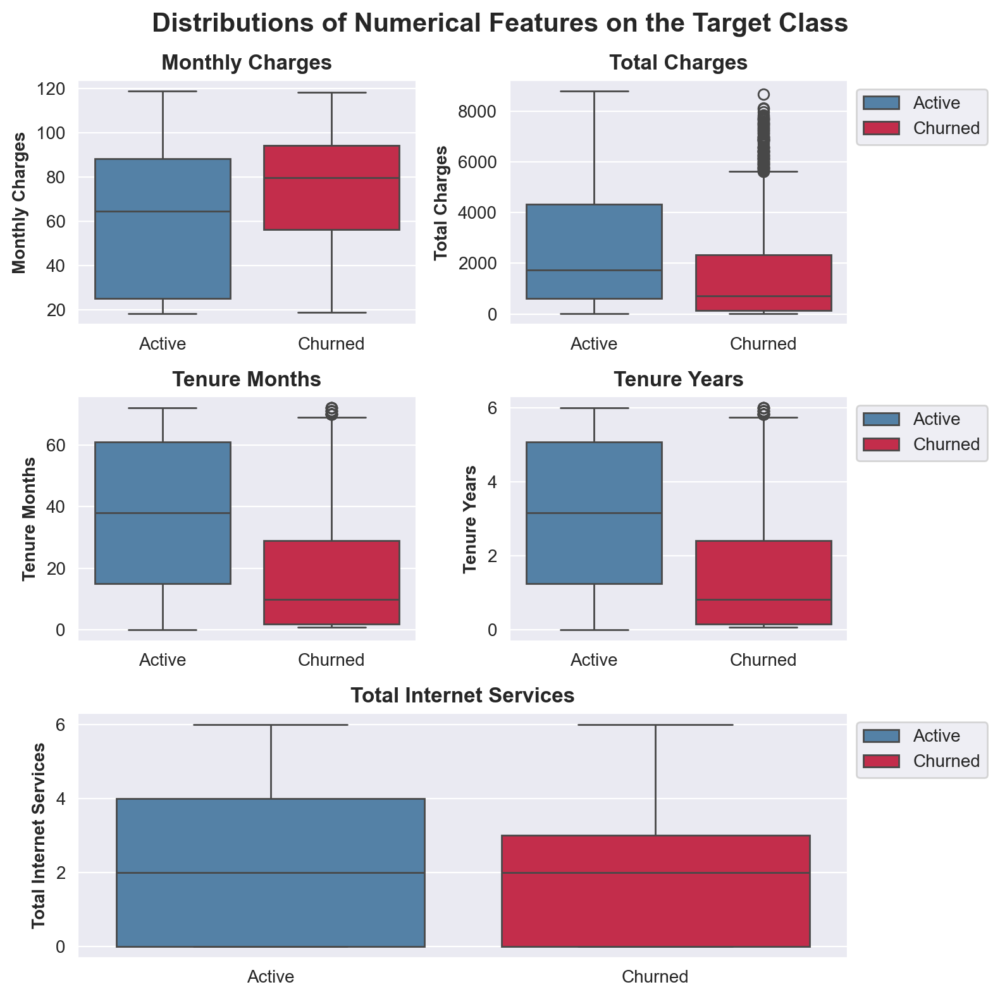

In [62]:
box_nums_on_target(data, 'churned')

**_Notes:_**

This distribution chart shares a massive amount of information!

- According to the `Monthly Charges` distribution, there is a significant increase in monthly charges (_including avg. monthly charges_) for those who have left versus those that have not. In fact, it's highly unlikely for those that have left to have a low monthly payment (indicated by the long whisker), making this a promising feature for ML models.
- This is oppositely observed in `Total Charges`, implying that those that leave, leave early; this reinforces our conclusions from the histograms. There are many outliers that have high total charges that have left - indicating this is not the best predictor due to the high variance, but is still relevant.
    - The outliers inform us that we should indeed perform some scaling as we predicted.
    - It's also possible that the outliers indicate an additional group present in the churned clients. If time allows, we may be able to investigate this. 
- The `Tenure` distributions show that tenure will likely be our strongest predictor of client churn. We can clearly see the median discrepency of Active customers having a median of 3 years, and 75% of all clients that have churned, did so within 2 years.
- The `Total Internet Services` distribution indicates that it will be a weaker predictor as both distributions have the same median. There is still relevant information for ML models to learn due to the deviations in their 75% quartile ranges.

[Back to Contents](#contents)

## 5.2 Categorical Features
<a id='cat_feats'></a>

We already have a list with our categorical features. Let's go ahead and make the graphs. 

There are 18 categorical features so the subplot will be packed with information, we will ensure to carefully analyze each chart in an organized and clear manor.

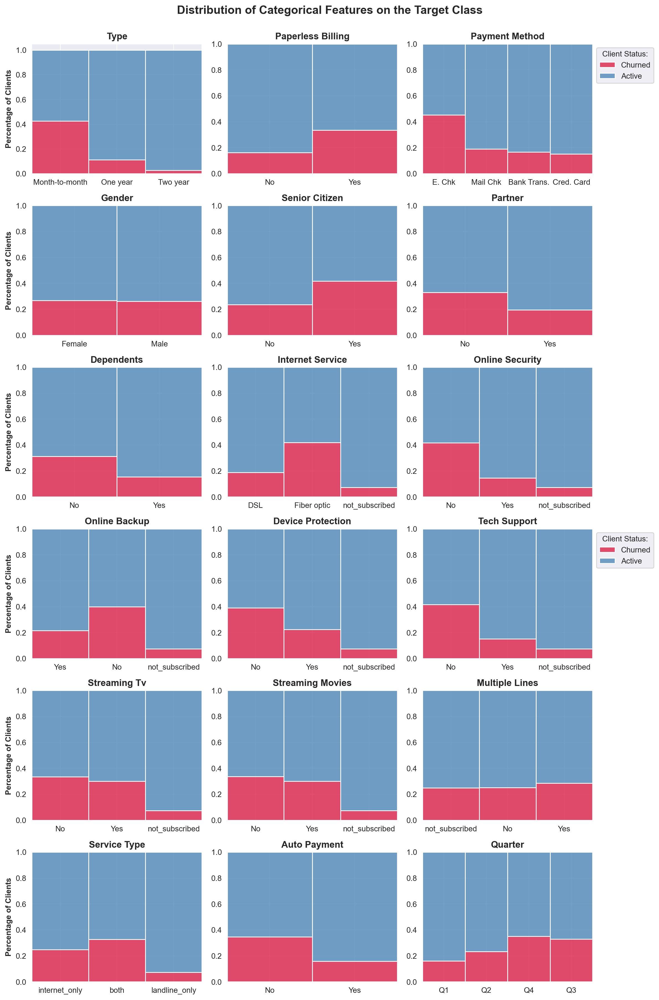

In [63]:
# Intitialize Figure - not barplot
categorical_features = {}

for feat in cat_feats:
    categorical_features[feat] = inflection.titleize(feat)
    
sns.set_style('darkgrid')

fig, axs = plt.subplots(ncols = 3, nrows = 6, figsize = (12, 18))
fig.suptitle("Distribution of Categorical Features on the Target Class",
             fontsize = 15, fontweight = 'bold', y=1.0)

axs = axs.flatten()

# plot the charts
for i, (feature, label) in enumerate(categorical_features.items()):
    sns.histplot(data = data, x = feature,
                hue = 'churned', palette = ['steelblue', 'crimson'],
                multiple = 'fill', discrete = True, ax = axs[i])
    axs[i].set_title(label, fontsize = 12, fontweight = 'bold')
    axs[i].set_xlabel("")

    # set up sepecific labeling
    if i == 2 or i == 11:
        axs[i].legend(title = 'Client Status:', loc = 'upper left', 
                      labels = ['Churned', 'Active'], bbox_to_anchor = (1,1))
    else:
        axs[i].get_legend().remove()

    if i in [0, 3, 6, 9, 12, 15]:
        axs[i].set_ylabel("Percentage of Clients", fontweight = 'bold')
    else:
        axs[i].set_ylabel("")

    if i in [1, 4, 5, 6, 16]:
        axs[i].set_xticks([0,1], ['No','Yes'])

    if i == 2:
        axs[i].set_xticks([x for x in range(0,4)], ['E. Chk', 'Mail Chk', 'Bank Trans.', 'Cred. Card'])

plt.tight_layout()
plt.show()

# vetting
#print(axs[2].get_xticklabels())

**_Immediate Notes for Marketing Team:_**

Marketing should focus on our clients that are:
- subscribed on a **Monthly** basis;
- paying via **Electronic Check**;
- not set up for **automatic payments**;
- subscribed to our **internet** with no additional packages;
- subscribed to our internet and have the **streaming tv and movies** packages as these packages have the highest churn rate.
- The marketing team should work hardest during **Quarters 3 & 4: Jul-Dec**.

As for our ML models:
- All fields will be great predictors of churn except for **Gender**, **Multiple Lines**, and possibly **Partner and Dependents** due to their uniform distributions. We will perform some additional testing to confirm `Partner` and `Dependents`, such as a Chi-squared test. 

### 5.2.1 Chi-Squared Tests
<a id='chi_test'></a>

The **Chi-squared** test will help determine if the categorical feature has a significant relationship with the target variable (*churned*). This can help determine if a feature is simply adding noise to the dataset, a feature that will not help make a prediction is a feature I don't want ML models being trained on. If the p-value is low (significantly less than 0.05) than we can conclude that the categorical feature is strongly related to *churn*, otherwise, we have great evidence of a noisy feature that can be removed. 

We will test the following features:
- Gender
- Partner
- Dependents
- Multiple Lines

In [64]:
# observe tables for test
tables_to_create = ['gender', 'partner', 'dependents', 'multiple_lines']

for col in tables_to_create:
    contingency_table(col)

Gender Contingency Table:


churned,0,1
gender,,
Female,2549,939
Male,2625,930


------------------------- 

Partner Contingency Table:


churned,0,1
partner,,
0,2441,1200
1,2733,669


------------------------- 

Dependents Contingency Table:


churned,0,1
dependents,,
0,3390,1543
1,1784,326


------------------------- 

Multiple_Lines Contingency Table:


churned,0,1
multiple_lines,,
No,2541,849
Yes,2121,850
not_subscribed,512,170


------------------------- 



In [65]:
# perform tests
for col in tables_to_create:
    chi_test(col)

Gender-Churned Chi-squared Test:
Chi-squared: 0.4840828822091383
P-value: 0.48657873605618596
Degrees of Freedom: 1
------------------------- 

We fail to reject the null hypothesis.
There is not enough evidence of association between the two variables.
The two variables are likely independent of each other.

Partner-Churned Chi-squared Test:
Chi-squared: 158.7333820309922
P-value: 2.1399113440759935e-36
Degrees of Freedom: 1
------------------------- 

We reject the null hypothesis.
There is enough evidence of association between the two variables.

Dependents-Churned Chi-squared Test:
Chi-squared: 189.12924940423474
P-value: 4.9249216612154196e-43
Degrees of Freedom: 1
------------------------- 

We reject the null hypothesis.
There is enough evidence of association between the two variables.

Multiple_Lines-Churned Chi-squared Test:
Chi-squared: 11.330441483197559
P-value: 0.0034643829548773046
Degrees of Freedom: 2
------------------------- 

We reject the null hypothesis.
There is

It appears that `gender` is the only feature independent of churn of our suspected features.  Although the `multiple_lines`' p-value was much higher than the others, we will leave that variable in, but we have reason to believe `gender` is adding noise to the dataset. `gender` is also likely not a strong predictor due to its independence from the target. 

Let's confirm if there are dependencies on other related features. 

In [66]:
# chi test partner and senior
print(chi_test('gender', 'senior_citizen'))
print(chi_test('gender', 'partner'))
print(chi_test('gender', 'dependents'))
print(chi_test('gender', 'monthly_charges'))
print(chi_test('gender', 'tenure_months'))

Gender-Senior_Citizen Chi-squared Test:
Chi-squared: 0.015604244282376655
P-value: 0.9005892996849594
Degrees of Freedom: 1
------------------------- 

We fail to reject the null hypothesis.
There is not enough evidence of association between the two variables.
The two variables are likely independent of each other.

0.015604244282376655
Gender-Partner Chi-squared Test:
Chi-squared: 0.016356470128040018
P-value: 0.8982341127357725
Degrees of Freedom: 1
------------------------- 

We fail to reject the null hypothesis.
There is not enough evidence of association between the two variables.
The two variables are likely independent of each other.

0.016356470128040018
Gender-Dependents Chi-squared Test:
Chi-squared: 0.7337079948513788
P-value: 0.39168391711610406
Degrees of Freedom: 1
------------------------- 

We fail to reject the null hypothesis.
There is not enough evidence of association between the two variables.
The two variables are likely independent of each other.

0.73370799485

It does not appear that `gender` relates to other features. **We can safely drop this feature from our dataset before ML training.** 

We will however, confirm this decision when observing the correlations later in the EDA. 

[Back to Contents](#contents)

## 5.3 Distribution of the Target Class
<a id='targ_dist'></a>

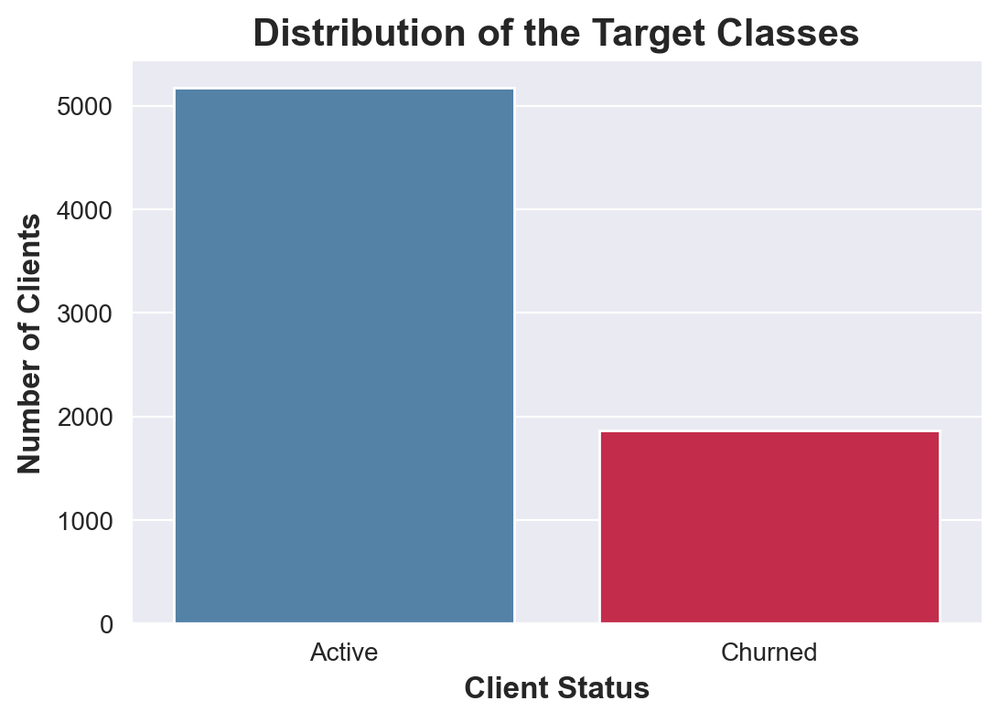

In [67]:
# initialize figure
sns.set_style('darkgrid')

plt.figure(figsize = (6,4))

sns.countplot(data = data, x = 'churned',
              hue = 'churned',
              palette = ['steelblue', 'crimson'],
              legend = False)

plt.title("Distribution of the Target Classes", 
          fontsize = 15, fontweight = 'bold')
plt.xlabel("Client Status", fontsize = 12, fontweight = 'bold')
plt.ylabel("Number of Clients", fontsize = 12, fontweight = 'bold')
plt.xticks([0, 1], ['Active', 'Churned'])

plt.show()

There is a massive imbalance in the target classes (only 26% of the dataset). This will need to be addressed via some sort of balancing method. 

Initially I am considering adjusting class weights as our parameter tuning will be quite robust and this method should work well. If not, then some combination of upsampling and downsampling via SMOTE may also work well. 

According to our [Work Plan](#the_plan), the only models we are planning on training that don't directly support class weight adjustment is `AdaBoost` and `HistGradientBoost`, but we can use sample weighting during training to achieve similar affects, so no major plan adjustments need to be made. 

[Back to Contents](#contents)

## 5.4 Monthly Payments
<a id='month_pay'></a>

We have already observed the overall distribution for this feature as well as the boxplot distributions on the target class. We determined there is in fact a difference in that clients who have churned have significantly higher monthly charges. 

Let's investigate a little further and see if we can determine groups of clients based on monthly charges that marketing could target. 

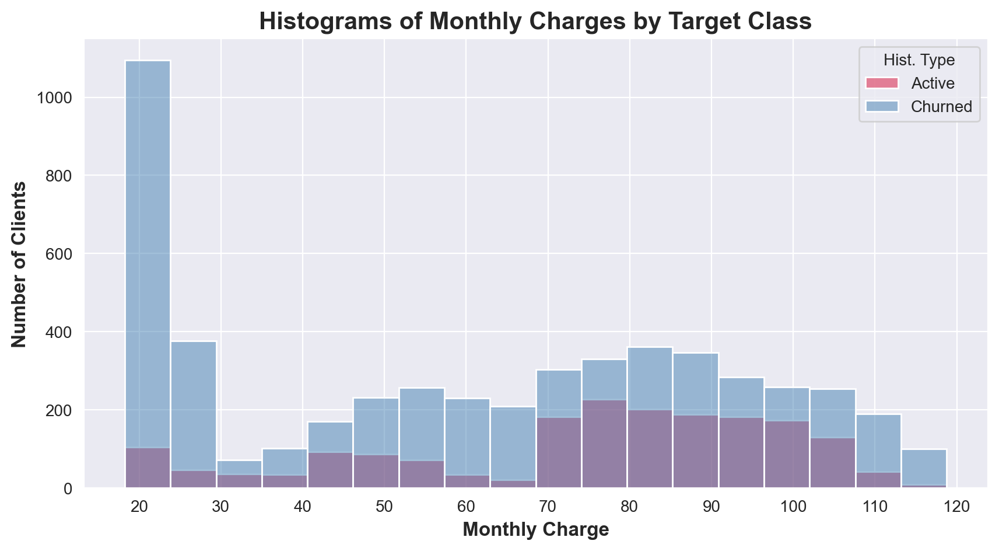

In [68]:
# combined histogram
sns.set_style('darkgrid')

plt.figure(figsize = (10, 5))

sns.histplot(data = data, x = 'monthly_charges', hue = 'churned',
             palette = ['steelblue', 'crimson'])

plt.title("Histograms of Monthly Charges by Target Class", 
          fontsize = 15, fontweight = 'bold')
plt.xlabel("Monthly Charge", fontsize = 12, fontweight = 'bold')
plt.ylabel("Number of Clients", fontsize = 12, fontweight = 'bold')
plt.xticks([x for x in range(20, 130, 10)])
plt.legend(title = "Hist. Type", labels = ['Active', 'Churned'])

plt.show()

It appears there are waves from 0-40, 40-70, 70-110, and 110+. Let's look at the percentage of Active vs. Churned clients in these ranges. 

In [69]:
# Define bins
bins = [0, 40, 70, 110, data['monthly_charges'].max()]
labels = ['0-40', '40-70', '70-110', '110+']

# use cut
mc_group = pd.cut(data['monthly_charges'], bins=bins, labels=labels).to_frame()

mc_group['churned'] = data['churned']

# get percentages
charge_cross = round(pd.crosstab(mc_group['monthly_charges'], mc_group['churned'], normalize = 'index') * 100, 2)
charge_cross.columns = ['Active', 'Churned']
charge_cross = charge_cross[['Churned', 'Active']]

charge_cross

,Churned,Active
monthly_charges,,
0-40,11.64,88.36
40-70,23.92,76.08
70-110,36.79,63.21
110+,13.02,86.98


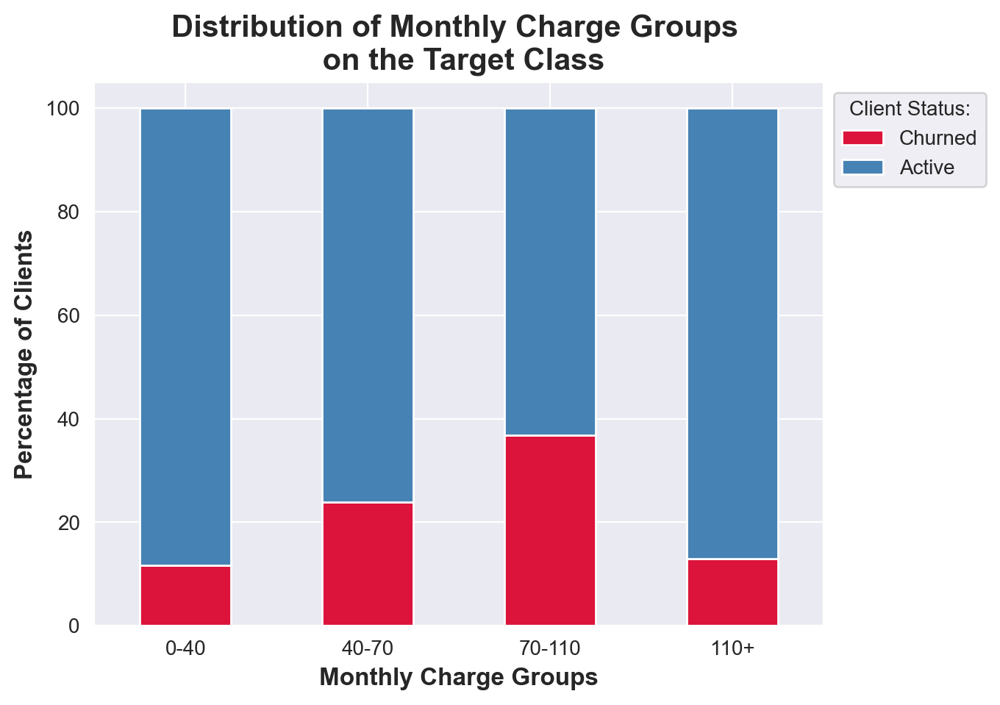

In [70]:
# graph the crosstab
charge_cross.plot(kind = 'bar', 
                  stacked = True,
                  color = ['crimson', 'steelblue'])

plt.title("Distribution of Monthly Charge Groups \n on the Target Class",
          fontsize = 15, fontweight = 'bold')
plt.xlabel("Monthly Charge Groups", fontsize = 12, fontweight = 'bold')
plt.ylabel("Percentage of Clients", fontsize = 12, fontweight = 'bold')
plt.xticks(rotation = 0)
plt.legend(title = "Client Status:", loc = 'upper left', 
           labels = ['Churned', 'Active'], bbox_to_anchor = (1,1))

plt.show()

It appears there is in fact groups of clients marketing can target. They should focus their campaigns on clients with monthly charges in the 40-110 range, but more specifically the 70-110 range. This data seems valueable to ML models, let's add it to the data set. 

Also, we get to intentionally add ordinal relationships as there are clear predictive relationships among the groups, this will significantly help reduce the amount of features if left simply as a categorical feature via OHE.

In [71]:
def calc_charge_group(row):
    '''
    Function to calculate which monthly charge group the client is in.
    '''

    if row['monthly_charges'] >= 0 and row['monthly_charges'] < 40:
        return 'Group_1'
    elif row['monthly_charges'] >= 40 and row['monthly_charges'] < 70:
        return 'Group_2'
    elif row['monthly_charges'] >= 70 and row['monthly_charges'] < 110:
        return 'Group_3'
    else:
        return 'Group 4'

In [72]:
data['charge_group'] = data.apply(calc_charge_group, axis = 1)

cat_feats.append('charge_group')

# observe
data[['monthly_charges', 'charge_group']].sample(5, random_state = 15)

,monthly_charges,charge_group
5545,86.55,Group_3
1657,25.60,Group_1
2218,82.00,Group_3
4392,19.20,Group_1
1461,95.90,Group_3


Excellent, let's proceed to the percentages of each service type. 

[Back to Contents](#contents)

## 5.5 Percentages of Clients by Service Type
<a id='serv_type'></a>

We want to observe the percentage of clients within the following columns: `service_type`, `multiple_lines`, `internet_service`, and `tot_internet_services`

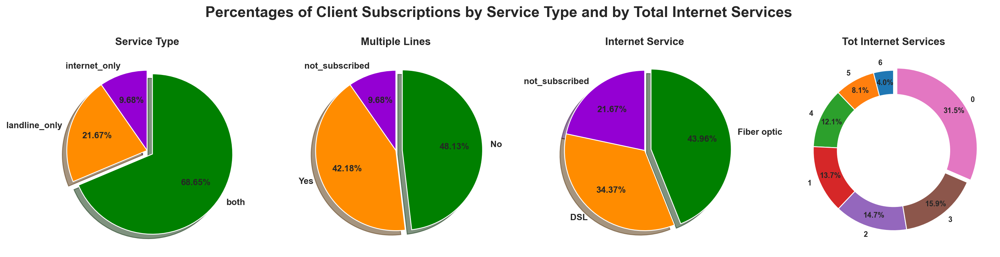

In [73]:
pies_to_make = ['service_type', 'multiple_lines', 'internet_service', 'tot_internet_services']

fig, axs = plt.subplots(ncols = 4, nrows = 1, figsize = (16, 6))
fig.suptitle("Percentages of Client Subscriptions by Service Type and by Total Internet Services",
             fontsize = 17, fontweight = 'bold', y=0.85)

for i, col in enumerate(pies_to_make):
    percs = round(data[col].value_counts(normalize = True) * 100, 2).sort_values()
    ax = axs[i]

    if i < 3:
        ax.pie(
            x = percs,
            labels = percs.index,
            autopct = '%1.2f%%',
            colors = ['darkviolet', 'darkorange', 'green'],
            startangle = 90,
            shadow = True,
            explode = (0,0,0.08),
            pctdistance = 0.65,
            textprops = {'fontweight':'bold'})

        plt.title(' '.join(col.title().split('_')))
    else:
        ax.pie(
            x = percs,
            labels = percs.index,
            autopct = '%1.1f%%',
            startangle = 90,
            shadow = False,
            explode = (0, 0, 0, 0, 0, 0, 0.05),
            pctdistance = 0.85,
            textprops = {'fontsize': 8.5, 'fontweight':'bold'}
            #wedgeprops = {'edgecolor': 'black'}
        )
        plt.gca().add_artist(plt.Circle((0, 0), 0.7, color='white')) # donut chart

    ax.set_title(' '.join(col.title().split('_')), fontsize = 12, fontweight = 'bold')
        
plt.tight_layout()
plt.show()

**_Notes:_**
- Most clients are subscribed to both internet and landline services. However, the clients subscribed to internet services are considerably higher risk so we learn that only 21.67% of the clients are relatively safe. Our phone satisfaction must be high!
- Considering the stability of the landline service clients, the marketing team should focus on the 9.68% of clients not subscribed, as this would improve retention.
- Of the clients subscribed to our internet packages, `Fiber Optic` is the most popular, likely because it is the better connection, however churn is high among our internet clients so maybe something is wrong with our connection speeds and timings.
- Of the offered internet services, not including those unsubscribed, having 3 additional packages is the most popular, followed closely by 2. It will be interesting to see this feature on the target class. *See distribution below!*

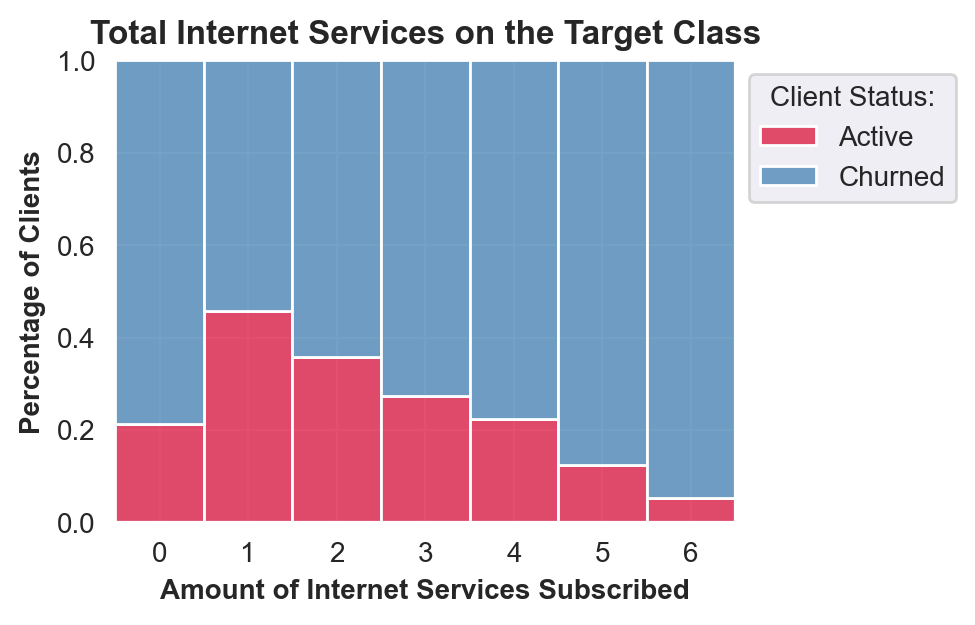

In [74]:
sns.set_style('darkgrid')

plt.figure(figsize = (4,3))
sns.histplot(data = data, x = 'tot_internet_services', hue = 'churned',
             palette = ['steelblue', 'crimson'], multiple = 'fill',
             discrete = True)

plt.title("Total Internet Services on the Target Class", 
          fontsize = 12, fontweight = 'bold')
plt.xlabel("Amount of Internet Services Subscribed", fontweight = 'bold')
plt.ylabel("Percentage of Clients", fontweight = 'bold')
plt.legend(title = "Client Status:", labels = ['Active', 'Churned'], bbox_to_anchor = (1,1))

plt.show()

- As we can see churn rate increases with internet services closer to 1, with 1 being the highest. Informing us that although internet subscribers pose the greatest risk, they are less likely to leave if subscribed to additional internet services, but it has to be more than 4 to be less likely than not subscribing at all.
- This data is even more interesting because we know from our pie charts that the most popular amount of services is 3, so this indicates that we should reflect on our competitiveness when it comes to our packages, or other internal factors. The goal internally should be to decrease the percentage of customers that leave for having 3 packages through some kind of incentivization to not only increase profits, but increase retention as well. 

[Back to Contents](#contents)

## 5.6 Customer Inflow and Outflow
<a id='in+out'></a>

We've already done a quarter analysis and learned that clients tend to leave in months Jul-Dec, but more so in Oct-Dec. However, let's look at each dates individually and see if we see an even finer pattern. 

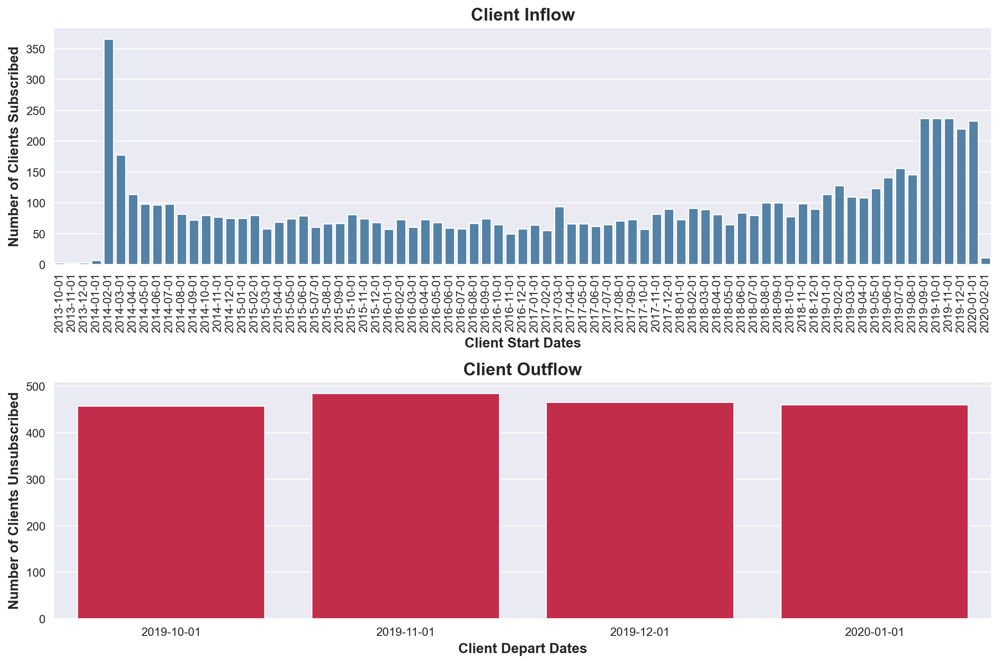

In [75]:
start_counts = data['begin_date'].value_counts().sort_index()

fig, axs = plt.subplots(ncols = 1, nrows = 2, 
                        figsize = (12, 8))

ax = axs[0]

# chart
sns.barplot(x = start_counts.index, y = start_counts.values, 
            color = 'steelblue', ax = ax)
ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation = 90)
ax.set_title("Client Inflow", fontsize = 15, fontweight = 'bold')
ax.set_xlabel("Client Start Dates", fontsize = 12, fontweight = 'bold')
ax.set_ylabel("Number of Clients Subscribed", fontsize = 12, fontweight = 'bold')

ax = axs[1]
end_counts = data['end_date'].value_counts().sort_index()

sns.barplot(x = end_counts.index, y = end_counts.values,
            color = 'crimson', ax = ax)
ax.set_title("Client Outflow", fontsize = 15, fontweight = 'bold')
ax.set_xlabel("Client Depart Dates", fontsize = 12, fontweight = 'bold')
ax.set_ylabel("Number of Clients Unsubscribed", fontsize = 12, fontweight = 'bold')

plt.tight_layout()
plt.show()

**_Notes:_**

- I'm glad I didn't make a quarter-left feature (that would cause data leakage anyway) because the only departure data we have is for the past 4 months. We can only hypothesize on why this is, but likely didn't start tracking it until October of 2019. Unable to discern any patterns from the departure data.
- There does not appear to be any patterns in the start dates as well. There is a larger influx of clients in the later months of 2019 and that is possibly why there are more departures. People may be changing their mind or the market is shaking up. Hard to say without external information. No real pattern to discern.
- One observation we can make is that the amount of clients leaving are doubling that of clients entering. We need better marketing/prices/incentives!

[Back to Contents](#contents)

## 5.7 Correlation Matrix
<a id='corr'></a>

### Numerical Features

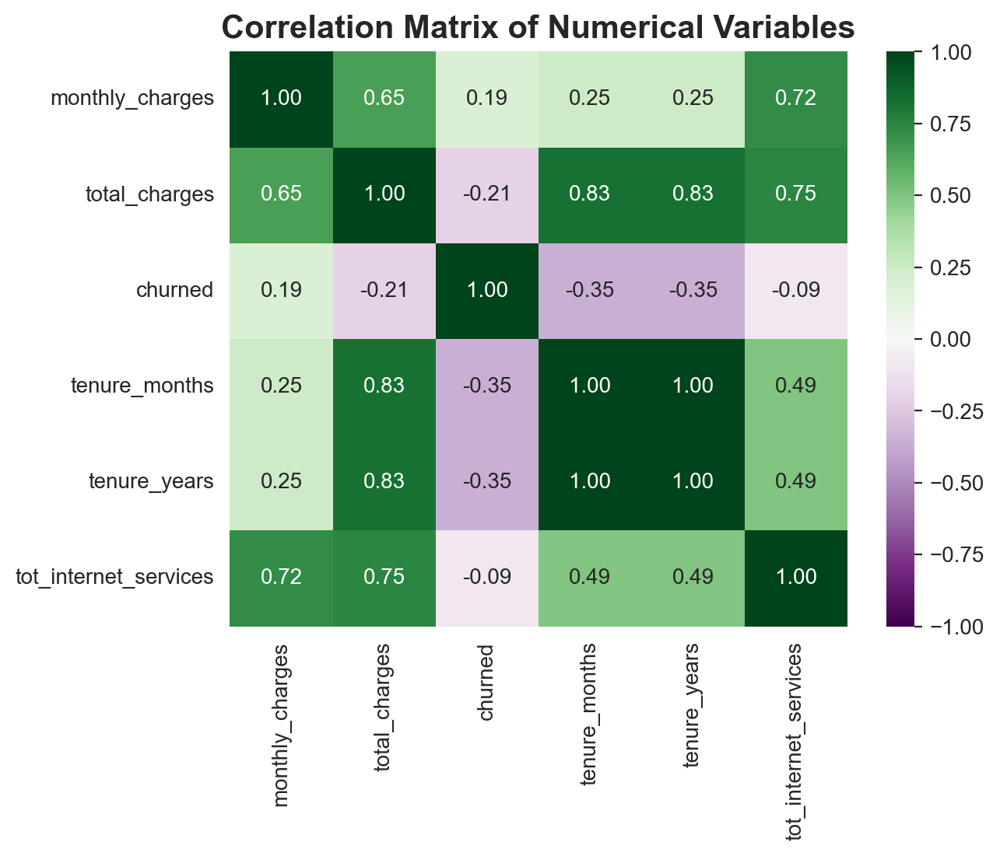

In [76]:
sns.heatmap(
    data = data.drop(columns = cat_feats + ['customer_id', 'begin_date', 'end_date']).corr(),
    vmin = -1, vmax = 1,
    cmap = 'PRGn', center = 0,
    annot = True, fmt = '.2f',
    linecolor = 'black'
)
plt.title("Correlation Matrix of Numerical Variables", fontsize = 15, fontweight = 'bold')
plt.show()

**_Notes:_**

- We can see that most correlations are positive, with the negative correlations actually only relating to the target. 
- As predicted, tenure is our strongest predictor, followed by our engineered `charge_group` (now a categorical variable but as a numerical it scored 0.21) and then `monthly_charges`. 
- The weakest correlation being with `tot_internet_services`, but we will not remove it as it correlates very well to other features.
    - We also cannot remove `monthly_charges` for the same reason. 

### Categorical Features

Unfortunately, we cannot observe a correlation matrix on categorical features, but we can observe whether there is a significant association via the chi-squared test. We can then further assess the strength of that association via **Cram&eacute;r's V**, and build our own matrix with those values for all the categorical features and the target. 

Cram&eacute;r's V normalizes its result on a scale of 0-1, which will make our matrix easy to interpret: the closer to 1, the stronger the association between the categorical features.

In python, our target feature is a numeric, but for our statistical testing, we can safely treat a binary numeric feature (_e.g.,_ 0/1) as categorical for this analysis.

To obtain the Cram&eacute;r's V measurement, we will use the following formula:

---
$$ V = \sqrt{\frac{\chi^2}{n (k - 1)}} $$

---

Where:
- $V$ is the Cram&eacute;r's V measurement value
- $\chi^2$ is the chi-squared test statistic
- $n$ is the total sample size
- $k$ is the smaller of the number of rows or columns between the two variables

Generally, a $V$ value of 0.1 is weak, 0.3 is moderate, and 0.5+ is strong, but it does depend on the degrees of freedom. In most of our crosses, that will be 1, but for our interpretations we could be more conservative with 0.2 being weak, and 0.6+ being strong for non-binary features.  

The important takeaway when interpreting the matrix is that for binary feature analysis, the **degrees of freedom** ($k$) will be 1. Therefore, will use the first set of thresholds for interpretation: (_$V$ = 0.1 **as weak** and $V$ $\geq$ 0.5 **as strong**_).

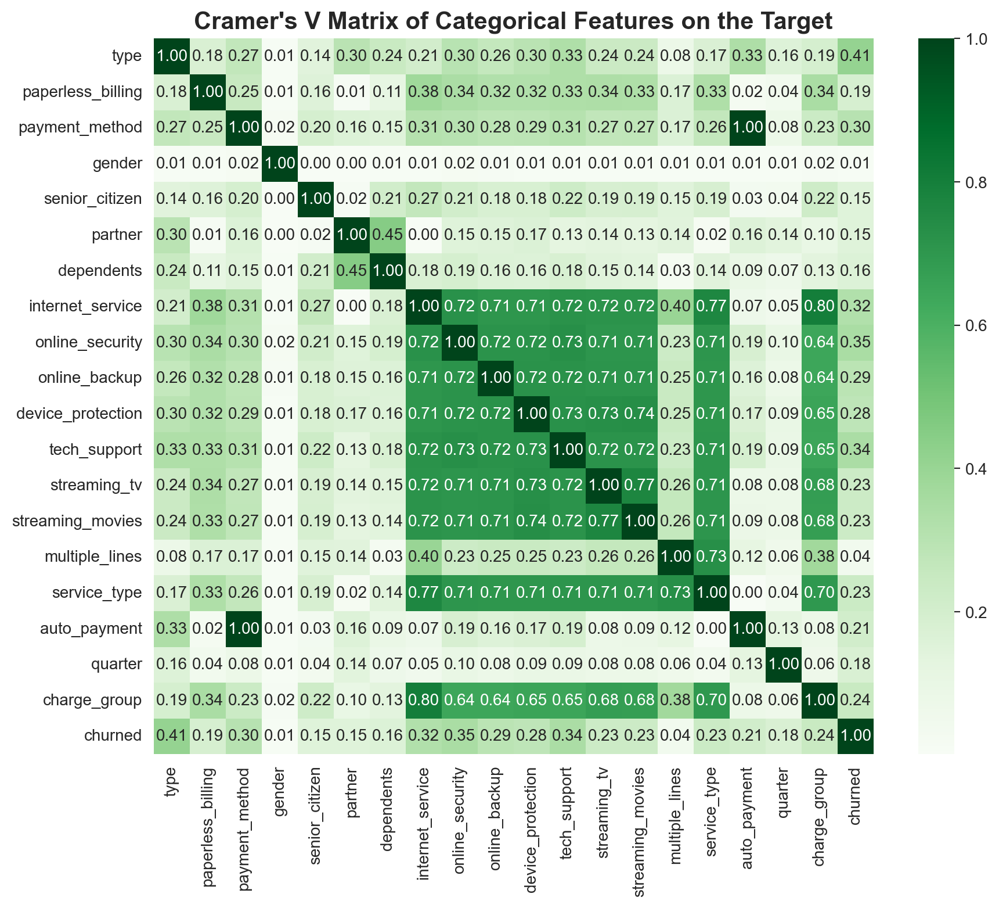

In [77]:
# Implement function to create matrix
# establish blank matrix to fill
cramer_feats = cat_feats + ['churned']
cramer_len = len(cramer_feats)

cramer_matrix = np.zeros((cramer_len, cramer_len))

# fill blank matrix
for i in range(cramer_len):
    for j in range(cramer_len):
        if i == j:
            cramer_matrix[i, j] = 1.0 # Diagonal
        else:
            cramer_matrix[i, j] = cramers_v(cramer_feats[i], cramer_feats[j])

cramer_df = pd.DataFrame(cramer_matrix, index = cramer_feats, columns = cramer_feats)

# observe / vet results
#display(cramer_df.head())
#print('\nMatrix for Churned:')
#cramer_df['churned']

# plot the heatmap
plt.figure(figsize = (10, 8))

sns.heatmap(
    data = cramer_df,
    cmap = 'Greens',
    annot = True, fmt = '.2f',
    linecolor = 'black'
)
plt.title("Cramer's V Matrix of Categorical Features on the Target",
          fontsize = 15, fontweight = 'bold')

plt.show()

**_Notes:_**

This chart perfectly summarizes our previous findings:
- Almost all categorical features have a moderate association with the target. 
- The strongest predictor will likely be the `type of service`, specifically whether the client is subscribed to our internet services.
- `Payment method` is also a strong predictor, as we see `auto_payment` is an extension of this feature and it also has a moderate association: clients not on an auto-payment are higher risk.
- Our suspicions on `gender` have been confirmed as it has a non-existent association with almost every other feature. **We can safely drop this feature**.
- `Quarter` also has a weak association with other features, not as weak as `gender`, but interestingly has a moderate association with our target, therefore we will leave this engineered feature in the dataset for training.
- `Multiple_lines` also proving to be a noisy feature on the target, but it has moderate to almost strong associations with other features, and those features have a moderate-high association with the target, so this feature needs to remain in the dataset - as we predicted.
- There is also a detected perfect association between `payment_method` and `auto_payment`, which makes sense since one is a reduction of the other. There should be no concerns of data leakage as the feature information does not directly tie to the target variable, but we will make note of this during training. In fact, `auto_payment` may actually improve performance for linear models as it reduces complexity wihtout introducing redundancy: so we will leave this feature in the dataset unless there are discovered issues during model training.
- Lastly, all of the internet service packages columns have strong associations with each other, which makes sense. These features do not add noise and will remain in the dataset.

**_Columns to Drop:_**
- Gender

As a very last look, since we know that tenure and monthly charges are two of our top predictors, and we know that gender has an almost non-existent association with all categorical variables, but what about its association with our top numerical predictors?

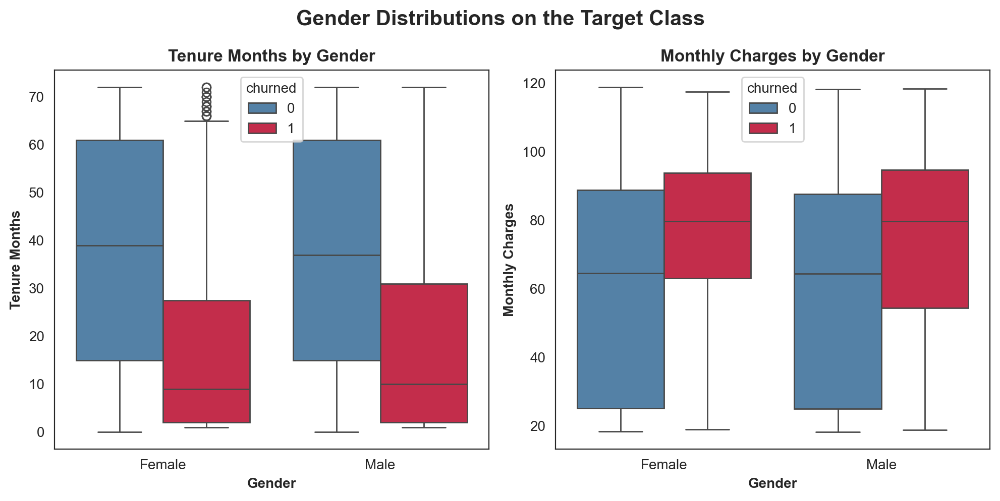

In [78]:
sns.set_style('white')

fig, axs = plt.subplots(ncols = 2, nrows = 1, figsize = (10,5))
plt.suptitle("Gender Distributions on the Target Class", fontsize = 15, fontweight = 'bold')
axs = axs.flatten()

for i, col in enumerate(['tenure_months', 'monthly_charges']):
    sns.boxplot(data = data, x = 'gender', y = col, 
                hue = 'churned', palette = ['steelblue', 'crimson'],
                ax = axs[i])
    axs[i].set_title(f"{inflection.titleize(col)} by Gender",
              fontsize = 12, fontweight = 'bold')
    axs[i].set_xlabel("Gender", fontweight = 'bold')
    axs[i].set_ylabel(f"{inflection.titleize(col)}", fontweight = 'bold')

plt.tight_layout()
plt.show()

It does appear that females have an ever so slightly shorter `tenure` among churned clients, but practically no difference in active clients. As for `monthly charges`, we can see that males do have a lower 25 percentile among churned clients, but their medians are very similar. We could do further hypothesis testing to compare the means, but I do not believe this to be necessary. We can safely **drop `Gender`.**

[Back to Contents](#contents)

## 5.8 Conclusion
<a id='eda_summ'></a>

Below is a summary of all findings during EDA.

### 1. Numerical Features
- **General Observations**
    - Most clients opt for less expensive plans.
    - Clients with no additional internet packages outnumber those with a single internet package.
    - `Tenure` follows a "U-shaped" distribution: clients churn early or commit to longer terms.
- **Target Class Analysis:**
    - Churned clients pay higher **monthly charges** but accumulate lower **total charges** (indicating early churn).
    - Median tenure for active clients is 3 years; **75%** of churned clients leave within 2 years.
    - Active and churned clients have similar distributions for the number of internet packages.
- **New Feature:**
    - Created **Charge Groups** based on `monthly_charges`: 0-40, 40-70, 70-110, and 110+ to better segment monthly charges.

### 2. Categorical Features
- **Marketing Recommendations:**
    - Focus on clients who are:
      - Subscribed **monthly**
      - Paying via **Electronic Check**
      - Not on **auto-payment**
      - Subscribed to **Streaming TV & Movies** packages
      - Highest churn occurs in Quarters 3 & 4, mostly 4

### 3. Target Class 
- Active clients outnumber churned clients by a ratio greater than 2:1
- We plan to address this imbalance through weight adjustments and then through SMOTE if needed.

### 4. Client Behavior Insights
- **Service Type:**
    - Most clients are subscribed to both internet and landline services.
    - Clients subscribed to internet services are higher churn risks, likely indicating dissatisfaction.
    - Churn liklihood decreases with **4+ additional packages**. Providing incentivization could improve retention.
- **Inflow/Outflow:**
    - Departure data is limited to the last **4 months**.
    - Subscriptions show no clear patterns, but client departures **double** subscriptions. 

### 5. Correlations
- `service_type`, `tenure`, `payment_method`, and `charge_group` are our top predictors with high correlation and association to the target.
- The engineered feature `charge_group`, outperforms the original `monthly_charges` feature.
- `gender` has no association with any categorical or relevant numerical features and can be removed.
- `multiple_lines` has a weak association with the target but remains, due to its links with other strong predictors.
- Internet service packages have strong associations with each other.
- `auto_payment` and `payment_method` have a perfect association.
    - Redundancy evaluation is tricky as they each have better associations with certain features than the other.
- `quarter` has a weak association with other features but moderate strength with the target. 

### 6. Final Feature Decisions
- `gender` will be dropped due to lack of association.
- `customer_id`, `begin_date`, `end_date` will be dropped due to irrelevance.
- `charge_group`, `auto_payment` will be dropped to reduce redundancy.
- `tenure_years` will be dropped to prevent multicollinearity.
- `quarter` will be dropped to prevent **data leakage**.

[Back to Contents](#contents)

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;"> <strong>You did a thorough analysis of both numerical and categorical features. Use of techniques like contingency tables, chi-squared tests, and Cramér's V provides deeper statistical understanding of relationships with the target variable.</strong> </div>

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;"> <strong>The use of stacked bar plots to represent proportions (e.g., charge_cross) and grouped histograms (e.g., monthly_charges by churned) is a great way to highlight differences between classes.</strong></div>

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;"> <strong>Well-designed histograms, bar plots, and pie charts definitely made data trends and distributions easier to interpret.</strong></div>

# 6. Model Development
<a id='mod_dev'></a>

---

## 6.1 Prepare Features and Target 
<a id='mod_prep'></a>

In [79]:
# features
#feats_to_drop = ['customer_id', 'end_date', 'begin_date', 'churned', 
#                 'gender', 'charge_group', 'tenure_years', 'auto_payment', 'quarter']

feats_to_drop = ['customer_id', 'end_date', 'begin_date', 'churned', 'auto_payment', 'quarter']

X = data.drop(columns = feats_to_drop)
y = data['churned']

Per advice given in the feedback of a previous project, I will avoid using **`pd.get_dummies()`** to perform OHE and will instead utilize sklearns OHE. The data should already be prepared and ready. 

In [80]:
# obtain categorical features 
cat_feats = X.select_dtypes(include = ['object']).columns.tolist()

# initialize encoder
ohe = OneHotEncoder(sparse_output = False, handle_unknown = 'ignore', drop = 'first')

# apply the encoder to cat feats
X_enc = ohe.fit_transform(X[cat_feats])

# Put X back into DF
X_enc = pd.DataFrame(X_enc, columns = ohe.get_feature_names_out(cat_feats), index = X.index)
X = pd.concat([X, X_enc], axis = 1)

# drop original cat cols
X = X.drop(columns = cat_feats)

# correct dtypes - ocd
for col in X.columns:
    if col not in ['monthly_charges', 'total_charges'] and X[col].dtype == 'float64':
        X[col] = X[col].astype('int64')

In [81]:
# observe
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 36 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   paperless_billing                       7043 non-null   int64  
 1   monthly_charges                         7043 non-null   float64
 2   total_charges                           7043 non-null   float64
 3   senior_citizen                          7043 non-null   int64  
 4   partner                                 7043 non-null   int64  
 5   dependents                              7043 non-null   int64  
 6   tenure_months                           7043 non-null   int64  
 7   tenure_years                            7043 non-null   int64  
 8   tot_internet_services                   7043 non-null   int64  
 9   type_One year                           7043 non-null   int64  
 10  type_Two year                           7043 non-null   int6

In [82]:
# fix column spacing
X.columns = X.columns.str.replace(' ', '_')
X.columns

Index(['paperless_billing', 'monthly_charges', 'total_charges',
       'senior_citizen', 'partner', 'dependents', 'tenure_months',
       'tenure_years', 'tot_internet_services', 'type_One_year',
       'type_Two_year', 'payment_method_Credit_card_(automatic)',
       'payment_method_Electronic_check', 'payment_method_Mailed_check',
       'gender_Male', 'internet_service_Fiber_optic',
       'internet_service_not_subscribed', 'online_security_Yes',
       'online_security_not_subscribed', 'online_backup_Yes',
       'online_backup_not_subscribed', 'device_protection_Yes',
       'device_protection_not_subscribed', 'tech_support_Yes',
       'tech_support_not_subscribed', 'streaming_tv_Yes',
       'streaming_tv_not_subscribed', 'streaming_movies_Yes',
       'streaming_movies_not_subscribed', 'multiple_lines_Yes',
       'multiple_lines_not_subscribed', 'service_type_internet_only',
       'service_type_landline_only', 'charge_group_Group_1',
       'charge_group_Group_2', 'charge_gro

This data set looks good. We've obtained all of our numerical data and the drop first parameter worked correctly.

The dropped columns via the encoder makes sense: losing one of the yes/no columns and keeping `not_subscribed`; keeping both non-automatic payment types; keeping the quarter choice is irrelevant so whichever quarter is dropped is fine. 

*(We will remove quarter due to data leakage later)*

### Create Train, Validation, and Test Sets

We will create a validation set, so we will perform a 75:15:15 split.

In [83]:
base_X = X.copy()

In [84]:
X_train, X_val, y_train, y_val = train_test_split(X, y, 
                                                  test_size = 0.25,
                                                  random_state = 24)

X_val, X_test, y_val, y_test = train_test_split(X_val, y_val, 
                                                test_size = 0.5,
                                                #stratify = y_val,
                                                random_state = 24)

# confirm shapes
split_sets = {
    'X_train': X_train,
    'y_train': y_train,
    'X_val': X_val,
    'y_val': y_val,
    'X_test': X_test,
    'y_test': y_test
}

for name, split_set in split_sets.items():
    print(f"Shape of {name}: {split_set.shape}")

Shape of X_train: (5282, 36)
Shape of y_train: (5282,)
Shape of X_val: (880, 36)
Shape of y_val: (880,)
Shape of X_test: (881, 36)
Shape of y_test: (881,)


In [85]:
# check class imbalance
print("Training:")
print(y_train.value_counts(normalize = True))
print('-'*25, '\n')

print("Test:")
print(y_test.value_counts(normalize = True))
print('-'*25, '\n')

Training:
churned
0    0.729648
1    0.270352
Name: proportion, dtype: float64
------------------------- 

Test:
churned
0    0.745743
1    0.254257
Name: proportion, dtype: float64
------------------------- 



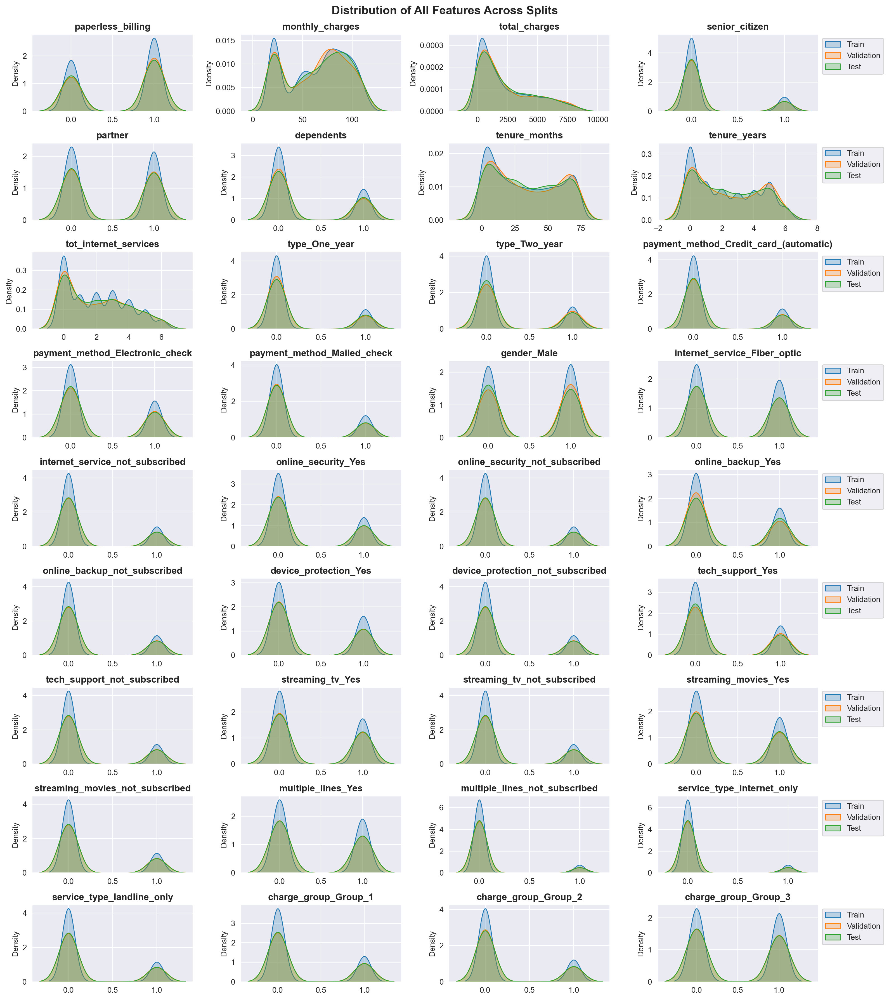

In [86]:
# check distributions for each feature, ensure no anomalies
sns.set_style('darkgrid')

fig, axs = plt.subplots(nrows = 9, ncols = 4, figsize = (16, 18))
plt.suptitle("Distribution of All Features Across Splits", fontsize = 15, fontweight = 'bold', y = 0.99)
axs = axs.flatten()

for i, feature in enumerate(X_train.columns):
    #plt.figure(figsize=(6, 4))
    sns.kdeplot(X_train[feature], label="Train", shade=True, ax=axs[i])
    sns.kdeplot(X_val[feature], label="Validation", shade=True, ax=axs[i])
    sns.kdeplot(X_test[feature], label="Test", shade=True, ax=axs[i])
    axs[i].set_title(f"{feature}", fontweight = 'bold')
    axs[i].set_xlabel("")

    if i in [x for x in range(3, 36, 4)]:
        axs[i].legend(loc = 'upper left', bbox_to_anchor = (1,1), frameon = True)

plt.tight_layout()
plt.show()

### Scale the Numerical Features


In [87]:
#num_feats.pop(3) #remove years

In [88]:
sc = StandardScaler()

X_train[num_feats] = sc.fit_transform(X_train[num_feats])
X_val[num_feats] = sc.transform(X_val[num_feats])
X_test[num_feats] = sc.transform(X_test[num_feats])

In [89]:
display(X_train.head(3))
display(X_val.head(3))
display(X_test.head(3))

,paperless_billing,monthly_charges,total_charges,senior_citizen,partner,dependents,tenure_months,tenure_years,tot_internet_services,type_One_year,type_Two_year,payment_method_Credit_card_(automatic),payment_method_Electronic_check,payment_method_Mailed_check,gender_Male,internet_service_Fiber_optic,internet_service_not_subscribed,online_security_Yes,online_security_not_subscribed,online_backup_Yes,online_backup_not_subscribed,device_protection_Yes,device_protection_not_subscribed,tech_support_Yes,tech_support_not_subscribed,streaming_tv_Yes,streaming_tv_not_subscribed,streaming_movies_Yes,streaming_movies_not_subscribed,multiple_lines_Yes,multiple_lines_not_subscribed,service_type_internet_only,service_type_landline_only,charge_group_Group_1,charge_group_Group_2,charge_group_Group_3
2683,1,0.491726,-0.746859,0,0,0,-1.021824,-1.121762,-0.566920,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
6712,0,0.685062,0.026804,0,1,1,-0.165308,-0.128859,-0.020284,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1
3569,0,-1.498307,-0.866646,0,0,0,-0.613959,-0.625310,-1.113556,1,0,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,1,1,0,0


,paperless_billing,monthly_charges,total_charges,senior_citizen,partner,dependents,tenure_months,tenure_years,tot_internet_services,type_One_year,type_Two_year,payment_method_Credit_card_(automatic),payment_method_Electronic_check,payment_method_Mailed_check,gender_Male,internet_service_Fiber_optic,internet_service_not_subscribed,online_security_Yes,online_security_not_subscribed,online_backup_Yes,online_backup_not_subscribed,device_protection_Yes,device_protection_not_subscribed,tech_support_Yes,tech_support_not_subscribed,streaming_tv_Yes,streaming_tv_not_subscribed,streaming_movies_Yes,streaming_movies_not_subscribed,multiple_lines_Yes,multiple_lines_not_subscribed,service_type_internet_only,service_type_landline_only,charge_group_Group_1,charge_group_Group_2,charge_group_Group_3
779,0,-0.651626,-0.971969,0,0,0,-1.225756,-1.121762,-1.113556,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1877,0,0.788397,1.807563,0,0,0,1.629297,1.856945,2.166260,0,1,1,0,0,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,0,0,1
4337,1,1.158403,2.069682,1,0,0,1.588510,1.360494,0.526352,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1


,paperless_billing,monthly_charges,total_charges,senior_citizen,partner,dependents,tenure_months,tenure_years,tot_internet_services,type_One_year,type_Two_year,payment_method_Credit_card_(automatic),payment_method_Electronic_check,payment_method_Mailed_check,gender_Male,internet_service_Fiber_optic,internet_service_not_subscribed,online_security_Yes,online_security_not_subscribed,online_backup_Yes,online_backup_not_subscribed,device_protection_Yes,device_protection_not_subscribed,tech_support_Yes,tech_support_not_subscribed,streaming_tv_Yes,streaming_tv_not_subscribed,streaming_movies_Yes,streaming_movies_not_subscribed,multiple_lines_Yes,multiple_lines_not_subscribed,service_type_internet_only,service_type_landline_only,charge_group_Group_1,charge_group_Group_2,charge_group_Group_3
1841,0,-1.353304,-0.449174,0,1,0,0.976713,0.864043,-1.113556,1,0,0,1,0,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,1,0,0,1,1,0,0
2064,0,-1.511640,-0.736657,0,1,1,-0.083735,-0.128859,-1.113556,1,0,0,0,0,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,1,1,0,0
548,1,1.233405,1.334142,1,1,0,0.731994,0.864043,1.072988,1,0,0,0,0,1,1,0,1,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1


## 6.2 Addressing Class Imbalance
<a id='imbalance'></a>

In [90]:
# list to store everything
experiment_results = []

mcc_score = metrics.make_scorer(metrics.matthews_corrcoef, greater_is_better = True)

def add_cv_row(model, model_name,
               X_train, y_train,
               resampling = None,  #-------smote, smoteenn, smotetomek
               cv = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 42),
               cv_metrics = ['accuracy', 'roc_auc', 'f1'],
               default_df = True):
    '''
    This function evaluates a model via cross-validation with the optional
    functionality to include resampling techniques.
    '''

    # create pipeline for resampling
    if resampling:
        pipeline = Pipeline([
            ('resampling', resampling),
            ('model', model)
        ])
    else:
        pipeline = Pipeline([
            ('model', model)
        ])

    # perform cross-validation
    scoring = {metric: metric for metric in cv_metrics}
    scoring['mcc'] = mcc_score
    
    cv_results = cross_validate(pipeline, X_train, y_train, cv=cv,
                                scoring = scoring, 
                                n_jobs = -1,
                                return_train_score = True)

    # obtain validation set metrics
    '''if resampling:
        X_train, y_train = resampling.fit_resample(X_train, y_train)
        model.fit(X_train, y_train)
    else:    
        model.fit(X_train, y_train)
    
    preds = model.predict(X_val)
    pred_probs = model.predict_proba(X_val)[:, 1]

    f1_val = metrics.f1_score(y_val, preds)
    roc_val = metrics.roc_auc_score(y_val, pred_probs)
    acc_val = metrics.accuracy_score(y_val, preds)
    m_coe = metrics.matthews_corrcoef(y_val, preds)'''

    # store results for easy DF
    results_dict = {
        'Model': model_name,
        'Accuracy Train': cv_results['train_accuracy'].mean(),
        'ROC-AUC Train': cv_results['train_roc_auc'].mean(),
        'F1-Score Train': cv_results['train_f1'].mean(),
        'MCC Train': cv_results['train_mcc'].mean(),
        'Accuracy Val': cv_results['test_accuracy'].mean(),
        'ROC-AUC Val': cv_results['test_roc_auc'].mean(),
        'F1-Score Val': cv_results['test_f1'].mean(),
        'MCC Val': cv_results['test_mcc'].mean()
    }

    if default_df:
        experiment_results.append(results_dict)
    else:
        smote_results.append(results_dict)

---
### Class Weights Vs SMOTE Vs Upsampling
We need to address the class imbalance. We decided adjusting weights or using SMOTE would be our two options. We will perform a small and simple experiment to see which offers better metrics. We will use a baseline model, a tree model, and a boosting model. We could also choose not to address the imbalance as our feature engineering may be strong enough for this task, so we will include that testing as well. 

---

### 6.2.1 Base Model 

In [91]:
# base
base = DummyClassifier(strategy = 'constant', constant = 0)

add_cv_row(base, 'base', X_train, y_train)

experiment_results

[{'Model': 'base',
  'Accuracy Train': 0.7296478659859927,
  'ROC-AUC Train': 0.5,
  'F1-Score Train': 0.0,
  'MCC Train': 0.0,
  'Accuracy Val': 0.7296479458731114,
  'ROC-AUC Val': 0.5,
  'F1-Score Val': 0.0,
  'MCC Val': 0.0}]

### 6.2.2 Random Upsampling

In [92]:
# separate classes
X_major = X_train[y_train == 0]
y_major = y_train[y_train == 0]

X_minor = X_train[y_train == 1]
y_minor = y_train[y_train == 1]

# get size
upsize = len(y_major)

# upsample
X_minor_up = X_minor.sample(upsize, replace = True, random_state = 42)
y_minor_up = y_minor.sample(upsize, replace = True, random_state = 42)

# combine
X_train_up = pd.concat([X_major, X_minor_up])
y_train_up = pd.concat([y_major, y_minor_up])

X_train_up, y_train_up = shuffle(X_train_up, y_train_up, random_state = 42)

In [93]:
print("Before Upsampling:", y_train.value_counts())
print("After Upsampling:", y_train_up.value_counts())

Before Upsampling: churned
0    3854
1    1428
Name: count, dtype: int64
After Upsampling: churned
1    3854
0    3854
Name: count, dtype: int64


### 6.2.3 SMOTE Setup & Tuning

We will first find the best parameters for the SMOTE resampler. We will test sampling strategies from 0.4 to 1.0 at 0.05 intervals. We will also not assume the default k-neighbors parameter will suffice and will test these from 1,10 (same amount of deviation on both ends from 5) using cross validation. 

The gradient boosting models will severely overfit during this, so I will set the max_depth to 3 to combat this. No further tuning will take place. 

In [94]:
smote_results = []

In [95]:
# find best smote parameters 
for strategy in np.arange(0.4, 1.0, 0.05): #12 strategies tested
    for k in range(1, 11):
        smote = SMOTE(sampling_strategy = strategy,
                      k_neighbors = k,
                      random_state = 42)
        
        # must reset model each loop --> must be defined here
        log_smote = LogisticRegression(random_state = 42)
        add_cv_row(log_smote, f'LOG SMOTE - {strategy:.2f} - k:{k}', X_train, y_train, default_df = False, resampling = smote)
        
        xgb_smote = XGBClassifier(random_state = 42, verbose = 0, max_depth = 3)
        add_cv_row(xgb_smote, f'XGB SMOTE - {strategy:.2f} - k:{k}', X_train, y_train, default_df = False, resampling = smote)
        
        light_smote = LGBMClassifier(random_state = 42, verbose = -1, max_depth = 3)
        add_cv_row(light_smote, f'LIGHT SMOTE - {strategy:.2f} - k:{k}', X_train, y_train, default_df = False, resampling = smote)

    print(f"Completed cross-validations for all models at a {strategy:.2f} sampling strategy.")

Completed cross-validations for all models at a 0.40 sampling strategy.
Completed cross-validations for all models at a 0.45 sampling strategy.
Completed cross-validations for all models at a 0.50 sampling strategy.
Completed cross-validations for all models at a 0.55 sampling strategy.
Completed cross-validations for all models at a 0.60 sampling strategy.
Completed cross-validations for all models at a 0.65 sampling strategy.
Completed cross-validations for all models at a 0.70 sampling strategy.
Completed cross-validations for all models at a 0.75 sampling strategy.
Completed cross-validations for all models at a 0.80 sampling strategy.
Completed cross-validations for all models at a 0.85 sampling strategy.
Completed cross-validations for all models at a 0.90 sampling strategy.
Completed cross-validations for all models at a 0.95 sampling strategy.


In [96]:
# observe
smote_tuning = pd.DataFrame(smote_results).sort_values(by = ['ROC-AUC Val'], ascending = False)

# breakdown by model for easier viewing
display(smote_tuning[smote_tuning['Model'].str.contains('XGB')].head(10))
display(smote_tuning[smote_tuning['Model'].str.contains('LOG')].head(10))
display(smote_tuning[smote_tuning['Model'].str.contains('LIGHT')].head(10))

,Model,Accuracy Train,ROC-AUC Train,F1-Score Train,MCC Train,Accuracy Val,ROC-AUC Val,F1-Score Val,MCC Val
10,XGB SMOTE - 0.40 - k:4,0.884656,0.940789,0.763764,0.695734,0.846272,0.894936,0.689099,0.592749
25,XGB SMOTE - 0.40 - k:9,0.883615,0.940617,0.761092,0.692705,0.845703,0.894489,0.684954,0.589931
28,XGB SMOTE - 0.40 - k:10,0.883851,0.940636,0.760390,0.693121,0.846650,0.894349,0.687355,0.592858
4,XGB SMOTE - 0.40 - k:2,0.885507,0.940057,0.765253,0.697930,0.844757,0.894264,0.681535,0.586680
13,XGB SMOTE - 0.40 - k:5,0.884371,0.940427,0.762166,0.694665,0.845892,0.894110,0.682870,0.589661
1,XGB SMOTE - 0.40 - k:1,0.885081,0.940065,0.763423,0.696590,0.843432,0.893876,0.678432,0.582970
19,XGB SMOTE - 0.40 - k:7,0.884608,0.939963,0.762691,0.695397,0.845702,0.893844,0.681891,0.588664
88,XGB SMOTE - 0.50 - k:10,0.880396,0.936122,0.764455,0.687381,0.841162,0.893485,0.690316,0.585579
22,XGB SMOTE - 0.40 - k:8,0.884040,0.939567,0.761298,0.693728,0.842676,0.893454,0.676049,0.580539
61,XGB SMOTE - 0.50 - k:1,0.879165,0.935883,0.763644,0.684964,0.837751,0.893443,0.684674,0.577213


,Model,Accuracy Train,ROC-AUC Train,F1-Score Train,MCC Train,Accuracy Val,ROC-AUC Val,F1-Score Val,MCC Val
6,LOG SMOTE - 0.40 - k:3,0.803010,0.845801,0.609272,0.480779,0.799320,0.842326,0.603616,0.472133
24,LOG SMOTE - 0.40 - k:9,0.802963,0.845715,0.609881,0.481106,0.801592,0.842250,0.606602,0.477166
3,LOG SMOTE - 0.40 - k:2,0.803626,0.845809,0.610892,0.482670,0.799509,0.842233,0.603875,0.472579
15,LOG SMOTE - 0.40 - k:6,0.803436,0.845705,0.610526,0.482189,0.800455,0.842181,0.605574,0.474970
18,LOG SMOTE - 0.40 - k:7,0.803342,0.845762,0.609525,0.481399,0.799699,0.842080,0.603161,0.472345
12,LOG SMOTE - 0.40 - k:5,0.804193,0.845794,0.611517,0.483852,0.799319,0.842069,0.603918,0.472388
21,LOG SMOTE - 0.40 - k:8,0.803531,0.845716,0.610789,0.482475,0.799699,0.842016,0.603475,0.472563
9,LOG SMOTE - 0.40 - k:4,0.802963,0.845616,0.609953,0.481155,0.800267,0.842002,0.605378,0.474522
0,LOG SMOTE - 0.40 - k:1,0.803483,0.845847,0.610954,0.482523,0.799508,0.841988,0.602962,0.471992
27,LOG SMOTE - 0.40 - k:10,0.803436,0.845663,0.610530,0.482176,0.801402,0.841888,0.607293,0.477355


,Model,Accuracy Train,ROC-AUC Train,F1-Score Train,MCC Train,Accuracy Val,ROC-AUC Val,F1-Score Val,MCC Val
2,LIGHT SMOTE - 0.40 - k:1,0.853843,0.907400,0.698227,0.610757,0.833777,0.884515,0.655016,0.554955
92,LIGHT SMOTE - 0.55 - k:1,0.845229,0.905267,0.710248,0.604854,0.827338,0.883321,0.679114,0.561279
29,LIGHT SMOTE - 0.40 - k:10,0.853275,0.907247,0.696531,0.609035,0.834344,0.883234,0.658160,0.557567
5,LIGHT SMOTE - 0.40 - k:2,0.854601,0.907575,0.699233,0.612654,0.833399,0.883042,0.656758,0.554996
20,LIGHT SMOTE - 0.40 - k:7,0.854884,0.907379,0.700284,0.613598,0.835857,0.882939,0.662205,0.562058
95,LIGHT SMOTE - 0.55 - k:2,0.845513,0.905540,0.710817,0.605546,0.827717,0.882887,0.679710,0.562198
14,LIGHT SMOTE - 0.40 - k:5,0.854459,0.907713,0.697430,0.611707,0.838321,0.882833,0.664789,0.567736
23,LIGHT SMOTE - 0.40 - k:8,0.854790,0.907838,0.700547,0.613511,0.835482,0.882809,0.660527,0.560408
32,LIGHT SMOTE - 0.45 - k:1,0.855074,0.907312,0.712042,0.619019,0.832828,0.882802,0.669856,0.561193
77,LIGHT SMOTE - 0.50 - k:6,0.849016,0.905620,0.709952,0.608962,0.830367,0.882760,0.675505,0.561863


Log generalizes well at most smote thresholds; we will choose a **sampling strategy of 0.4** and **k_neighbors = 9** as the gradient boosting models appear to still suffer overfitting on the synthetic data, but may still converge well. It is currently difficult to tell if smote would be the best technique.  

To finalize our decision, we will investigate all techniques across a few models. 

In [97]:
from imblearn.combine import SMOTEENN

# Initialize smote
smote = SMOTE(sampling_strategy = 0.4,
              k_neighbors = 9,
              random_state = 42)

smote_enn = SMOTEENN(smote = smote, random_state = 42)

smote_tom = SMOTETomek(random_state = 42, smote = smote)


# apply smote to training data
X_train_s, y_train_s = smote.fit_resample(X_train, y_train)
X_train_senn, y_train_senn = smote_enn.fit_resample(X_train, y_train)
X_train_st, y_train_st = smote_tom.fit_resample(X_train, y_train)

# check distribution
print("Before SMOTE:", y_train.value_counts())
print()
print("After SMOTE:", y_train_s.value_counts())
print('-'*25,'\n')
print("After SMOTEENN:", y_train_senn.value_counts())
print('-'*25,'\n')
print("After SMOTETomek:", y_train_st.value_counts())

Before SMOTE: churned
0    3854
1    1428
Name: count, dtype: int64

After SMOTE: churned
0    3854
1    1541
Name: count, dtype: int64
------------------------- 

After SMOTEENN: churned
0    2318
1     392
Name: count, dtype: int64
------------------------- 

After SMOTETomek: churned
0    3528
1    1215
Name: count, dtype: int64


## 6.3 Model Performance Analysis Across Imbalance Correction Methods
<a id='imbal_fix'></a>

In [98]:
def xgb_weights(y):
    '''
    Calculates number of positives and negatives for the 
    scale_pos_weight parameter in XGBoost. 
    '''

    num_neg = y[y == 0].count()
    num_pos = y[y == 1].sum()

    return num_neg / num_pos

In [99]:
def perform_imbalance_study(model_configs, model_name, smote_keys):
    for config_type, model in model_configs.items():
        for dataset_name, smote_key in smote_keys.items():
            if config_type == 'Non-Weighted' and dataset_name == 'Non-Weighted': #------- Base model with no weighting or resampling
                add_cv_row(model, f"{model_name}: {dataset_name}", X_train, y_train, resampling=None)
            
            elif config_type == 'Weighted' and dataset_name == 'Weighted':   #------ Weighted model with no resampling
                add_cv_row(model, f"{model_name}: {dataset_name}", X_train, y_train, resampling=None)

            elif config_type == 'Non-Weighted' and dataset_name in ['SMOTE', 'SMOTEENN', 'SMOTETomek', 'Up']: # Non-weighted models; resampling techniques
                add_cv_row(model, f"{model_name}: {dataset_name}", X_train, y_train, resampling=smote_key)

            elif config_type == 'Weighted' and dataset_name in ['SMOTE', 'SMOTEENN', 'SMOTETomek', 'Up']:  # Weighted models; resampling techniques
                add_cv_row(model, f"{model_name}: Weighted-{dataset_name}", X_train, y_train, resampling=smote_key)

In [100]:
smote_keys = {
    'Non-Weighted': None,
    'Weighted': None,
    'Up': None,
    'SMOTE': smote,
    'SMOTEENN': smote_enn,
    'SMOTETomek': smote_tom
}

#dataset_names = ['Non-Weighted', 'Weighted', 'Up', 'SMOTE', 'SMOTEENN', 'SMOTETomek']

In [101]:
tree_configs = {
    'Non-Weighted': DecisionTreeClassifier(random_state = 42, max_depth = 8),
    'Weighted': DecisionTreeClassifier(random_state = 42, max_depth = 8, class_weight = 'balanced')
}

perform_imbalance_study(tree_configs, 'Tree', smote_keys)

In [102]:
perform_imbalance_study(
    {'Non-Weighted': LogisticRegression(random_state = 42),
     'Weighted': LogisticRegression(random_state = 42, class_weight = 'balanced')}, 
    'LOG', 
    smote_keys = smote_keys
)

In [103]:
perform_imbalance_study(
    {'Non-Weighted': CatBoostClassifier(random_state = 42, verbose = 0),
     'Weighted': CatBoostClassifier(random_state = 42, class_weights = [1, 2], verbose = 0)}, 
    'CAT', 
    smote_keys = smote_keys
)

In [104]:
perform_imbalance_study(
    {'Non-Weighted': LGBMClassifier(random_state = 42, verbose = 0),
     'Weighted': LGBMClassifier(random_state = 42, class_weight = 'balanced', verbose = 0)}, 
    'LGBM', 
    smote_keys = smote_keys
)

In [105]:
# create and format df
experiment = pd.DataFrame(experiment_results)
experiment.loc[:, ['Accuracy Train', 'ROC-AUC Train', 'F1-Score Train',
                   'Accuracy Val', 'ROC-AUC Val', 'F1-Score Val']] = experiment.loc[:, ['Accuracy Train', 'ROC-AUC Train', 'F1-Score Train',
                                                                                        'Accuracy Val', 'ROC-AUC Val', 'F1-Score Val']].round(4)

experiment['Harmonic Mean Train'] = 2 * (experiment['ROC-AUC Train'] * experiment['F1-Score Train']) / (experiment['ROC-AUC Train'] + experiment['F1-Score Train'])
experiment['Harmonic Mean Val'] = 2 * (experiment['ROC-AUC Val'] * experiment['F1-Score Val']) / (experiment['ROC-AUC Val'] + experiment['F1-Score Val'])

experiment = experiment.sort_values(by = ['ROC-AUC Val'], ascending = False).reset_index(drop = True)
experiment

# Remove overfitting techniques
#experiment.query("(`ROC-AUC Train` - `ROC-AUC Val`) <= 0.12")
#experiment[experiment['Model'].str.contains("Weighted-Up") | experiment['Model'].str.contains("Weighted-SMOTE")]

,Model,Accuracy Train,ROC-AUC Train,F1-Score Train,MCC Train,Accuracy Val,ROC-AUC Val,F1-Score Val,MCC Val,Harmonic Mean Train,Harmonic Mean Val
0,LGBM: SMOTE,0.9349,0.9841,0.8712,0.831652,0.8459,0.8935,0.6904,0.592976,0.924215,0.778928
1,CAT: SMOTE,0.9164,0.9663,0.8301,0.782000,0.8417,0.8916,0.6763,0.578791,0.893037,0.769168
2,LGBM: Weighted-Up,0.9184,0.9839,0.8646,0.815955,0.8173,0.8915,0.6949,0.571814,0.920400,0.781018
3,LGBM: Weighted,0.9184,0.9839,0.8646,0.815955,0.8173,0.8915,0.6949,0.571814,0.920400,0.781018
4,LGBM: Up,0.9360,0.9850,0.8718,0.834585,0.8396,0.8913,0.6722,0.573396,0.924949,0.766398
5,LGBM: Non-Weighted,0.9360,0.9850,0.8718,0.834585,0.8396,0.8913,0.6722,0.573396,0.924949,0.766398
6,LGBM: Weighted-SMOTE,0.9187,0.9833,0.8638,0.813904,0.8215,0.8911,0.7016,0.581501,0.919684,0.785077
7,CAT: Up,0.9159,0.9675,0.8270,0.780964,0.8432,0.8911,0.6746,0.580918,0.891750,0.767882
8,CAT: Non-Weighted,0.9159,0.9675,0.8270,0.780964,0.8432,0.8911,0.6746,0.580918,0.891750,0.767882
9,CAT: Weighted-SMOTE,0.9081,0.9703,0.8402,0.778771,0.8264,0.8898,0.6999,0.581149,0.900576,0.783508


*Please note the above table may differ slightly with multiple runs*

Performing a frequency analysis, we can observe the following:
- Top 3 `LOG` methods: Base, up , weighted-upsampling
- Top 3 `CAT` methods: weights-only, upsampling, Base
- Top 3 `Tree` methods: weighted-smote, weighted-upsampling, weights-only
- Top 3 `LGBM` methods: weighted-smote, weights-only, weighted-upsampling

Weighted-smote is a solid choice, and we already have our smote sampler tuned, but weighted-upsampling also shows in each models top methods, except for cat which would benefit more on the base set as its top methods are all base-oriented.  

Both have downsides as upsampling duplicates minority samples increasing the risk of overfitting to minority class patterns and can also lead to worse generalization on unseen data. SMOTE generates synthetic data which can lead to noise and create unrealistic samples near decision boundaries. 

The benefits of using upsampling maintains the real data characteristics, reducing noise. 

The benefits of weighted-smote are better generalization and avoiding over-reliance on duplicates. 

However, due to higher MCC in methods not involving synthetic data points I will choose upsampling. 

Moving forward, **we will use the method of combining class weights and upsampling**.

## Tuning Upsampling Strategy

We saw using smote the optimal upsampling was 0.4, and in the table above upsampling was done to match the majority class. Let's find the optimal upsampling strategy using our previous methods. 

In [106]:
# clear the list
experiment_results = []

for strategy in np.arange(0.4, 1.01, 0.05):
    over_samps = RandomOverSampler(sampling_strategy = strategy, random_state = 42)

    xgb_up = XGBClassifier(verbose = 0, random_state = 42, max_depth = 3)
    add_cv_row(xgb_up, f"XGB - {strategy:.2f}", X_train, y_train, resampling = over_samps)

    cat_up = CatBoostClassifier(verbose = 0, random_state = 42, max_depth = 3)
    add_cv_row(cat_up, f"Cat - {strategy:.2f}", X_train, y_train, resampling = over_samps)

    light_up = LGBMClassifier(max_depth = 3, verbose = -1, random_state = 42)
    add_cv_row(light_up, f"Light - {strategy:.2f}", X_train, y_train, resampling = over_samps)
    
    print(f"Completed cross-validations for all models at a {strategy:.2f} samplling strategy.")

Completed cross-validations for all models at a 0.40 samplling strategy.
Completed cross-validations for all models at a 0.45 samplling strategy.
Completed cross-validations for all models at a 0.50 samplling strategy.
Completed cross-validations for all models at a 0.55 samplling strategy.
Completed cross-validations for all models at a 0.60 samplling strategy.
Completed cross-validations for all models at a 0.65 samplling strategy.
Completed cross-validations for all models at a 0.70 samplling strategy.
Completed cross-validations for all models at a 0.75 samplling strategy.
Completed cross-validations for all models at a 0.80 samplling strategy.
Completed cross-validations for all models at a 0.85 samplling strategy.
Completed cross-validations for all models at a 0.90 samplling strategy.
Completed cross-validations for all models at a 0.95 samplling strategy.
Completed cross-validations for all models at a 1.00 samplling strategy.


In [107]:
# create and format df
experiment = pd.DataFrame(experiment_results)
experiment.loc[:, ['Accuracy Train', 'ROC-AUC Train', 'F1-Score Train',
                   'Accuracy Val', 'ROC-AUC Val', 'F1-Score Val']] = experiment.loc[:, ['Accuracy Train', 'ROC-AUC Train', 'F1-Score Train',
                                                                                        'Accuracy Val', 'ROC-AUC Val', 'F1-Score Val']].round(4)

experiment['Harmonic Mean Train'] = 2 * (experiment['ROC-AUC Train'] * experiment['F1-Score Train']) / (experiment['ROC-AUC Train'] + experiment['F1-Score Train'])
experiment['Harmonic Mean Val'] = 2 * (experiment['ROC-AUC Val'] * experiment['F1-Score Val']) / (experiment['ROC-AUC Val'] + experiment['F1-Score Val'])

experiment = experiment.sort_values(by = ['MCC Val'], ascending = False).reset_index(drop = True)

# breakdown by model for easier viewing
display(experiment[experiment['Model'].str.contains('Cat')].head(10))
print()
display(experiment[experiment['Model'].str.contains('XGB')].head(10))
print()
display(experiment[experiment['Model'].str.contains('Light')].head(10))

,Model,Accuracy Train,ROC-AUC Train,F1-Score Train,MCC Train,Accuracy Val,ROC-AUC Val,F1-Score Val,MCC Val,Harmonic Mean Train,Harmonic Mean Val
2,Cat - 0.40,0.8650,0.9130,0.7192,0.640713,0.8461,0.8897,0.6777,0.587804,0.804595,0.769363
3,Cat - 0.60,0.8578,0.9161,0.7370,0.639627,0.8364,0.8890,0.6989,0.586874,0.816848,0.782571
4,Cat - 0.45,0.8643,0.9140,0.7260,0.641624,0.8436,0.8894,0.6847,0.586260,0.809224,0.773740
5,Cat - 0.50,0.8626,0.9150,0.7320,0.641766,0.8410,0.8892,0.6917,0.586215,0.813333,0.778113
14,Cat - 0.65,0.8541,0.9163,0.7368,0.636413,0.8300,0.8891,0.6944,0.577405,0.816805,0.779780
15,Cat - 0.55,0.8606,0.9150,0.7362,0.641946,0.8342,0.8890,0.6890,0.576235,0.815919,0.776326
17,Cat - 0.80,0.8445,0.9184,0.7373,0.632923,0.8188,0.8886,0.6956,0.573236,0.817946,0.780344
18,Cat - 0.75,0.8496,0.9179,0.7406,0.638257,0.8218,0.8891,0.6939,0.572183,0.819773,0.779465
19,Cat - 0.90,0.8372,0.9194,0.7347,0.628988,0.8120,0.8884,0.6954,0.571785,0.816738,0.780141
21,Cat - 0.70,0.8508,0.9169,0.7375,0.635139,0.8232,0.8880,0.6894,0.567855,0.817473,0.776198


,Model,Accuracy Train,ROC-AUC Train,F1-Score Train,MCC Train,Accuracy Val,ROC-AUC Val,F1-Score Val,MCC Val,Harmonic Mean Train,Harmonic Mean Val
0,XGB - 0.65,0.8746,0.9402,0.7733,0.687216,0.8362,0.8932,0.7067,0.594099,0.848622,0.789080
1,XGB - 0.50,0.8836,0.9408,0.7750,0.698071,0.8413,0.8928,0.6931,0.588005,0.849889,0.780377
6,XGB - 0.85,0.8671,0.9430,0.7755,0.687440,0.8237,0.8932,0.7032,0.584379,0.851087,0.786893
7,XGB - 0.45,0.8851,0.9405,0.7709,0.698629,0.8417,0.8926,0.6867,0.584126,0.847296,0.776228
8,XGB - 0.80,0.8678,0.9420,0.7743,0.685706,0.8234,0.8905,0.7018,0.582221,0.849957,0.784969
9,XGB - 0.55,0.8803,0.9405,0.7742,0.693105,0.8364,0.8908,0.6921,0.581083,0.849286,0.778979
10,XGB - 0.40,0.8866,0.9418,0.7675,0.700896,0.8425,0.8940,0.6774,0.580784,0.845763,0.770772
11,XGB - 0.70,0.8746,0.9420,0.7775,0.691564,0.8285,0.8921,0.6983,0.580484,0.851881,0.783392
12,XGB - 0.75,0.8734,0.9429,0.7799,0.693969,0.8258,0.8917,0.6987,0.579632,0.853689,0.783489
13,XGB - 0.60,0.8816,0.9420,0.7816,0.700482,0.8328,0.8926,0.6924,0.578009,0.854337,0.779856


,Model,Accuracy Train,ROC-AUC Train,F1-Score Train,MCC Train,Accuracy Val,ROC-AUC Val,F1-Score Val,MCC Val,Harmonic Mean Train,Harmonic Mean Val
24,Light - 0.50,0.8505,0.9076,0.7124,0.612567,0.8304,0.8812,0.6757,0.561791,0.798240,0.764888
25,Light - 0.45,0.8534,0.9076,0.7069,0.613636,0.8330,0.8815,0.6679,0.560135,0.794775,0.759977
26,Light - 0.65,0.8395,0.9078,0.7169,0.606675,0.8194,0.8808,0.6840,0.559940,0.801135,0.770025
28,Light - 0.55,0.8476,0.9082,0.7158,0.611810,0.8247,0.8802,0.6781,0.558037,0.800603,0.766045
29,Light - 0.60,0.8445,0.9083,0.7181,0.611167,0.8211,0.8808,0.6784,0.555156,0.802078,0.766463
30,Light - 0.70,0.8356,0.9081,0.7177,0.605857,0.8135,0.8812,0.6820,0.554814,0.801751,0.768908
32,Light - 0.40,0.8538,0.9080,0.6965,0.610131,0.8332,0.8816,0.6553,0.554067,0.788310,0.751789
33,Light - 0.75,0.8322,0.9088,0.7180,0.605172,0.8058,0.8811,0.6771,0.546249,0.802211,0.765746
34,Light - 0.80,0.8273,0.9088,0.7164,0.602434,0.8006,0.8806,0.6757,0.543334,0.801211,0.764662
35,Light - 0.85,0.8219,0.9084,0.7134,0.597958,0.7963,0.8814,0.6743,0.540623,0.799177,0.764065


**Notes**
1. ROC-AUC Stability
    - All models are equally effective at ranking predictions regardless of the sampling ratio.
2. MCC Variance
    - MCC captures the balance of true/false positive and negatives more comprehensively. Differences in MCC reflect how well the model handles the imbalanced class missclassifications.
  
Therefore, instead of aiming for the highest ROC-AUC producing ratio, we will observe the MCC. 

Setting all models to a max_depth of 3 to better measure the effectiveness of the models, we see that CatBoost's MCC stabilizes, as well as Light's, but XGB varies slightly. 0.65 seems to be a good ratio to provide balance and reduce the noise from duplicate samples. 

**We will upsample with a sampling strategy of 0.65.** 

In [108]:
# save upsampler
final_sampler = RandomOverSampler(sampling_strategy = 0.65, random_state = 42)

# perform upsample
X_train_up, y_train_up = final_sampler.fit_resample(X_train, y_train)

X_train_up, y_train_up = shuffle(X_train_up, y_train_up, random_state = 42)

[Back to Contents](#contents)

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;"> <strong>The model development pipeline demonstrates an excellent understanding of data preparation, feature encoding, splitting, and evaluation.</strong></div>

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;"> <strong>The use of multiple models (Logistic Regression, XGBoost, LGBM, CatBoost) and resampling techniques (SMOTE, SMOTEENN, SMOTETomek, and RandomOverSampler) showcases a great approach to addressing class imbalance.
</strong></div>

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;"> <strong>The integration of various sampling strategies (e.g., SMOTE, oversampling) and weighted models effectively handles class imbalance in the dataset.
</strong></div>

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;"> <strong>Efficiently did the Model Evaluation. Perfectly used cross-validation with metrics like ROC-AUC, F1-score, accuracy, and MCC to provide a holistic assessment of model performance.
</strong></div>

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;"> <strong>Use of OneHotEncoder with handle_unknown='ignore' and drop='first' ensures categorical variables are properly encoded.
</strong></div>


<div style="border: 2px solid darkblue; padding: 10px; background-color: #d4e4f7; color: black; border-radius: 5px;"> <strong>Suggestion: Instead of dropping features in multiple steps (feats_to_drop), consolidate into a single clear pipeline step.
</strong></div>

<div style="border: 2px solid darkblue; padding: 10px; background-color: #d4e4f7; color: black; border-radius: 5px;"> <strong>Suggestion: For tree-based models (e.g., XGBoost, LGBM), calculate and visualize feature importance to identify the most impactful predictors of churn.
</strong></div>

# 7. Model Training
<a id='training'></a>

---

The functions below will aid in automating the tasks in this section. 

In [109]:
def train_base_model(model, X_train = X_train_up, y_train = y_train_up):
    train_start = time.time()
    model.fit(X_train, y_train)
    train_end = time.time()

    train_time = round((train_end - train_start) * 1000, 2)

    return model, train_time

In [110]:
def optimize_model(model, model_name, param_grid, 
                   X_train, y_train,
                   resampling = final_sampler,
                   cv = StratifiedKFold(n_splits = 3, shuffle = True), 
                   store = True, iterations = 30, random_points = 10, xi = 0.1):
    '''
    Function to optimize the model hyperparameters using Bayesian Optimization.
    Prevents data leakage by incorporating resampling inside the cross-validation pipeline.

    Parameters:
    -----------
    model : Estimator
        The machine learning model to optimize.
    model_name : str
        Name of the model for identification.
    param_grid : dict
        Hyperparameter search space.
    X_train : DataFrame or array-like
        Training feature set.
    y_train : Series or array-like
        Training labels.
    resampling : Optional, default=None
        Resampling method like SMOTE, SMOTEENN, etc.
    cv : cross-validation strategy, default=StratifiedKFold
        Cross-validation splitting strategy.
    store : bool, default=True
        If True, stores the best model.
    iterations : int, default=30
        Number of iterations for Bayesian optimization.
    random_points : int, default=10
        Number of initial random points for optimization.
    xi : float, default=0.05
        Exploration vs. exploitation parameter for Bayesian optimization.

    Returns:
    --------
    Best model and training time in milliseconds.
    '''

    print(f"Optimizing {model_name}:\n")\

    pipeline = Pipeline([
        ('resampling', resampling),
        ('model', model)
    ])

    tuner = BayesSearchCV(
        estimator = pipeline,
        search_spaces = {'model__' + k: v for k, v in param_grid.items()},
        n_iter = iterations,
        scoring = 'roc_auc', #mcc_score,
        optimizer_kwargs = {
            'n_initial_points': random_points,
            'acq_func': 'EI',
            'initial_point_generator': 'lhs',
            'acq_func_kwargs': {'xi': xi},
        },
        n_jobs = -1,
        cv = cv,
        error_score = 'raise',
        random_state = 45678
    )

    tuner.fit(X_train, y_train)

    # Plot optimization progress
    plt.plot(range(1, len(tuner.cv_results_['mean_test_score']) + 1), tuner.cv_results_['mean_test_score'])
    plt.xlabel("Iteration")
    plt.ylabel("Mean Test Score")
    plt.title(f"Bayesian Optimization Progress - {model_name}")
    plt.ylim([0.5, 1.02])
    plt.show()

    # Extract best model
    best_mod = tuner.best_estimator_

    # Extract training time
    train_time = round(tuner.cv_results_['mean_fit_time'][tuner.best_index_] * 1000, 2)

    print("Optimization Complete. You may review the model. \n")
    display(tuner)

    if store:
        best_models[model_name] = best_mod
        print("Model has been stored.")

    return best_mod, train_time

In [111]:
def optunamize_model(model, objective, 
                     X_train, y_train, 
                     X_val, y_val, 
                     n_trials, model_name):
    '''
    Function to evaluate the performance of a binary classification model.

    Parameters
    ----------
    model : class
        The scikit-learn model class (e.g., LogisticRegression, DecisionTree, etc.) to optimize.

    objective : function
        The objective function to minimize or maximize during optimization.
        Must accept a `trial` object as an argument and return a numerical score for optimization.

    X_train : array-like of shape (n_samples, n_features)
        Training data for the model.

    y_train : array-like of shape (n_samples,)
        Target labels corresponding to the training data.

    X_val : array-like of shape (n_samples, n_features)
        Validation data for evaluating the model.

    y_val : array-like of shape (n_samples,)
        Target labels corresponding to the validation data.

    n_trials : int
        The number of optimization iterations (trials) to perform.

    model_name : str
        Name of the model, used for identification.
    '''

    # create optimization study
    study = optuna.create_study(sampler = optuna.samplers.TPESampler(seed=42),
                                direction = 'maximize',
                                study_name = f"{model_name}_study")

    # optimize model
    print(f"Optimizeing {model_name}\n")
    
    study.optimize(objective, n_trials = n_trials)

    # print best params
    print("Best Parameters:")
    display(study.best_params)
    print()

    # re-create
    best_model = model(**study.best_params)

    # record training time
    train_start = time.time()
    best_model.fit(X_train_up, y_train_up)
    train_end = time.time()

    train_time = round(1000 * (train_end - train_start), 2)

    return best_model, train_time


In [112]:
def evaluate_model(model, model_name,
                   X_train, y_train, 
                   X_test, y_test,
                   train_time, 
                   nn = False):
    '''
    Function to evaluate the performance of a binary classification model. 

    Evaluates the model on both the training and val/test sets. 
    Displays the scores including F1-Score, MCC, Accuracy, and ROC-AUC. 
    Plots the F1 curve, MCC curve, ROC-AUC curve, and a confusion matrix. 

    Parameters:
    -----------
    model (object)     - The trained/tuned binary classification model.
    X_train (df)       - DataFrame with features of the training set
    y_trian (Series)   - Labels of the training set
    X_test (df)        - DataFrame with features of the validation/test set
    y_test (Series)    - Labels of the test set
    train_time (float) - The time the model took to train (comes from the optimization function)

    Output:
    -------
    dict: A dictionary containing various statistics of the evaluation results
            for training and testing
        - F1-Score
        - ROC-AUC Score 
        - Matthews Correlation Coefficient
        - Training and Prediction Times
    '''
    # create dict to store eval stats
    eval_stats = {}

    sns.set_style('darkgrid')
    fig, axs = plt.subplots(ncols = 4, nrows = 1, figsize = (12,3))

    for eval_set, X, y in (('train', X_train, y_train), ('test', X_test, y_test)):
        # create dict to store stats for each set
        eval_stats[eval_set] = {}

        # get predict probs and time
        pred_probs = model.predict_proba(X)[:, 1]
        pred_start = time.time() 
        preds = model.predict(X)
        pred_end = time.time()

        # save prediction time
        if eval_set == 'test':
            pred_time = round((pred_end - pred_start) * 1000 ,2) # in ms

        # F1 & MCC data
        thresholds = np.arange(0, 1.01, 0.01)
        f1_scores = [metrics.f1_score(y, (pred_probs >= threshold).astype(int)) for threshold in thresholds]
        mcc_scores = [metrics.matthews_corrcoef(y, (pred_probs >= threshold).astype(int)) for threshold in thresholds]

        # ROC data
        fpr, tpr, roc_thresholds = metrics.roc_curve(y, pred_probs)
        roc_auc = metrics.roc_auc_score(y, pred_probs)
        eval_stats[eval_set]['ROC AUC'] = float(roc_auc)

        color = 'steelblue' if eval_set == 'train' else 'crimson'

        # ----- BEGIN F1 PLOT ----- #
        ax = axs[0]

        # plt F1 scores and mark maximum
        max_f1_idx = np.argmax(f1_scores)
        ax.plot(
            thresholds,
            f1_scores,
            color = color,
            label = f"{eval_set.title()}, max = {f1_scores[max_f1_idx]:.4f} @ {thresholds[max_f1_idx]:.4f}"
        )

        # mark specific thresholds
        for threshold in [0.2, 0.4, 0.5, 0.6, 0.8]:
            idx = np.argmin(np.abs(thresholds - threshold))
            marker_color = 'black'
            ax.plot(
                thresholds[idx],
                f1_scores[idx],
                color = marker_color,
                marker = 'X',
                markersize = 5
            )
            # plot max
            ax.plot(
                thresholds[max_f1_idx],
                f1_scores[max_f1_idx],
                color = 'limegreen',
                marker = 'X',
                markersize = 5
            )

        # customize labels
        ax.set_xlim([-0.02, 1.02])
        ax.set_ylim([-0.02, 1.02])
        ax.set_xticks([x for x in np.arange(0, 1.2, 0.2)])
        ax.set_yticks([x for x in np.arange(0, 1.2, 0.2)])
        ax.set_xlabel("Threshold", fontweight = 'bold')
        ax.set_ylabel("F1", fontweight = 'bold')
        ax.set_title("F1 Score", fontsize = 12, fontweight = 'bold')

        # set legend
        legend_loc = 'lower center'
        ax.legend(loc = legend_loc, frameon = True, fontsize = 6.5)

        # ----- END F1 PLOT ----- #

        # ----- BEGIN MCC PLOT ----- #
        ax = axs[1]
        max_mcc_idx = np.argmax(mcc_scores)
        ax.plot(
            thresholds,
            mcc_scores,
            color = color,
            label = f"{eval_set.title()}, max = {mcc_scores[max_mcc_idx]:.4f} @ {thresholds[max_mcc_idx]:.4f}"
        )

        # mark specific thresholds
        for threshold in [0.2, 0.4, 0.5, 0.6, 0.8]:
            idx = np.argmin(np.abs(thresholds - threshold))
            ax.plot(
                thresholds[idx],
                mcc_scores[idx],
                color = 'black',
                marker = 'X',
                markersize = 5
            )
            ax.plot(
                thresholds[max_mcc_idx],
                mcc_scores[max_mcc_idx],
                color = 'limegreen',
                marker = 'X',
                markersize = 5
            )

        # customize labels
        ax.set_xlim([-0.02, 1.02])
        ax.set_ylim([-0.02, 1.02])
        ax.set_xticks([x for x in np.arange(0, 1.2, 0.2)])
        ax.set_yticks([x for x in np.arange(0, 1.2, 0.2)])
        ax.set_xlabel("Threshold", fontweight = 'bold')
        ax.set_ylabel("MCC", fontweight = 'bold')
        ax.set_title("MCC", fontsize = 12, fontweight = 'bold')
        ax.legend(loc = 'lower center', frameon = True, fontsize = 6.5)

        # ----- END MCC PLOT ----- #

        # ----- BEGIN ROC PLOT ----- #
        ax = axs[2]
        ax.plot(
            fpr,
            tpr,
            color = color,
            label = f"{eval_set.title()}, ROC-AUC={roc_auc:.4f}"
        )

        # mark specific thresholds
        for threshold in [0.2, 0.4, 0.5, 0.6, 0.8]:
            idx = np.argmin(np.abs(roc_thresholds - threshold))
            marker_color = 'black'
            ax.plot(
                fpr[idx],
                tpr[idx],
                color = marker_color,
                marker = 'X',
                markersize = 5
            )
            max_idx = np.argmax(tpr - fpr)
            ax.plot(
                fpr[max_idx],
                tpr[max_idx],
                color = 'limegreen',
                marker = 'X',
                markersize = 5
            )
            ax.plot([0,1], [0,1], color = 'grey', linestyle = '--')

        # customize labels
        ax.set_xticks([x for x in np.arange(0, 1.2, 0.2)])
        ax.set_yticks([x for x in np.arange(0, 1.2, 0.2)])
        ax.set_xlabel("FPR", fontweight = 'bold')
        ax.set_ylabel("TPR", fontweight = 'bold')
        ax.set_title("ROC-AUC", fontsize = 12, fontweight = 'bold')
        ax.legend(loc = 'lower center', frameon = True, fontsize = 6.5)

        # ----- END ROC PLOT ----- #

        # Perform final calculations
        best_thresh = thresholds[max_mcc_idx]
        if best_thresh == 0:    # -----------------handle dummy classifier
            best_thresh = 0.5
        preds = (pred_probs >= best_thresh).astype(int)
        
        eval_stats[eval_set]['Accuracy'] = metrics.accuracy_score(y, preds)
        eval_stats[eval_set]['F1'] = metrics.f1_score(y, preds)
        eval_stats[eval_set]['MCC'] = metrics.matthews_corrcoef(y, preds)
    
        # ----- BEGIN CM PLOT -----#
        ax = axs[3]
        if eval_set == 'test':
            sns.heatmap(metrics.confusion_matrix(y, preds, labels = [0,1]),
                        cmap = 'Reds', annot = True, square = True, fmt = '.0f',
                        annot_kws = {'fontsize': 12, 'fontweight': 'bold'},
                        cbar = False, ax = ax)
    
        ax.set_title("Confusion Matrix", fontsize = 12, fontweight = 'bold')
        ax.set_xticks([0.5, 1.5], labels = ['Active', 'Churned'])
        ax.set_yticks([0.5, 1.5], labels = ['Active', 'Churned'])
        ax.set_xlabel("Predictions", fontweight = 'bold')
        ax.set_ylabel("Actual", fontweight = 'bold')
        # ----- END CM PLOT -----#
    
    plt.tight_layout()
    plt.show()

    # Show eval_stats
    eval_stats_df = pd.DataFrame(eval_stats).round(4)
    display(eval_stats_df)
    
    # store all data in a dict for final df
    results = {
        'Model': model_name,
        'F1 Train': eval_stats['train']['F1'],
        'ROC AUC Train': eval_stats['train']['ROC AUC'],
        'Accuracy Train': eval_stats['train']['Accuracy'],
        'MCC Train': eval_stats['train']['MCC'],
        'Train Time': train_time,
        'F1 Test': eval_stats['test']['F1'],
        'ROC AUC Test': eval_stats['test']['ROC AUC'],
        'Accuracy Test': eval_stats['test']['Accuracy'],
        'MCC Test': eval_stats['test']['MCC'],
        'Prediction Time': pred_time
    }

    return results

In [113]:
def append_metrics(stats):
    '''
    Function to append all model statistics into the model_metrics list.
    '''

    model_metrics.append(stats)
    print("The model's stats have been stored.")

In [114]:
def plot_feature_importance(model, model_name, feature_names = X_train_up.columns, pipeline=False):
    """
    Extracts and visualizes feature importances from a pipeline model.

    Parameters:
    -----------
    pipeline : sklearn.pipeline.Pipeline
        A trained pipeline containing the model.
    feature_names : list or array-like
        List of feature names corresponding to the training data.
    model_name : str, default="Model"
        Name of the model, used in the plot title.

    Returns:
    --------
    importance_df : pd.DataFrame
        A DataFrame containing feature names and their respective importance scores.
    """
    if pipeline:
        model = model.named_steps['model']

    # Ensure the model has feature_importances_ attribute
    if not hasattr(model, 'feature_importances_'):
        raise AttributeError(f"The model inside the pipeline does not support feature importances.")

    # Extract importances
    importances = model.feature_importances_

    # Create DataFrame
    importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
    importance_df = importance_df.sort_values(by='Importance', ascending=False)

    # Plot feature importances
    plt.figure(figsize=(10, 6))
    plt.barh(importance_df['Feature'], importance_df['Importance'], color='steelblue')
    plt.xlabel('Feature Importance', fontsize=12)
    plt.ylabel('Feature', fontsize=12)
    plt.title(f'Feature Importance - {model_name}', fontsize=14)
    plt.gca().invert_yaxis()  #----------------------- Invert axis for descending order
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.show()


In [115]:
def show_params(model, param_list):
    # show params
    for param_name, param_value in model.get_params().items():
        if param_name in param_list:
            print(f"{param_name}: {param_value}")

In [116]:
def show_final_df(drop_bases = False):

    global model_metrics # declare global since defined outside of function

    if drop_bases:  #----remove models that have base but aren't the base model
        model_metrics = [
            metric for metric in model_metrics
            if not (metric['Model'] != "Base" and "Base" in metric['Model'])
        ]
    
    # Create final df
    final_df = pd.DataFrame(model_metrics)
    
    final_df.loc[:, [
        'F1 Train', 'ROC AUC Train', 'Accuracy Train', 'MCC Train', 'Train Time',
        'F1 Test', 'ROC AUC Test', 'Accuracy Test', 'MCC Test', 'Prediction Time']
    ] = final_df.loc[:, [
        'F1 Train', 'ROC AUC Train', 'Accuracy Train', 'MCC Train', 'Train Time',
        'F1 Test', 'ROC AUC Test', 'Accuracy Test', 'MCC Test', 'Prediction Time']
    ].round(4)
    
    final_df = final_df.sort_values(by = 'ROC AUC Test', ascending = False)
    
    return final_df

---

## 7.1 Methodology
<a id='meth'></a>

To predict the target, the following 10 models will be trained:
1. Dummy Classifier
2. Random Forest Classifier / Decision Tree
3. Logistic Regression
4. AdaBoost
5. CatBoost
6. XGBoost
7. LightGBM
8. HistGradientBoost
9. Neural Network (*untuned*)
10. Stacking Ensemble (*untuned*)
   
**Performance Metrics:**
- ROC-AUC
- Accuracy
- F1-Score
- Matthew's Correlation Coefficient

---

Greater care will be taken in this project to balance **model performance, interpertability, and optimization** through feature engineering and thoughtful model tuning, improving upon previous methods. While I'll continue tuning hyperparameters for all models, I'll also analyze feature importance to refine and optimize performance. 

Feature relationships have been a major focus of this project. Despite reducing the dataset to key features through EDA, not all contribute equally across models, and some may still add noise or unnecessary complexity (_especially after OHE_). Evaluating feature importance will help identify the most relevant features for each model, reducing overfitting and enhancing performance. 

---

Here's a step-by-step outline of the process we're using:

1. **Train & Tune the Model on All Features**
    -  Bayesian optimization will be used for efficient hyperparameter tuning on the full feature set.
        -  To improve upon previous processes we have changed the acquisition function to EI, increased the number of initial random points to 10, and increased the xi to 0.05 to balance exploration and exploitation.
        -  If performance isn't meeting expectations, we can adjust these values on a smaller parameter set based on the initial search.
    -  Metrics will be tracked for both untuned and tuned models to evaluate improvements.
    -  **Overfitting** will be monitored, with regularization and cross-validation used to maximize generalization. 
2. **Analyze Feature Importance**
    - For each tuned model, we'll calculate feature importance to identify how each feature contributes to predictions.
    - Features will be ranked based on their impact, helping to assess whether any can be excluded without degrading performance. 
3. **Observe Feature Importance**
    - After tuning, we will observe the feature importance rankings if applicable to the model.
4. **Save Results for Final Review**
    - Results from untuned, tuned, and (if applicable) feature-reduced models will be documented for comparison.
    - For the final model chosen we will perform an iterative feature reduction test to see if performance can be increased by removing irrelevant features. 
    - Final models will be tested on the test set for conclusive evaluation. 
     
[Back to Contents](#contents)

## 7.2 Base Model
<a id='base_tune'></a>

In [117]:
# list for final df
model_metrics = []

In [118]:
base = DummyClassifier(strategy = 'most_frequent')
train_times['Base'] = 0
base.fit(X_train_up, y_train_up)

DummyClassifier(strategy='most_frequent')

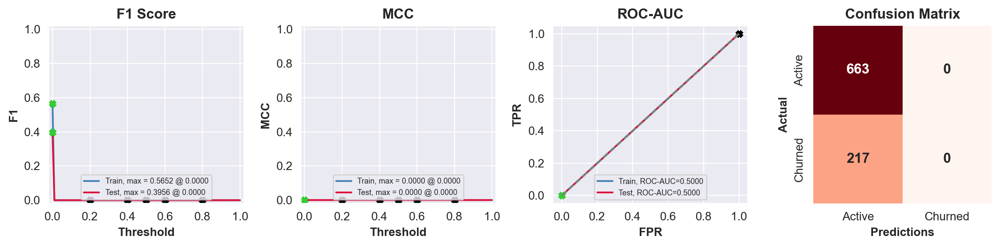

,train,test
ROC AUC,0.5000,0.5000
Accuracy,0.6061,0.7534
F1,0.0000,0.0000
MCC,0.0000,0.0000


The model's stats have been stored.


In [119]:
base = DummyClassifier(strategy = 'most_frequent')

# train base
base.fit(X_train_s, y_train_s)
stats = evaluate_model(base, 'Base', X_train_up, y_train_up, X_val, y_val, train_times['Base'])

append_metrics(stats)
best_models['Base'] = base

[Back to Contents](#contents)

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;"> <strong>Marlow you followed a well-structured training workflow. The pipeline for training, optimizing, and evaluating models is well-organized, with clear separation of concerns in functions like train_base_model, optimize_model, and evaluate_model.</strong></div>

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;"> <strong>Incorporating both Bayesian Optimization (BayesSearchCV) and Optuna for hyperparameter tuning showcases an effective approach to finding the best model configuration.</strong></div>

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;"> <strong>Dynamic threshold analysis is a valuable addition to assess performance beyond default thresholds.</strong></div>

<div style="border: 2px solid darkblue; padding: 10px; background-color: #d4e4f7; color: black; border-radius: 5px;"> <strong>Suggestion: Use stratified sampling for training/validation splits to ensure representative class distributions during Bayesian Optimization and Optuna trials. Reduce n_trials in Optuna or iterations in Bayesian Optimization for computationally intensive models to save time. </div>

## 7.3 Decision Tree
<a id='tree_tune'></a>

### Base

In [120]:
#best_models['Tree Base'], train_times['Tree Base'] = train_base_model(DecisionTreeClassifier())

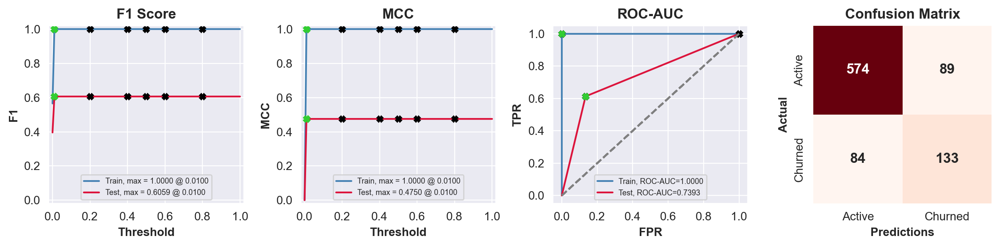

,train,test
ROC AUC,1.0,0.7393
Accuracy,1.0,0.8034
F1,1.0,0.6059
MCC,1.0,0.4750


The model's stats have been stored.


In [121]:
stats = evaluate_model(best_models['Tree Base'], 'Tree Base', X_train_up, y_train_up, X_val, y_val, train_times['Tree Base'])
append_metrics(stats)

### Tuned

The following hyperparamter will be tuned:
- `max_depth`: The maximum depth of the decision tree. If the value is too low, the model might not be able to generalize well. However, a high value may cause overfitting.
    - We already know that a lower max_depth performs well, so we will focus on that. 

In [122]:
# show params
param_cols = ['max_depth']

show_params(best_models['Tree'].named_steps['model'], param_cols)

max_depth: 6


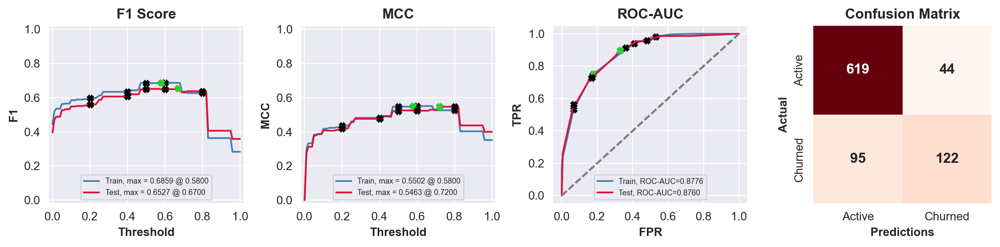

,train,test
ROC AUC,0.8776,0.8760
Accuracy,0.8065,0.8420
F1,0.6859,0.6371
MCC,0.5502,0.5463


In [123]:
stats = evaluate_model(best_models['Tree'], 'Tree', X_train_s, y_train_s, X_val, y_val, train_times['Tree'])

The Decision Tree model has a validation ROC-AUC of 0.8760, which is better than the un-tuned tree model and better than our base model. This makes it our best model so far.

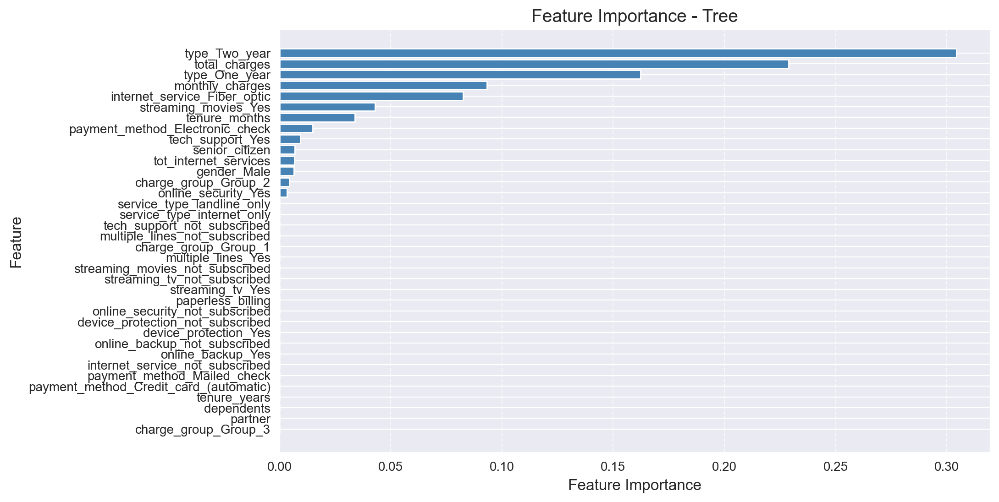

In [124]:
plot_feature_importance(best_models['Tree'], 'Tree', pipeline=True)

In [125]:
append_metrics(stats)

The model's stats have been stored.


===============================================================================================================

In [126]:
show_final_df()

,Model,F1 Train,ROC AUC Train,Accuracy Train,MCC Train,Train Time,F1 Test,ROC AUC Test,Accuracy Test,MCC Test,Prediction Time
2,Tree,0.6859,0.8776,0.8065,0.5502,23.91,0.6371,0.8760,0.8420,0.5463,0.00
1,Tree Base,1.0000,1.0000,1.0000,1.0000,27.51,0.6059,0.7393,0.8034,0.4750,0.62
0,Base,0.0000,0.5000,0.6061,0.0000,0.00,0.0000,0.5000,0.7534,0.0000,0.00


[Back to Contents](#contents)

## 7.4 Logistic Regression
<a id='logr_tune'></a>

### Base

In [127]:
#best_models['LogR Base'], train_times['LogR Base'] = train_base_model(LogisticRegression())

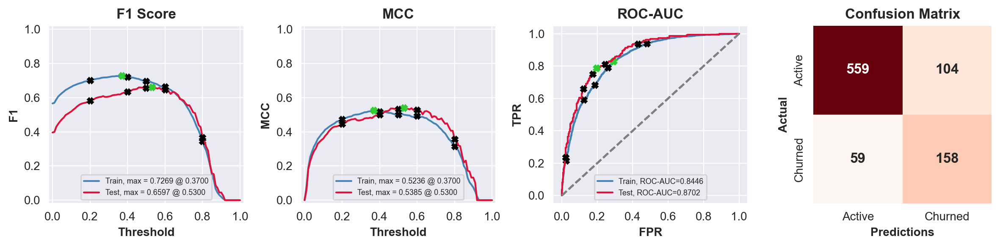

,train,test
ROC AUC,0.8446,0.8702
Accuracy,0.7559,0.8148
F1,0.7269,0.6597
MCC,0.5236,0.5385


The model's stats have been stored.


In [128]:
stats = evaluate_model(best_models['LogR Base'], 'LogR Base', 
                       X_train_up, y_train_up,
                       X_val, y_val,
                       train_times['LogR Base'])
append_metrics(stats)

The base LogR model already performs well. We may not get much more performance out of tuning the hyperparameters. 

### Tuned

The following hyperparameters will be tuned:
- `penalty`: Defines the type of regularization to apply. Useful in preventing overfitting.
- `solver`: The algorithm used ot optimize the cost function. We will focus on solvers suited for smaller data sets.
- `C`: Conrols the strength of regularization. Larger values reduce reg. to fit the data more closely, while smaller values increase reg., preventing overfitting.
- `max_iter`: Maximum number of iterations allowed for the solver to converge. 

In [129]:
# show params
param_cols = ['penalty', 'solver', 
              'C', 'max_iter']

show_params(best_models['LogR'].named_steps['model'], param_cols)

C: 0.061250926584726854
max_iter: 135
penalty: None
solver: newton-cg


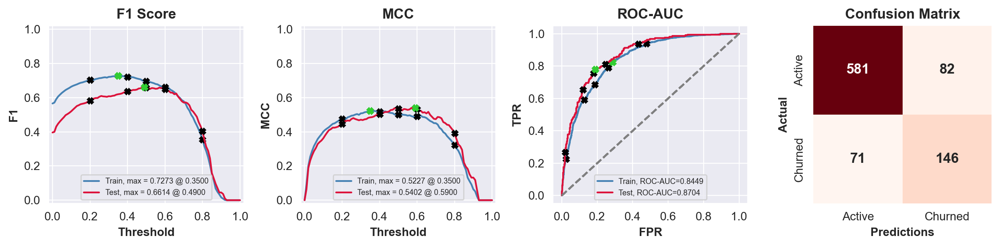

,train,test
ROC AUC,0.8449,0.8704
Accuracy,0.7520,0.8261
F1,0.7273,0.6562
MCC,0.5227,0.5402


In [130]:
stats = evaluate_model(best_models['LogR'], 'LogR', 
                       X_train_up, y_train_up,
                       X_val, y_val,
                       train_times['LogR'])

We marginally increased ROC-AUC by  increasing the number of correct active predictions, but slightly decreased the number of correct churned predictions.  Accuracy has slightly improved, while the other metrics did not. We likely have reached a ceiling with the logistic regression model, but it is a powerful predictor. 

The `Tree` model is the best model we have so far. 

In [131]:
append_metrics(stats)

The model's stats have been stored.


==============================================================================================================

In [132]:
show_final_df()

,Model,F1 Train,ROC AUC Train,Accuracy Train,MCC Train,Train Time,F1 Test,ROC AUC Test,Accuracy Test,MCC Test,Prediction Time
2,Tree,0.6859,0.8776,0.8065,0.5502,23.91,0.6371,0.8760,0.8420,0.5463,0.00
4,LogR,0.7273,0.8449,0.7520,0.5227,32.14,0.6562,0.8704,0.8261,0.5402,1.00
3,LogR Base,0.7269,0.8446,0.7559,0.5236,19.11,0.6597,0.8702,0.8148,0.5385,1.52
1,Tree Base,1.0000,1.0000,1.0000,1.0000,27.51,0.6059,0.7393,0.8034,0.4750,0.62
0,Base,0.0000,0.5000,0.6061,0.0000,0.00,0.0000,0.5000,0.7534,0.0000,0.00


[Back to Contents](#contents)

## 7.5 Decision Tree with Adaptive Boosting
<a id='ada_tune'></a>

Adaptive Boosting is an ensemble learning algorithm designed to improve the performance of weak classifiers by iteratively combining them into a strong classifier. We will start with a Decision Stump: a Decision Tree with a max_depth of 1.

### Base

In [133]:
base_est = DecisionTreeClassifier(max_depth = 1)

base_ada = AdaBoostClassifier(estimator = base_est)

In [134]:
#best_models['Ada Base'], train_times['Ada Base'] = train_base_model(base_ada)

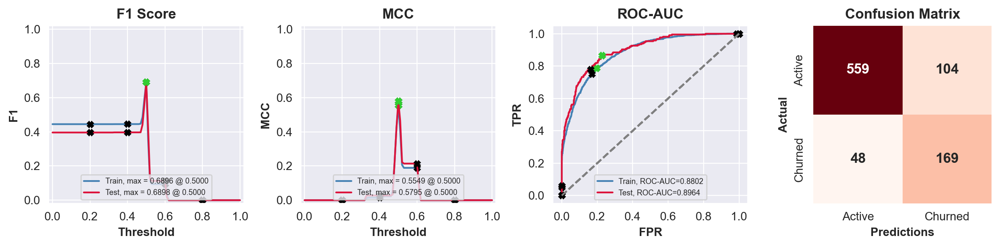

,train,test
ROC AUC,0.8802,0.8964
Accuracy,0.8074,0.8273
F1,0.6896,0.6898
MCC,0.5549,0.5795


In [135]:
stats = evaluate_model(best_models['Ada Base'], 'Ada Base',
                       X_train_s, y_train_s, 
                       X_val, y_val,
                       train_times['Ada Base'])

In [136]:
append_metrics(stats)

The model's stats have been stored.


As with the Log Regression base model, the DT w/ adaptive boosting performs well. We will attempt to improve performance via tuning the parameters. 

### Tuned

The following hyperparameters will be tuned for the adaptive boosting model; for the Decision Tree, refer back to [7.3](#tree_tune).

- `n_estimators`: The maximum number of estimators at which boosting is terminated. A value too high can lead to overfitting. 
- `learning_rate`: Weight applied to each classifier at each boosting iteration. A high value can converge faster, but may lead to overfitting. 

In [137]:
# show params
param_cols = ['estimator__max_depth', 'estimator__ccp_alpha', 
              'n_estimators', 'learning_rate']

show_params(best_models['Ada'].named_steps['model'], param_cols)

estimator__ccp_alpha: 0
estimator__max_depth: 1
learning_rate: 1.0
n_estimators: 145


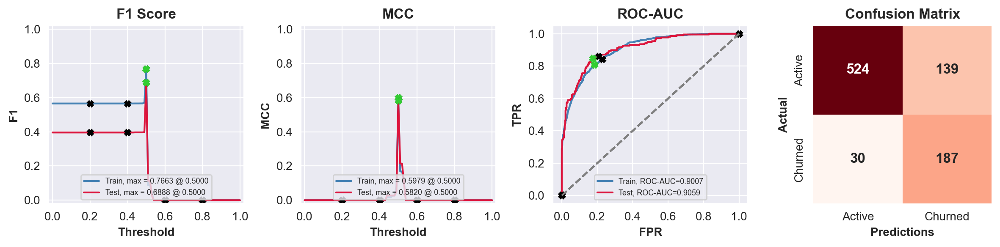

,train,test
ROC AUC,0.9007,0.9059
Accuracy,0.7978,0.8080
F1,0.7663,0.6888
MCC,0.5979,0.5820


In [138]:
stats = evaluate_model(best_models['Ada'], 'Ada',
                       X_train_up, y_train_up, 
                       X_val, y_val,
                       train_times['Ada'])

The ROC-AUC is the highest we've seen yet. This model converges well and generalizes unseen data well. This is our best model so far. 

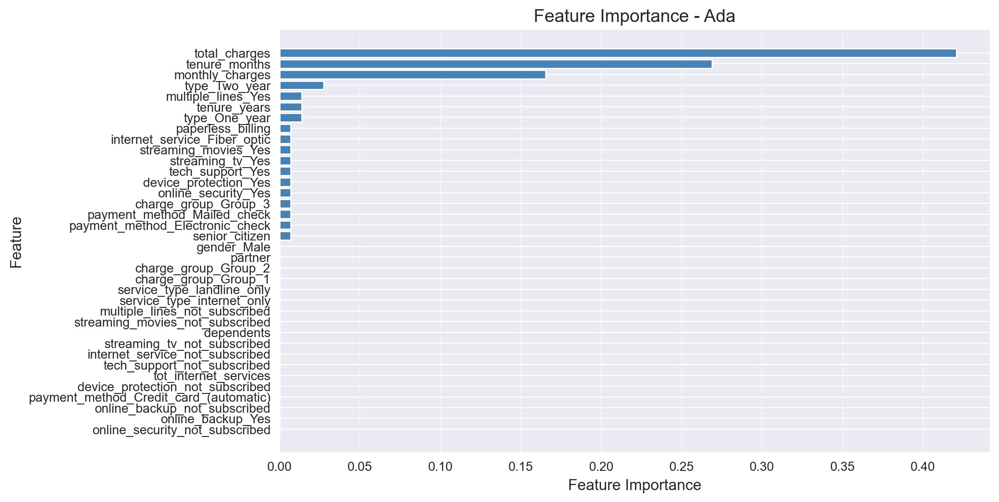

In [139]:
plot_feature_importance(best_models['Ada'], 'Ada', pipeline=True)

In [140]:
# store the model
append_metrics(stats)

The model's stats have been stored.


================================================================================================================

In [141]:
show_final_df().head(5)

,Model,F1 Train,ROC AUC Train,Accuracy Train,MCC Train,Train Time,F1 Test,ROC AUC Test,Accuracy Test,MCC Test,Prediction Time
6,Ada,0.7663,0.9007,0.7978,0.5979,444.15,0.6888,0.9059,0.8080,0.5820,19.72
5,Ada Base,0.6896,0.8802,0.8074,0.5549,209.98,0.6898,0.8964,0.8273,0.5795,8.68
2,Tree,0.6859,0.8776,0.8065,0.5502,23.91,0.6371,0.8760,0.8420,0.5463,0.00
4,LogR,0.7273,0.8449,0.7520,0.5227,32.14,0.6562,0.8704,0.8261,0.5402,1.00
3,LogR Base,0.7269,0.8446,0.7559,0.5236,19.11,0.6597,0.8702,0.8148,0.5385,1.52


[Back to Contents](contents)

## 7.6 CatBoost

CatBoost has been a high-performing model in previous projects and I expect it to do well here. It handles categorical features efficiently without excessive preprocessing (we've done that anyway). CatBoost does tend to have very high convergence times when tuning and therefore we will utilize small parameter grids to narrow a search to reduce search time. 

### Base

In [142]:
#best_models['Cat Base'], train_times['Cat Base'] = train_base_model(CatBoostClassifier(verbose = 0))

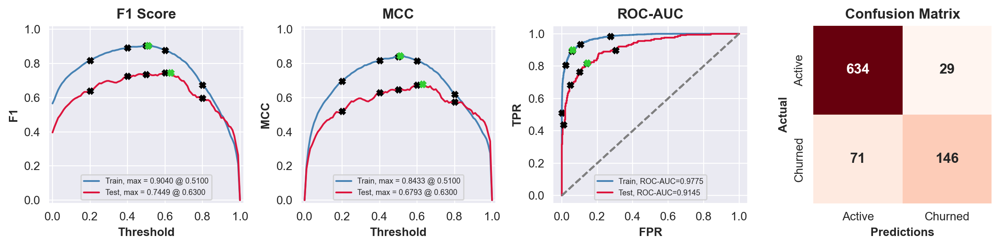

,train,test
ROC AUC,0.9775,0.9145
Accuracy,0.9255,0.8864
F1,0.9040,0.7449
MCC,0.8433,0.6793


In [143]:
stats = evaluate_model(best_models['Cat Base'], 'Cat Base',
                       X_train_up, y_train_up,
                       X_val, y_val,
                       train_times['Cat Base'])

There is some overfitting we will try to correct, but the base CatBoost metrics are decently strong. 

In [144]:
append_metrics(stats)

The model's stats have been stored.


### Tuned

The following hyperparameters will be tuned:
- `iterations`: The number of boosting iterations (trees). Higher values allow the model to learn more complex patterns but can increase overfitting and training time.
- `depth`: The maximum depth of each tree. Controls the complexity of the model. Deeper trees can capture more interactions but may lead to overfitting.
- `learning_rate`: The step size for optimization. Smaller values make training slower but more precise, while larger values speed up training but risk overfitting.
- `reg_lambda`: Regularization parameter to penalize large leaf values, reducing overfitting. Larger values --> greater reg.
-  `subsample`: Fraction of data used to grow each tree. Helps prevent overfitting by introducing randomness. 1 --> full dataset
-  `random_strength`: Controls randomness in tree splitting. Higher values increase randomness, which can reduce overfitting at the cost of accuracy. 

In [145]:
# set up for modelling
opt_model = CatBoostClassifier

def objective(trial):
    # define search space
    hyperparameters = {
        'iterations': trial.suggest_int('iterations', 50, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 1e-3, 1e0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-4, 1e4, log=True),
        'class_weights': trial.suggest_categorical('class_weights', [[1,1], [1,1.1], [1,1.2], 
                                                                     [1,1.3], [1,1.4], [1,1.5]]),
        'subsample': trial.suggest_float('subsample', 0.7, 1.0),
        'verbose': trial.suggest_categorical('verbose', [False])
    }

    # resample
    sampler = final_sampler
    X, y = sampler.fit_resample(X_train, y_train)

    # train andd evaluate
    model = opt_model(**hyperparameters)
    model.fit(X, y, eval_set = (X_val, y_val), early_stopping_rounds = 10)
    val_roc_auc = metrics.roc_auc_score(y_val, model.predict_proba(X_val)[:, 1])

    return val_roc_auc

n_trials = 200

In [146]:
# show params
best_models['Cat'].get_params()

{'iterations': 342,
 'learning_rate': 0.3281179795151234,
 'verbose': False,
 'class_weights': [1, 1.1],
 'subsample': 0.7906756133786815,
 'max_depth': 4,
 'reg_lambda': 2.798563042211526}

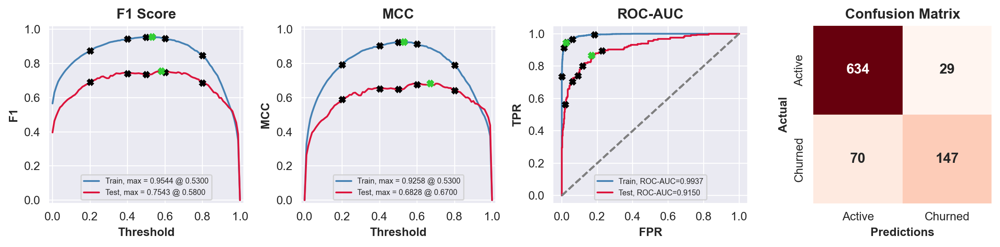

,train,test
ROC AUC,0.9937,0.9150
Accuracy,0.9646,0.8875
F1,0.9544,0.7481
MCC,0.9258,0.6828


In [147]:
stats = evaluate_model(best_models['Cat'], 'Cat',
                       X_train_up, y_train_up,
                       X_val, y_val,
                       train_times['Cat'])

The ROC-AUC is the highest we've seen yet. This model's accuracy is considerably higher than the other models.  

In [148]:
# save the model
append_metrics(stats)

The model's stats have been stored.


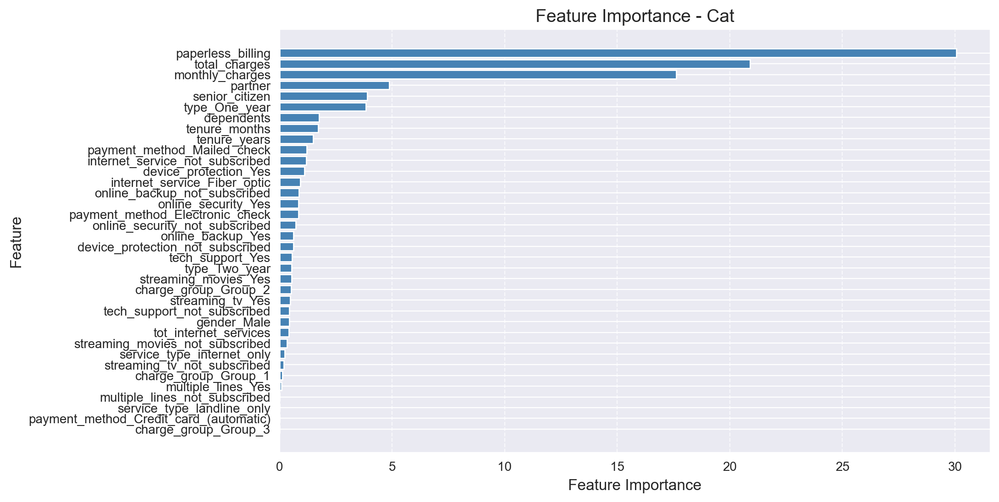

In [149]:
plot_feature_importance(best_models['Cat'], 'Cat')

================================================================================================================

In [150]:
# observe top rows
show_final_df().head()

,Model,F1 Train,ROC AUC Train,Accuracy Train,MCC Train,Train Time,F1 Test,ROC AUC Test,Accuracy Test,MCC Test,Prediction Time
8,Cat,0.9544,0.9937,0.9646,0.9258,745.21,0.7481,0.9150,0.8875,0.6828,1.52
7,Cat Base,0.9040,0.9775,0.9255,0.8433,2850.95,0.7449,0.9145,0.8864,0.6793,1.64
6,Ada,0.7663,0.9007,0.7978,0.5979,444.15,0.6888,0.9059,0.8080,0.5820,19.72
5,Ada Base,0.6896,0.8802,0.8074,0.5549,209.98,0.6898,0.8964,0.8273,0.5795,8.68
2,Tree,0.6859,0.8776,0.8065,0.5502,23.91,0.6371,0.8760,0.8420,0.5463,0.00


[Back to Contents](contents)

## 7.7 XGBoost

XGBoost is a powerful and efficient gradient-boosting framework designed for structured data and utilizes regularization quite well. It may have decent results for our dataset. 

### Base

In [151]:
base_xgb = XGBClassifier(eval_metric = 'auc', verbose = -1)

In [152]:
#best_models['XGB Base'], train_times['XGB Base'] = train_base_model(base_xgb)

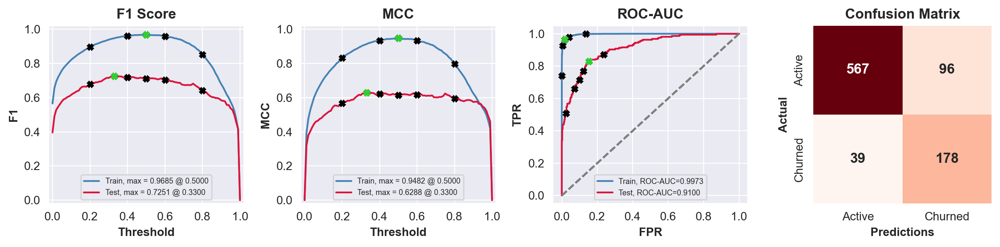

,train,test
ROC AUC,0.9973,0.9100
Accuracy,0.9753,0.8466
F1,0.9685,0.7251
MCC,0.9482,0.6288


In [153]:
stats = evaluate_model(best_models['XGB Base'], 'XGB Base',
                       X_train_up, y_train_up,
                       X_val, y_val,
                       train_times['XGB Base'])

The base XGB model is suffering from overfitting. Let's tune some regularization parameters and depth to address this. 

In [154]:
append_metrics(stats)

The model's stats have been stored.


### Tuned

We will tune the following hyperparameters:
- `n_estimators`: The number of trees to build.
- `max_depth`: Maximum depth of a tree. Allows for more complex patterns but risks overfitting.
- `max_leaves`: Number of nodes to be added on a tree. 
- `learning_rate`: Shrinks the weight of each new tree. Smaller values require more trees to converge but improves generalization.  
- `reg_lambda`: L2 regularization term. Penalizes large weights and helps reduce overfitting.
- `reg_alpha`: L1 regularization term.
- `subsample`: Fraction of the training data randomly sampled for each tree.
- `colsample_bytree`: Fraction of features randomly sampled for each tree. Adds further randomness by controlling which features are used.

In [155]:
# set up for modelling
opt_model = XGBClassifier

def objective(trial):
    # define search space
    hyperparameters = {
        'n_estimators': trial.suggest_int('iterations', 30, 300),
        'num_leaves': trial.suggest_int('num_leaves', 4, 256),
        'max_depth': trial.suggest_int('max_depth', 3, 500),
        'learning_rate': trial.suggest_float('learning_rate', 1e-3, 1e0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-4, 1e4, log=True),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-4, 1e4, log=True),
        'verbose': trial.suggest_int('verbose', -1, -1)
    }

    # resample
    sampler = final_sampler
    X, y = sampler.fit_resample(X_train, y_train)

    # train andd evaluate
    model = opt_model(eval_metric = 'auc', **hyperparameters)
    model.fit(X, y)
    val_roc_auc = metrics.roc_auc_score(y_val, model.predict_proba(X_val)[:, 1])

    return val_roc_auc

n_trials = 200

In [156]:
# show params
param_cols = ['n_estimators', 'num_leaves', 'max_depth', 'learning_rate', 'reg_lambda', 'reg_alpha']

show_params(best_models['XGB'], param_cols)

learning_rate: 0.5407770721615613
max_depth: 3
n_estimators: None
reg_alpha: 0.0003350810795827914
reg_lambda: 7.054686688439282
num_leaves: 12


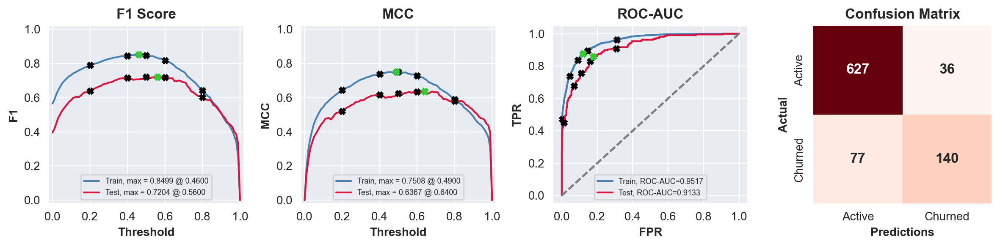

,train,test
ROC AUC,0.9517,0.9133
Accuracy,0.8811,0.8716
F1,0.8487,0.7125
MCC,0.7508,0.6367


In [157]:
stats = evaluate_model(best_models['XGB'], 'XGB',
                       X_train_up, y_train_up,
                       X_val, y_val,
                       train_times['XGB'])

The XGBoost model still has a minor overfitting issue, but we have mediated the degree as much as possible and is one of our top models. 

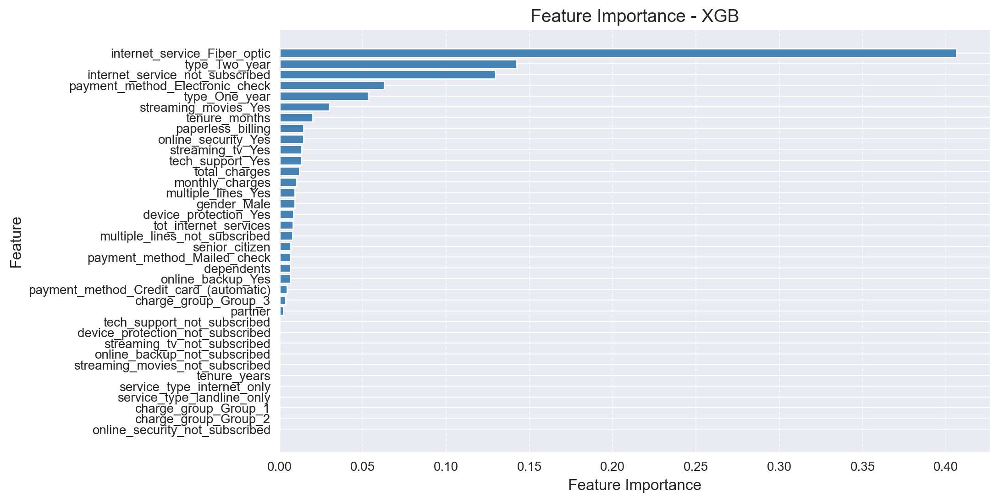

In [158]:
plot_feature_importance(best_models['XGB'], 'XGB')

In [159]:
append_metrics(stats)

The model's stats have been stored.


===============================================================================================================

In [160]:
show_final_df().head()

,Model,F1 Train,ROC AUC Train,Accuracy Train,MCC Train,Train Time,F1 Test,ROC AUC Test,Accuracy Test,MCC Test,Prediction Time
8,Cat,0.9544,0.9937,0.9646,0.9258,745.21,0.7481,0.9150,0.8875,0.6828,1.52
7,Cat Base,0.9040,0.9775,0.9255,0.8433,2850.95,0.7449,0.9145,0.8864,0.6793,1.64
10,XGB,0.8487,0.9517,0.8811,0.7508,68.91,0.7125,0.9133,0.8716,0.6367,8.59
9,XGB Base,0.9685,0.9973,0.9753,0.9482,227.31,0.7251,0.9100,0.8466,0.6288,10.17
6,Ada,0.7663,0.9007,0.7978,0.5979,444.15,0.6888,0.9059,0.8080,0.5820,19.72


[Back to Contents](#contents)

## 7.8 LightGBM
<a id='lgbm_tune'></a>

LightGBM is a powerful gradient boosting model that has been a strong performer in previous projects and in our results from SMOTE analysis in this project, it was a top model. It should perform very well. 

### Base

In [161]:
base_lgbm = LGBMClassifier(verbose = -1)

In [162]:
#best_models['LGBM Base'], train_times['LGBM Base'] = train_base_model(base_lgbm)

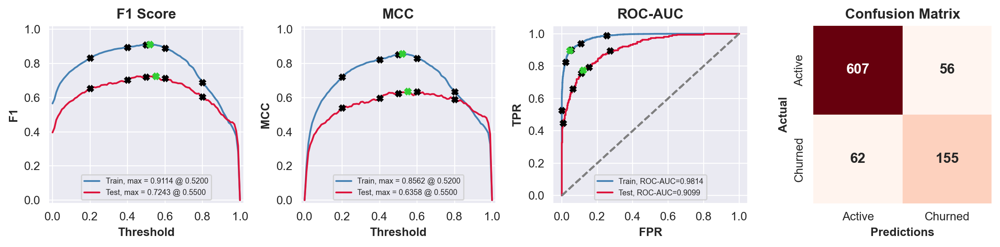

,train,test
ROC AUC,0.9814,0.9099
Accuracy,0.9316,0.8659
F1,0.9114,0.7243
MCC,0.8562,0.6358


In [163]:
stats = evaluate_model(best_models['LGBM Base'], 'LGBM Base',
                       X_train_up, y_train_up,
                       X_val, y_val,
                       train_times['LGBM Base'])

This is already very good, we will attempt to reduce the overfitting and achieve better convergence. 

In [164]:
append_metrics(stats)

The model's stats have been stored.


### Tuned

The following hyperparameters will be tuned:
- `num_leaves`: Maximum number of leaves per tree.
    - Larger values tend to increase model complexity but also risk overfitting.
- `learning_rate`: Controls how quickly the model adjusts weights with respect to the error.
    - Lower values tend to make the model learn more slowly, but can yield better performance with more boosting iterations. 
- `n_estimators`: The number of boosting iterations or trees.
    - Lower learning_rate usually requires higher n_estimators.
- `max_depth`: Maximum depth of each tree. Deeper trees capture more information but may lead to overfitting.
    - lower values can prevent overfitting, but too low will underfit.
- `feature_fraction`: The proportion of features to be randomly selected for each tree.
    - Helps in regularizing the model and making it more robust.
- `reg_alpha`: L1 regularization term adds a penalty porportional to the absolute value of coefficients to reduce overfitting and encourage sparsity. 
- `reg_lambda`: Regularization parameter for controlling the L2 penalty, which is used to shrink the coefficients in the model.

In [165]:
# set up for modelling
opt_model = LGBMClassifier

def objective(trial):
    # define search space
    hyperparameters =  {
        'learning_rate': trial.suggest_float('learning_rate', 1e-3, 1e0, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 4, 256),
        'n_estimators': trial.suggest_int('n_estimators', 50, 250),
        'max_depth': trial.suggest_int('max_depth', 5, 100),
        'reg_alpha': trial.suggest_float('reg_alpha',1e-3 , 1e3, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 1e3, log=True),
        'feature_fraction': trial.suggest_categorical('feature_fraction', [0.6, 0.7, 0.8, 0.9, 1.0])
    }

    # resample
    sampler = final_sampler
    X, y = sampler.fit_resample(X_train, y_train)

    # train andd evaluate
    model = opt_model(scale_pos_weight = xgb_weights(y_train_up), **hyperparameters)
    model.fit(X, y)
    val_roc_auc = metrics.roc_auc_score(y_val, model.predict_proba(X_val)[:, 1])

    return val_roc_auc

n_trials = 300

In [166]:
# show params
param_cols = ['learning_rate', 'num_leaves', 'n_estimators', 'max_depth' 
              'reg_alpha', 'reg_lambda', 'feature_fraction']

show_params(best_models['LGBM'], param_cols)

learning_rate: 0.9169680480508201
n_estimators: 191
num_leaves: 27
reg_lambda: 45.27262751424063
feature_fraction: 1.0


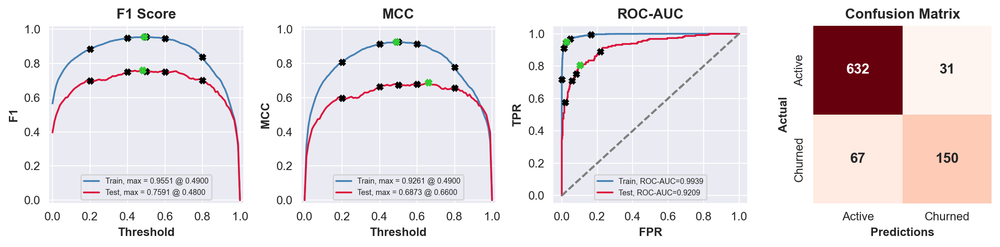

,train,test
ROC AUC,0.9939,0.9209
Accuracy,0.9648,0.8886
F1,0.9551,0.7538
MCC,0.9261,0.6873


In [167]:
stats = evaluate_model(best_models['LGBM'], 'LGBM',
                       X_train_up, y_train_up,
                       X_val, y_val,
                       train_times['LGBM'])

An ROC of 0.9209 is very good, and is our best ROC, but the model seems to be severely overfitting. Regardless the model presents similar accuracy as our catboost model, but a lower F1 and a higher MCC. This is likely our best model so far, but the CatBoost is still an excellent choice. 

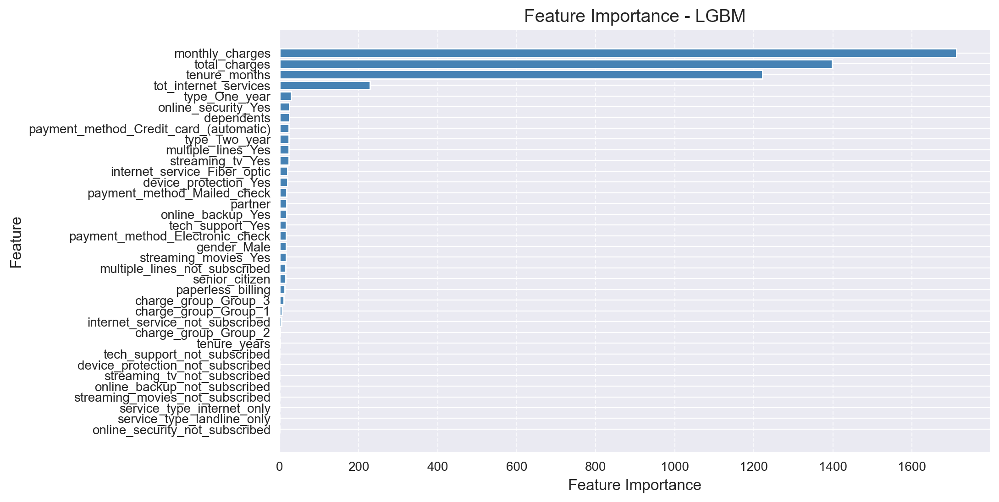

In [168]:
plot_feature_importance(best_models['LGBM'], 'LGBM')

In [169]:
append_metrics(stats)

The model's stats have been stored.


===============================================================================================================

In [170]:
show_final_df().head()

,Model,F1 Train,ROC AUC Train,Accuracy Train,MCC Train,Train Time,F1 Test,ROC AUC Test,Accuracy Test,MCC Test,Prediction Time
12,LGBM,0.9551,0.9939,0.9648,0.9261,149.79,0.7538,0.9209,0.8886,0.6873,1.53
8,Cat,0.9544,0.9937,0.9646,0.9258,745.21,0.7481,0.9150,0.8875,0.6828,1.52
7,Cat Base,0.9040,0.9775,0.9255,0.8433,2850.95,0.7449,0.9145,0.8864,0.6793,1.64
10,XGB,0.8487,0.9517,0.8811,0.7508,68.91,0.7125,0.9133,0.8716,0.6367,8.59
9,XGB Base,0.9685,0.9973,0.9753,0.9482,227.31,0.7251,0.9100,0.8466,0.6288,10.17


[Back to Contents](#contents)

## 7.9 Histogram Gradient Boosting
<a id='hist_tune'></a>

Histogram Gradient Boosting is an efficient gradient boosting algorithm based on histogram binning that does especially well with large datasets. Although our data doesn't meet that criteria, let's see how a base HGB model performs. Depending on its performance, we may not further tune it. 

### Base

In [171]:
base_hgb = HistGradientBoostingClassifier(random_state = 12345)

In [172]:
#best_models['HGB Base'], train_times['HGB Base'] = train_base_model(base_hgb)

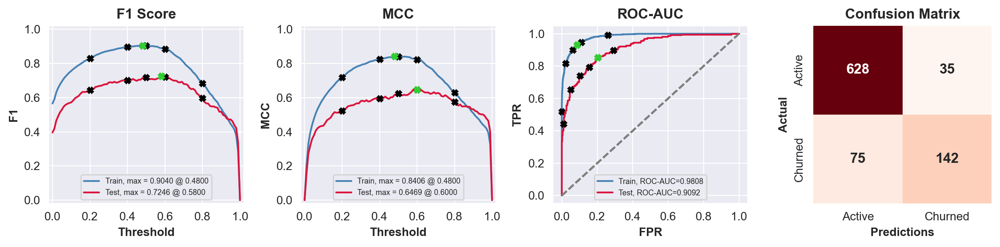

,train,test
ROC AUC,0.9808,0.9092
Accuracy,0.9236,0.8750
F1,0.9040,0.7208
MCC,0.8406,0.6469


In [173]:
stats = evaluate_model(best_models['HGB Base'], 'HGB Base',
                       X_train_up, y_train_up,
                       X_val, y_val,
                       train_times['HGB Base'])

There is some overfitting as the default max_depth is None. We can also tune `max_iter` and `l2_regularization`. Let's see if we can improve upon this model. 

In [174]:
append_metrics(stats)

The model's stats have been stored.


### Tuned

We will tune the following hyperparameters:
- `max_iter`: The max number of trees for classification.
- `max_depth`: The max depth for each tree.
- `l2_regularization`: The parameter penalizing leaves with small hessians.
  - The default is no regularization, should improve overfitting. 

In [175]:
# set up for modelling
opt_model = HistGradientBoostingClassifier

def objective(trial):
    # define search space
    hyperparameters =  {
        'max_iter': trial.suggest_int('max_iter', 20, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'l2_regularization': trial.suggest_float('l2_regularization', 1e-3, 1e3, log=True )
    }

    # resample
    sampler = final_sampler
    X, y = sampler.fit_resample(X_train, y_train)

    # train andd evaluate
    model = opt_model(class_weight = 'balanced', **hyperparameters)
    model.fit(X, y)
    val_roc_auc = metrics.roc_auc_score(y_val, model.predict_proba(X_val)[:, 1])

    return val_roc_auc

n_trials = 400

In [176]:
# show params
# show params
param_cols = ['max_iter', 'max_depth', 
              'l2_regularization']

show_params(best_models['HGB'], param_cols)

l2_regularization: 0.00914969846452256
max_depth: 4
max_iter: 485


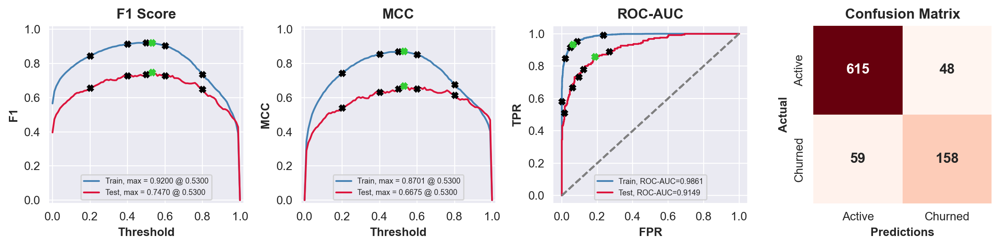

,train,test
ROC AUC,0.9861,0.9149
Accuracy,0.9382,0.8784
F1,0.9200,0.7470
MCC,0.8701,0.6675


In [177]:
stats = evaluate_model(best_models['HGB'], 'HGB',
                       X_train_up, y_train_up,
                       X_val, y_val,
                       train_times['HGB'])

We were able to successfully raise the ROC to 0.9149, but that does not account for the overfitting. The model is also just shy of the highest accuracy. The model did not achieve our highest F1 or MCC, but did well in all metrics and it is in our top 3 metrics. 

In [178]:
append_metrics(stats)

The model's stats have been stored.


===============================================================================================================

In [179]:
show_final_df().head()

,Model,F1 Train,ROC AUC Train,Accuracy Train,MCC Train,Train Time,F1 Test,ROC AUC Test,Accuracy Test,MCC Test,Prediction Time
12,LGBM,0.9551,0.9939,0.9648,0.9261,149.79,0.7538,0.9209,0.8886,0.6873,1.53
8,Cat,0.9544,0.9937,0.9646,0.9258,745.21,0.7481,0.9150,0.8875,0.6828,1.52
14,HGB,0.9200,0.9861,0.9382,0.8701,510.43,0.7470,0.9149,0.8784,0.6675,7.21
7,Cat Base,0.9040,0.9775,0.9255,0.8433,2850.95,0.7449,0.9145,0.8864,0.6793,1.64
10,XGB,0.8487,0.9517,0.8811,0.7508,68.91,0.7125,0.9133,0.8716,0.6367,8.59


[Back To Contents](#contents)

## 7.10 Neural Network
<a id='net_tune'></a>

We will use TensorFlow/Keras to build the model. 

In [180]:
# confrim gpu works
print("TensorFlow version:", tf.__version__)
print("Is GPU available:", tf.config.list_physical_devices('GPU'))
print()

physical_devices = tf.config.experimental.list_physical_devices('GPU')
print(tf.config.experimental.get_device_details(physical_devices[0]))


TensorFlow version: 2.10.0
Is GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

{'device_name': 'NVIDIA GeForce RTX 4090', 'compute_capability': (8, 9)}


In [181]:
# Prepare the data - numpy arrays
X_train_nn = X_train_up.values
y_train_nn = y_train_up.values

In [182]:
X_train_nn.shape

(6359, 36)

In [183]:
y_train_nn.shape

(6359,)

In [184]:
# Define the network
def build_nn(learning_rate = 0.001, drop_rate = 0.2, l2_reg = 0.01):
    
    model = Sequential([        
        Dense(64, activation = 'relu', input_dim = X_train_nn.shape[1], kernel_regularizer = regularizers.l2(l2_reg)),
        Dropout(drop_rate / 2),
        
        Dense(32, activation = 'relu', kernel_regularizer = regularizers.l2(l2_reg)),
    
        Dense(1, activation = 'sigmoid') # output layer
    ])

    model.compile(optimizer = Adam(learning_rate = learning_rate),
                  loss = 'binary_crossentropy',
                  metrics = ['AUC'])
    return model

# overfitting prevention
early_stopping = EarlyStopping(
    monitor = 'val_auc',
    patience = 10, #-------------# epochs
    restore_best_weights = True
)

In [185]:
# create classifier instance for optimization in scikit-learn
neural_network = KerasClassifier(build_fn = build_nn, verbose = 1)

### Base

In [186]:
%%time
# Train the model
start = time.time()
training_log = neural_network.fit(
    X_train_nn, y_train_nn,
    validation_data = (X_val.values, y_val.values),
    class_weight = {0: 1.0, 1: 2.0},
    batch_size = 16,
    epochs = 30,
    callbacks = [early_stopping],
    verbose = 1
)

end = time.time()

nn_train_time = round(1000 * (end - start), 2)

train_times['NN'] = nn_train_time

Epoch 1/30
398/398 [==============================] - 4s 6ms/step - loss: 1.1232 - auc: 0.8123 - val_loss: 0.7162 - val_auc: 0.8601
Epoch 2/30
398/398 [==============================] - 2s 4ms/step - loss: 0.8036 - auc: 0.8345 - val_loss: 0.5847 - val_auc: 0.8651
Epoch 3/30
398/398 [==============================] - 2s 4ms/step - loss: 0.7467 - auc: 0.8365 - val_loss: 0.6296 - val_auc: 0.8635
Epoch 4/30
398/398 [==============================] - 2s 4ms/step - loss: 0.7291 - auc: 0.8370 - val_loss: 0.5839 - val_auc: 0.8663
Epoch 5/30
398/398 [==============================] - 2s 4ms/step - loss: 0.7163 - auc: 0.8393 - val_loss: 0.5608 - val_auc: 0.8665
Epoch 6/30
398/398 [==============================] - 2s 4ms/step - loss: 0.7117 - auc: 0.8389 - val_loss: 0.5183 - val_auc: 0.8651
Epoch 7/30
398/398 [==============================] - 2s 4ms/step - loss: 0.7083 - auc: 0.8398 - val_loss: 0.5093 - val_auc: 0.8672
Epoch 8/30
398/398 [==============================] - 2s 4ms/step - loss: 0.

28/28 [==============================] - 0s 914us/step


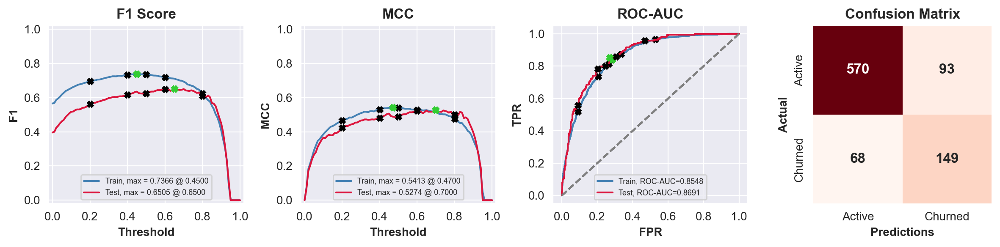

,train,test
ROC AUC,0.8548,0.8691
Accuracy,0.7646,0.8170
F1,0.7365,0.6492
MCC,0.5413,0.5274


In [187]:
stats = evaluate_model(neural_network, 'NN',
                       X_train_up, y_train_up,
                       X_val, y_val, 
                       train_times['NN'], 
                       nn = True)

This is not our highest scoring model but it is generalizing well via the ROC, but with lower accuracy. Overall, as a base, this is very strong. 

I am unable to optimize the network using search methods due to resource restrictions as sci-kit learn's search tools do not utilize gpu. 

In [188]:
append_metrics(stats)

The model's stats have been stored.


In [189]:
show_final_df().query("Model == 'NN'")

,Model,F1 Train,ROC AUC Train,Accuracy Train,MCC Train,Train Time,F1 Test,ROC AUC Test,Accuracy Test,MCC Test,Prediction Time
15,NN,0.7365,0.8548,0.7646,0.5413,57239.84,0.6492,0.8691,0.817,0.5274,71.44


[Back to Contents](#contents)

## 7.11 Stacking Ensemble
<a id='stack_tune'></a>

In [190]:
param_storage = {}

for model_name, model in best_models.items():
    param_storage[model_name] = model.get_params()

In [191]:
base_learners = [
    ('Cat', CatBoostClassifier(**param_storage['Cat'])),
    ('LGBM', LGBMClassifier(**param_storage['LGBM'])),
]

final_learner =  best_models['LogR'].named_steps['model']

# create stack
stacking_ensemble = StackingClassifier(
    estimators = base_learners,
    final_estimator = final_learner,
    cv = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 42),
    n_jobs = -1
)

In [192]:
# observe
stacking_ensemble

StackingClassifier(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                   estimators=[('Cat',
                                <catboost.core.CatBoostClassifier object at 0x0000018617FFD6A0>),
                               ('LGBM',
                                LGBMClassifier(feature_fraction=1.0,
                                               learning_rate=0.9169680480508201,
                                               max_depth=13, n_estimators=191,
                                               num_leaves=27,
                                               reg_alpha=1.6052076361321648,
                                               reg_lambda=45.27262751424063))],
                   final_estimator=LogisticRegression(C=0.061250926584726854,
                                                      max_iter=135,
                                                      penalty=None,
                                                      solver='newton-cg'),
                   n_jobs=-1)

In [193]:
# train model
#best_models['Stack'], train_times['Stack'] = train_base_model(stacking_ensemble)

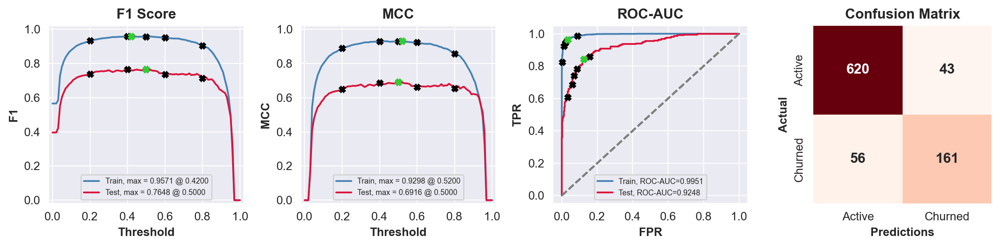

,train,test
ROC AUC,0.9951,0.9248
Accuracy,0.9665,0.8875
F1,0.9568,0.7648
MCC,0.9298,0.6916


In [194]:
stats = evaluate_model(best_models['Stack'], 'Stack',
                       X_train_up, y_train_up,
                       X_val, y_val,
                       train_times['Stack'])

This stacked model has achieved our highest ROC-AUC as well as accuracy, F1-Score, and MCC. A clean sweep of all metrics. This is all without fine tuning the individual models for the stack ensemble. I believe with better tuning methods, we could achieve greater results and account for the overfitting that is there. This model still seems to generalize well with the overfitting.  

In [195]:
append_metrics(stats)

The model's stats have been stored.


[Back to Contents](#contents)

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;"> <strong>The systematic evaluation of multiple models (e.g., Logistic Regression, Decision Tree, boosting models, neural networks, stacking ensembles) ensures an effective comparisons to identify the best-performing model. Marlow this was something that showed how dedicated you are towards learning more and going to the next level.</strong></div>

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;"> <strong>Hyper parameter tuning of each model is also something that was essential.</strong></div>

# 8. Final Model Selection & Evaluation
<a id='final'></a>

---

## 8.1 Final Model Selection
<a id='final_model'></a>

Let's observe the final dataframe to choose the final model.

In [196]:
show_final_df()

,Model,F1 Train,ROC AUC Train,Accuracy Train,MCC Train,Train Time,F1 Test,ROC AUC Test,Accuracy Test,MCC Test,Prediction Time
16,Stack,0.9568,0.9951,0.9665,0.9298,5000.33,0.7648,0.9248,0.8875,0.6916,5.10
12,LGBM,0.9551,0.9939,0.9648,0.9261,149.79,0.7538,0.9209,0.8886,0.6873,1.53
8,Cat,0.9544,0.9937,0.9646,0.9258,745.21,0.7481,0.9150,0.8875,0.6828,1.52
14,HGB,0.9200,0.9861,0.9382,0.8701,510.43,0.7470,0.9149,0.8784,0.6675,7.21
7,Cat Base,0.9040,0.9775,0.9255,0.8433,2850.95,0.7449,0.9145,0.8864,0.6793,1.64
10,XGB,0.8487,0.9517,0.8811,0.7508,68.91,0.7125,0.9133,0.8716,0.6367,8.59
9,XGB Base,0.9685,0.9973,0.9753,0.9482,227.31,0.7251,0.9100,0.8466,0.6288,10.17
11,LGBM Base,0.9114,0.9814,0.9316,0.8562,76.10,0.7243,0.9099,0.8659,0.6358,1.52
13,HGB Base,0.9040,0.9808,0.9236,0.8406,306.54,0.7208,0.9092,0.8750,0.6469,2.52
6,Ada,0.7663,0.9007,0.7978,0.5979,444.15,0.6888,0.9059,0.8080,0.5820,19.72


All of our tuned models outperformed the base models, and all performed better than the Baseline/Sanity model. Let's remove the base models for our visualizations. 

In [197]:
final_df = show_final_df(drop_bases = True).reset_index(drop=True)
final_df

,Model,F1 Train,ROC AUC Train,Accuracy Train,MCC Train,Train Time,F1 Test,ROC AUC Test,Accuracy Test,MCC Test,Prediction Time
0,Stack,0.9568,0.9951,0.9665,0.9298,5000.33,0.7648,0.9248,0.8875,0.6916,5.10
1,LGBM,0.9551,0.9939,0.9648,0.9261,149.79,0.7538,0.9209,0.8886,0.6873,1.53
2,Cat,0.9544,0.9937,0.9646,0.9258,745.21,0.7481,0.9150,0.8875,0.6828,1.52
3,HGB,0.9200,0.9861,0.9382,0.8701,510.43,0.7470,0.9149,0.8784,0.6675,7.21
4,XGB,0.8487,0.9517,0.8811,0.7508,68.91,0.7125,0.9133,0.8716,0.6367,8.59
5,Ada,0.7663,0.9007,0.7978,0.5979,444.15,0.6888,0.9059,0.8080,0.5820,19.72
6,Tree,0.6859,0.8776,0.8065,0.5502,23.91,0.6371,0.8760,0.8420,0.5463,0.00
7,LogR,0.7273,0.8449,0.7520,0.5227,32.14,0.6562,0.8704,0.8261,0.5402,1.00
8,NN,0.7365,0.8548,0.7646,0.5413,57239.84,0.6492,0.8691,0.8170,0.5274,71.44
9,Base,0.0000,0.5000,0.6061,0.0000,0.00,0.0000,0.5000,0.7534,0.0000,0.00


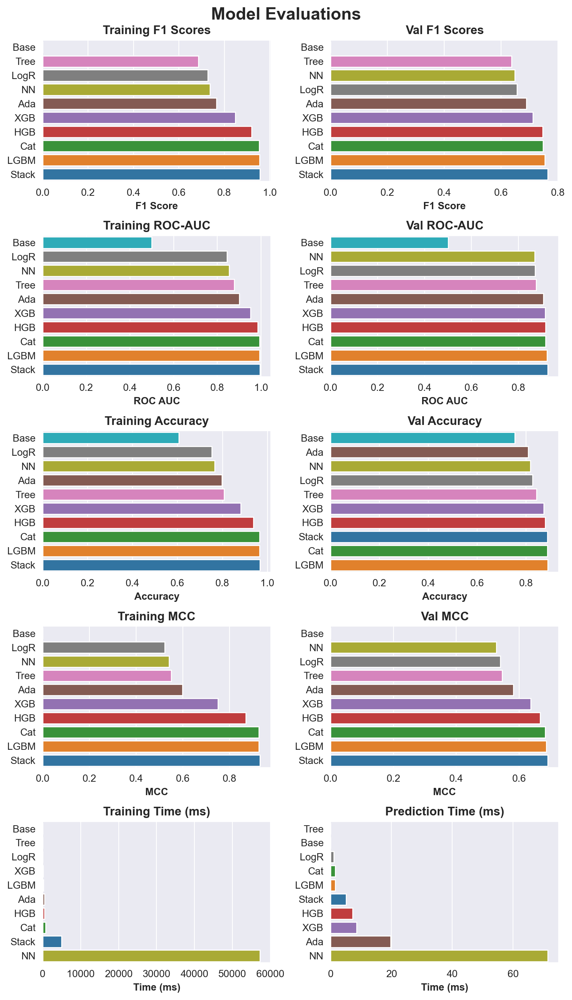

In [198]:
# visualize the dataframe
sns.set_style('darkgrid')

palette = sns.color_palette("tab10", n_colors = 10)
model_to_color = dict(zip(final_df['Model'].unique(), palette))

# List of characteristics
eval_metrics = ['F1 Train', 'F1 Test', 'ROC AUC Train', 'ROC AUC Test', 
           'Accuracy Train', 'Accuracy Test', 'MCC Train', 'MCC Test',
           'Train Time', 'Prediction Time']

titles = ['Training F1 Scores', 'Val F1 Scores', 'Training ROC-AUC', 'Val ROC-AUC',
         'Training Accuracy', 'Val Accuracy', 'Training MCC', 'Val MCC',
         'Training Time (ms)', 'Prediction Time (ms)']

xlabels = ['F1 Score', 'F1 Score', 'ROC AUC', 'ROC AUC', 'Accuracy',
           'Accuracy', 'MCC', 'MCC', 'Time (ms)', 'Time (ms)']

# create figure
fig, axs = plt.subplots(nrows = 5, ncols = 2, figsize = (8, 14))
plt.suptitle("Model Evaluations", fontsize = 17, fontweight = 'bold')
axs = axs.flatten()

# loop through metrics and create barcharts
for i, metric, in enumerate(eval_metrics):
    sorted_data = final_df.sort_values(by = metric)

    sns.barplot(x = metric, y = 'Model',
                data = sorted_data, ax = axs[i],
                hue = 'Model', 
                palette = [model_to_color[m] for m in sorted_data['Model']])

    axs[i].set_title(titles[i], fontweight = 'bold')
    axs[i].set_xlabel(xlabels[i], fontsize = 10, fontweight = 'bold')
    axs[i].set_ylabel('')


plt.tight_layout()
plt.show()

**Notes:**
- All the models outperform the baseline model. Notably, the gradient boosting ensembles demonstrate superior performance compared to other models.
- Some models demonstrate mild to moderate overfitting, especially LGBM and other gradient boosting models, but not the tree based models, the LogR, or the Neural Network.
- In terms of time, the Neural Network requires the most time to make predictions, followed by the Decision Tree with Adaptive Boosting. The Neural Network also needs the most time to train, followed by the Stacking Enemble.
- **The Stacking Ensemble has the highest validation ROC AUC score of 0.9237 is chosen as the final model. Additionally, the model also has the highest F1-Score and MCC.**

  

## 8.2 Feature Importances
<a id='importances'></a>

We are unable to perform a feature importance analysis with the Stacking Ensemble as it does not store feature importances. But we can still observe our other models and looking back at the models that qualify for a feature importance analysis we can see the following feaatures being the most popular:
- **Monthly & Total Charges**
- **Tenure in Months**
- **Number of Internet Services**
- **Plan Type (monthly, one year, two year)**

Since we can not perform an iterative feature reduction on our stacking ensemble, we will use our next best performing model: **CatBoost**

In [199]:
# Predict w/ the model with all features
model = best_models['Cat']

# Full model performance
y_pred = model.predict(X_val)
y_prob = model.predict_proba(X_val)[:, 1]  # For ROC-AUC

full_acc = metrics.accuracy_score(y_val, y_pred)
full_roc = metrics.roc_auc_score(y_val, y_prob)
full_f1  = metrics.f1_score(y_val, y_pred)


print("Performance with All Features:")
print(f"Accuracy: {full_acc:.4f}")
print(f"ROC-AUC: {full_roc:.4f}")
print(f"F1 Score: {full_f1:.4f}")
print()

# Sort features by importance
importances = model.feature_importances_
sorted_features = sorted(zip(X.columns, importances), key=lambda x: x[1], reverse=True)

for feature, importance in sorted_features:
    print(f"{feature}: {importance:.4f}")


# Evaluate performance while iteratively dropping low-importance features
print("\nPerformance after Dropping Features:")
for i in range(1, len(sorted_features) + 1): # -17
    selected_features = [item[0] for item in sorted_features[:i]]  # Top 'i' features
    
    X_train_subset = X_train_up[selected_features]
    X_val_subset = X_val[selected_features]
    
    model.fit(X_train_subset, y_train_up)
    y_pred = model.predict(X_val_subset)
    y_prob = model.predict_proba(X_val_subset)[:, 1]
    
    accuracy = metrics.accuracy_score(y_val, y_pred)
    roc_auc = metrics.roc_auc_score(y_val, y_prob)
    f1_score = metrics.f1_score(y_val, y_pred)
    
    if i < 10:
        print(f"Top  {i} Features - Accuracy: {accuracy:.4f}, ROC-AUC: {roc_auc:.4f}, F1 Score: {f1_score:.4f}")
    else:
        print(f"Top {i} Features - Accuracy: {accuracy:.4f}, ROC-AUC: {roc_auc:.4f}, F1 Score: {f1_score:.4f}")

Performance with All Features:
Accuracy: 0.8682
ROC-AUC: 0.9150
F1 Score: 0.7352

paperless_billing: 30.0597
total_charges: 20.9054
monthly_charges: 17.6138
partner: 4.8780
senior_citizen: 3.8958
type_One_year: 3.8326
dependents: 1.7671
tenure_months: 1.7204
tenure_years: 1.5029
payment_method_Mailed_check: 1.2103
internet_service_not_subscribed: 1.1940
device_protection_Yes: 1.1161
internet_service_Fiber_optic: 0.9241
online_backup_not_subscribed: 0.8653
online_security_Yes: 0.8445
payment_method_Electronic_check: 0.8345
online_security_not_subscribed: 0.7155
online_backup_Yes: 0.6253
device_protection_not_subscribed: 0.6168
tech_support_Yes: 0.5480
type_Two_year: 0.5408
streaming_movies_Yes: 0.5281
charge_group_Group_2: 0.5209
streaming_tv_Yes: 0.4809
tech_support_not_subscribed: 0.4394
gender_Male: 0.4254
tot_internet_services: 0.4061
streaming_movies_not_subscribed: 0.3276
service_type_internet_only: 0.2359
streaming_tv_not_subscribed: 0.1916
charge_group_Group_1: 0.1360
multiple_l

It does appear that reducing features on the catboost model would improve ROC or other metrics, notably at the top 8 features and top 35 features. But the only feature set that improves F1 score is top 8 features. This is a large reduction in features, but appears to still generalize well.  

This improvement provides a better ROC and equivalent accuracy as our stacking ensemble. However, although there is a performance increase, it likely will not generalize better than the stacking ensemble. 

Therefore, the final model chosen remains the **stacking ensemble**.

## 8.3 Evaluation of the Final Model on the Test Set
<a id='final_eval'></a>

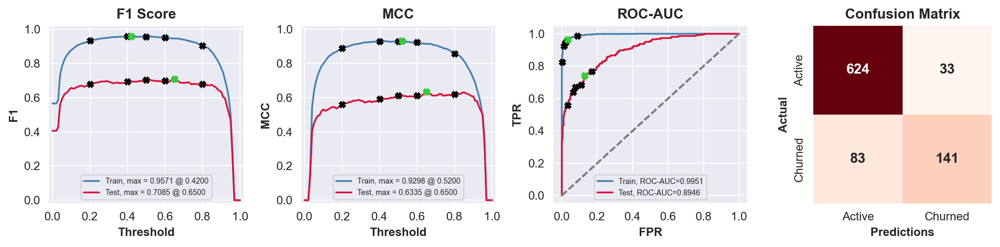

,train,test
ROC AUC,0.9951,0.8946
Accuracy,0.9665,0.8683
F1,0.9568,0.7085
MCC,0.9298,0.6335


In [200]:
stats= evaluate_model(best_models['Stack'], 'Stack',
                       X_train_up, y_train_up,
                       X_test, y_test,
                       train_times['Stack'])

In [201]:
# show feature reduced catboost performance for comparison
cat_test = best_models['Cat']
best_cols = X_train_subset.columns[:8]

cat_test.fit(X_train[best_cols], y_train)

probs = cat_test.predict_proba(X_test[best_cols])[:, 1]
round(metrics.roc_auc_score(y_test, probs), 4)

0.8931

The Stacking Ensemble maintains consistent performance on the test set with an **ROC-AUC score of 0.8946**. 

[Back to Contents](#contents)

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;"> <strong>Marlow you did a fantastic final evaulation. Comparing models across multiple metrics (F1, ROC-AUC, Accuracy, MCC) ensures a well-rounded evaluation of model performance.The iterative process of dropping low-importance features and analyzing their impact on performance highlights attention to optimizing model simplicity without compromising accuracy.</strong></div>

<div style="border: 2px solid darkgreen; padding: 10px; background-color: #d4f7d4; color: black; border-radius: 5px;"> <strong>Super innovative idea with the bar plots for metrics like F1, ROC-AUC, and MCC. This provides an intuitive way to compare model performance and identify the best-performing model. Using a color palette tied to models enhanced visual appeal.
</strong></div>

# 9. General Conclusion
<a id='finally'></a>

**Data Exploration**

The marketing team at Interconnect provided us with four datasets: contract, personal, internet, and service. These datasets contained 7043 clients and related information. After investigating the datasets, the following issues were detected:
- The `end_date` column contained `No` values which are not date values
- The `total_charges` column contained non-numeric blank values indicating some clients were new.
- Multiple datatypes were incorrect: `begin_date`, `end_date`, and `total_charges` are some examples.

**Data Preprocessing**

In this stage, the datasets were cleaned in the following ways:
- Merged the four datasets on the common `customer_id` column and filled the missing values in `internet_service` and `multiple_lines` with `not_subscribed`.
- Converted the column names into snake-case.
- Created the target variable `churned` from the `end_date` column.
- Replaced the `No` values in `end_date` with `None` and the ` ` values in `total_charges` with 0.
- Converted the data types of `begin_date` and `end_date` into `datetime`, the numerical `charge` columns into floats.
- Added the `monthly_payment` to the `total_charges` since the current records did not reflect the current month charge.

**Feature Engineering**
- `tenure_months` and `tenure_years`: Created from `begin_date` and `end_date`.
- `service_type`: Type of service the client is subscribed to (*landline communication, internet services, or both*)
- `tot_internet_services`: Adding the number of additional internet service packages
- `payment_method`: To classify the clients' payment method as either `automatic` or `manual`.
- `charge_group`: Identifying whether the client has monthly charges from 0-40, 40-70, 70-110, or 110+
- See [Appendix B](#apx_B) for additional pre-processing insights.

**Exploratory Data Analysis (EDA)**

-Please see the summary [Here](#eda_summ) for the full in depth EDA breakdown; otherwise below is our key observations:

- **Numerical Features:**
    - Clients with lower monthly charges churn less; churn is high within the first 2 years.
    - `charge_group` was introduced to improve segmentation
- **Categorical Features**
    - Focus on clients with:
      - **Monthly subscriptions**, **Electronic Check** payments, and **Streaming TV/Movies** packages.
      - Manual-payment users
    - Highest churn occurs in second half of the year (months 6-12), but more common in last 3 months (10-12). 
- **Target Class**:
    - Churned clients are less than 1/3 of active clients (imbalance addressed through class weights and upsampling)

- **Client Behavior Insights**:
    - Internet services correlate with higher churn risks.
    - Departure rates are **double** subscription rates, especially in the last 4 months.
- **Correlation Insights**:
    - Top predictors: `Service Type`, `Tenure`, `Payment Method`, and `Charge Group`
    - `Auto-payment` and `Payment Method` have perfect correlation (dropped one)
    - Weak predictor found to be `gender` as it has no correlation to the target or any other feature. This feature remained in the final dataset as no correlation does not result in no relevance.
    - `quarter` was dropped to avoid data leakage.
- **Final Feature Decisions**:
    - Dropped: `customer_id`, `begin/end_dates`, `auto_payment`, and `quarter`. 

**Modeling**

Before training the models, categorical features were encoded, and numerical features were scaled. To address the class imbalance in the target variable, the minority class in the training data was upsampled. A total of 10 models were developed, tuned with specific hyperparameters, and evaluated.

**Model Evaluation**

All models outperform the base model constantly predicting the majority class and achieve a minimum ROC-AUC score of 0.85 as required. **The Stacking Ensemble which has the highest validation ROC-AUC of 0.9248 is chosen as the final model.** 
We were unable to verify the top features in the stacking ensemble, but the top features for the CatBoost model were: `paperless_billing`, `total_charges`, `monthly_charges`, `partner`, `senior_citizen`, and `type_One_year`. Other model's top features generally included some combination of these along with `tenure_months`. The inclusion of `partner` is interesting. This shows that we could likely improve prediction power if other demographic data was included. 

The final model's predictions on the minority class are not perfect, if able to tune the ensemble we would likely see better predictions on the minority class. 

# 10. Recommendations
<a id='recs'></a>

1. Collect customer age data to enable better clustering and improve prediction performance.
2. Gather additional demographic data, such as occupation and living area, to provide richer input for analysis.
3. Gather external company data, such as review data, for a better understanding of customer churn.
4. Further refine advanced models, such as tuning the neural network or the stacking ensemble, through additional tuning.

# Appendix A: Saving Models
<a id='apx_A'></a>

---
Run the code below when you need to resave the models or add new ones to save. 

# Appendix B: PreProcessing Notes
<a id='apx_B'></a>

---
Below are the documented issues discovered during data exploration to be used for preprocessing. 

## Contract Notes

- The column labels are currently in pascal case and need to be converted to snake case.
- The `EndDate` column contains non-date values and therefore need to be replaced with a more appropriate value.
    - We will first replace the `No` values with `None` and then **convert to datetime**.
    - `BeginDate` also needs to be converted to datetime.
- `TotalCharges` contains non-numerics (single-space values) that need to be removed.
    - The IDs to remove are stored in ids_to_remove
    - The column then needs to be **converted to float64**
    - Add `MonthlyCharges` to `TotalCharges` to obtain the proper totals.

## Internet Notes
- Convert column labels from pascal case to snake case.
- Convert binary fields to numeric.
    - Convert **datatype to int64**.

## Personal Notes
- Convert `Partner` and `Dependents` to binary numeric fields and **convert to int64**.
- Convert column labels from pascal to snake case. 

## Phone
- Convert `MultipleLines` to binary numeric and **convert to int64**.
- Convert column labels from pascal to snake case.

## Feature Engineering Possibilities
- [x] Tenure for years, months, and days
- [x] Creating a dedicated `active` or `churned` column --> binary flag indicating if the client is active or has churned
- [x] Creating a categorical column describing the type of services subscribed (_landline, internet, or both_)
- [x] Creating a numerical column listing how many internet services the client is subscribed to
- [x] Creating a new column converting `payment_method` to either "manual" or "automatic"
- [x] Creating a new column converting `begin_date` to seasonal values

# Appendix C: Work Plan
<a id='the_plan'></a>

---

## Understanding the Project's Objectives and its Data (Frame the Problem)
- What is the company trying to solve?
- Why is the company trying to solve it?
- What are the objectives for the model to achieve?
    - _AUC-ROC  $\geq$ 0.85_

## Imported Modules
- Provide a section of all imported modules as in past projects.

## Data Overview
- Description of dataset and how they relate to each other.
- For each column:
  - Name
  - Type of Data
  - % Missing
  - Noisiness
  - Relevance for the Task
  - Type of Distribution
- **Observe**:
  - Sample rows, shape, duplicates, nulls, dtypes, and descriptive statistics (all).
- **Document Discovered Issues or Concerns for Preprocessing**:
  - Implicit erroneous values, particularly in categorical variables.
  - Opportunities for decomposing or creating features.
- Form Conclusion/Summary for preprocessing

## Preprocessing
- Merge the datasets on **CustomerID**
- Execute all fixes discovered during exploration
- Perform Feature Engineering if possible

---

# Exploratory Data Analysis (EDA)

## Numerical Features
- Visualize distributions:
  - Histograms
  - Boxplots
- Compare distributions between churned vs. retained customers.

## Categorical Features
- Visualize distributions:
  - Bar charts
  - Compare distributions between churned vs. retained customers - _using filled charts_.

## Target Class Distributions
- Is there an imbalance in the target class?

## Questions to Ask (Visuals to Provide):
- Are there noticeable differences in monthly payments between classes?
- Are there groups of clients that marketing can target based on monthly charges?
- What percentage of customers use each service type?
- Are there patterns in start and end dates?
    - When were customers joining and leaving?
    - What quarters were the most popular?
- Which features should be prioritized for comparison with the target class?

## Correlation Analysis
- Create a correlation matrix to observe relationships between numerical features and the target variable.

## Summary
- Summarize findings and key insights.

---

# Modeling

## Model Training
- Reuse functions and processes from previous projects where applicable - attempt to make improvements
    - Possibly create function for preparing and training models
    - Create function for evaluating models
    - Create function for loading and saving models - _saves time_
- Drop any determined unnecessary features lingering from EDA
- Split data into features and target
- Apply one-hot encoding and scaling - _use standard scaler_
- Address class imbalance through most appropriate means
- Split data into training, validation, and test sets (75:15:15)
- Train and evaluate the various models

## Models to Use
1. Dummy Classifier
2. Tree-based: Decision Tree or Random Forest
3. Logistic Regression (_linear would perform poorly_)
4. AdaBoost
5. CatBoost
6. XGBoost
7. LightGBM
8. HistGradientBoosting (new model)
9. Neural Network (self-challenge)
10. Stacking Ensemble (self-challenge, new model)
    - **_blend boosting and log-reg_**

## Model Evaluation
- Metrics:
  - **Primary**: AUC-ROC (goal: 0.85 or higher, aim for 0.88).
  - **Secondary**: Accuracy.
- Goals:
  - **Overfitting** is a concern so we will need to prioritize **regularization** more so than previous projects.

## Final Model Selection
- Select the model with the best performance on the validation set.
- Justify the choice based on evaluation metrics.

---

# Questions to Ask the Team Lead

1. How should class imbalance be handled? (e.g., oversampling, undersampling, class weights)
2. How will this solution be used by the company?
3. Are there any existing solutions to compare the performance against?
    - Are there any recommendations on specific models that have been successful in similar prediction tasks?
    - Can I reuse any experience or tools?
   > **Yes, I have worked on a churn problem before. In addition, I can reuse many functions and processes from previous projects to aid me in code development and analysis.** 
5. Are there specific features that need more in-depth analysis?
6. Which features should be prioritized during the analysis phase?
7. How would this problem be solved manually?
8. Are there any observable patterns that encourage customer retention?
9. What preferences are there for handling missing values?

---

# Additional Notes

- Revisit the objectives and assumptions after EDA.
- **Document any observations or challenges encountered during the analysis and modeling phases.**


# Appendix D: Challenges Faced
<a id='challenges'></a>

---

1. **Setting up Tensorflow Environment**
    - I spent 2.5 hours initially trying to get it installed. Failed.
    - Created new conda environment and eventually got it to work with a stable and productive python env for the project.
        -  Added skopt for bayesian optimization and this broke the whole environment. Had to start over as the env. wasn't backed up - didn't know I could, but now I do and skopt is added and the environment is backed up.
3. **Begin_date was same as end_date -- typo in code**
4. **Odd number of Mosaic**
5. **Target class imbalance - selecting a method and evaluating it in a quick time frame - deadline pressure.**
    - Begin with class weight adjustments. Assigning higher weights to the minority class to make the model more sensitive to it. With our robust parameter tuning this project, this method should work well.
    - Use SMOTE to oversample the minority and under sample the majority.
6. **Building Custom Matrix for Categorical Variables**
    - Used Cramer's V
7. **Data Leakage Experience**
    - Should've seen this one coming with leaving in the quarter feature.
    - Quarter was dervied from the `begin_date` field. `tenure` is also derived, technically, from `begin_date`. Therefore quarter should've never remained in the final dataset passed to models.
    - When evaluating, I was receiving normal scores during cross_validation, but perfect scores during training validation (after optimization).
8. **Low Test Set Scores**
    - Was achieving much lower than expected scores on the test set when the validation set had great scores.
    - I resampled entire training set and performe cross validations which led to data leakage within the folds..using bayessearchcv exasperated this issue.
    - Went step by step through code to find a point where issue occurred, happened at add_cv_row, and uring model tuning, both functions rewritten. 

<div style="
    border: 3px solid; 
    border-image: linear-gradient(to right, #ff7eb3, #ff758c, #ff6c66, #ff6340) 1; 
    padding: 15px; 
    background: linear-gradient(135deg, #f0f8ff, #e6f7ff); 
    color: #333; 
    font-family: 'Arial', sans-serif; 
    font-size: 16px; 
    border-radius: 10px; 
    box-shadow: 0px 4px 8px rgba(0, 0, 0, 0.2);
">
    <strong>Marlow you have donbe a great job with this project. This project is an excellent example of a complete machine learning workflow, demonstrating both technical skill and a thoughtful approach to problem-solving. From data exploration to preprocessing, feature engineering, and model evaluation, every step has been carried out with care and attention to detail. The use of advanced techniques like Bayesian Optimization, ensemble models, and class imbalance handling shows a strong understanding of practical challenges in machine learning. By combining clear visualizations, meaningful metrics, and an iterative approach to feature selection, the project not only achieves impressive results but also ensures that the process is easy to interpret and explain.</strong>
</div>
